# Packages and Functions

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import seaborn as sns

pd.set_option('display.max_columns', None)

In [4]:
def adjust_data_types(df):
    for col in df.columns:
        unique_vals = df[col].unique()
        if df[col].dtypes == 'object':
            None
#         elif (set(unique_vals) == {0, 1}) or col == 'userId':
#             df[col] = df[col].astype('int64')
#         else:
#             df[col] = df[col].astype('float64')
        elif (set(unique_vals) != {0, 1}):
            df[col] = df[col].astype('float64')
        else:
            df[col] = df[col].astype('int64')
    return df

In [5]:
# ho_t02['userId'] = ho_t02['userId'].astype('str')
# ho_t02 = adjust_data_types(ho_t02)
# ho_t02.info()

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.feature_selection import RFE, RFECV, VarianceThreshold

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, make_scorer, confusion_matrix, roc_curve
from sklearn.model_selection import GridSearchCV, StratifiedKFold, permutation_test_score
from sklearn.base import clone


from imblearn.metrics import geometric_mean_score
import shap

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline
# from sklearn.pipeline import Pipeline

import dice_ml

from catboost import CatBoostClassifier

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
UserConfigValidationException will be deprecated from dice_ml.utils. Please import UserConfigValidationException from raiutils.exceptions.


In [7]:
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    return specificity

specificity_scorer = make_scorer(specificity_score)

def npv_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn + fn)
    return npv

npv_scorer = make_scorer(npv_score)

g_mean_scorer = make_scorer(geometric_mean_score)


skf = StratifiedKFold(10, shuffle=True, random_state=0)

# def get_cat_cols(df):
#     one_hot_encoded_columns = []

#     for idx, column in enumerate(df.columns):
#         if df[column].nunique() == 2 and set(df[column].unique()) == {0, 1}:
#             one_hot_encoded_columns.append(idx)

#     return one_hot_encoded_columns

def get_cat_cols(df):
    return df.select_dtypes(include=['object']).columns.tolist()

# get_cat_cols(ho_t02)
# cat_cols = get_cat_cols(ho_t02)
# num_cols = [col for col in ho_t02.columns if col not in cat_cols]
# cat_cols, num_cols

In [8]:
from sklearn.decomposition import PCA

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours, TomekLinks
from imblearn.combine import SMOTEENN, SMOTETomek


from sklearn.base import BaseEstimator, TransformerMixin

class DropCategoricalFeatures(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        # Assuming X is a DataFrame
        non_categorical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
        return X[non_categorical_cols]


def knn_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', KNeighborsClassifier())
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_neighbors': list(range(1, 16)),
        'classifier__metric': ['euclidean', 'cosine', 'hamming', 'braycurtis',
                               'chebyshev', 'canberra', 'cityblock', 'sqeuclidean'
                              ]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def svm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', SVC(random_state=random_state, max_iter=1000,
                           verbose=True))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#         ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__probability': [True, False],
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def logreg_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('drop_categorical', None),
#         ('encoder', None),
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', LogisticRegression(random_state=random_state, max_iter=1000))
    ])

    param_grid = {
#         'drop_categorical': [None, DropCategoricalFeatures()]
#         'encoder': [None, OneHotEncoder(sparse_output=False)],
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l2', None],
        'classifier__solver': ['liblinear', 'lbfgs', 'newton-cholesky']
#         'classifier__penalty': ['l1', l2', 'elasticnet', 'None']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def dt_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]


    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(), 
#             RobustScaler(),
#             MinMaxScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
            SMOTEENN(random_state=random_state),
            SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
            TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
#         'classifier__max_depth': [3],
# #         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [1],
#         'classifier__max_depth': [2, 5],
#         'classifier__min_samples_split': [3],
#         'classifier__min_samples_leaf': [3],
# #         'classifier__max_features': ['auto', 'sqrt', 'log2', None],
#         'classifier__criterion': ["entropy", "log_loss"]
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [2, 3],
        'classifier__max_depth': [2, 3, 5],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__max_features': ['auto', 'sqrt', 'log2', None],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

from sklearn.decomposition import TruncatedSVD

def rf_class2(df, scorer, label_col, scaler, random_state=0):
#     df_majority = df[df.home_ownership_class == 0]
#     df_minority = df[df.home_ownership_class == 1]

# #     display(df_majority)
# #     display(df_minority)
# #     print(len(df_majority), len(df_minority))
#     # Randomly downsample majority class
#     df_majority_downsampled = df_majority.sample(frac=0.2,
#                                                  random_state=random_state)
#     df = pd.concat([df_majority_downsampled, df_minority], axis=0)

    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)

#     n_components = X_scaled.shape[1]  # Maximum number of components
#     svd = TruncatedSVD(n_components=n_components)
#     X_svd = svd.fit_transform(X_scaled)

#     # Step 3: Find number of components that explain at least 90% variance
#     cum_variance = np.cumsum(svd.explained_variance_ratio_)
#     num_components = np.argmax(cum_variance >= 0.90) + 1  # +1 because Python indexing starts from 0
#     X_selected = X_svd[:, :num_components]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

#     X_resampled, y_resampled = RandomOverSampler(random_state=random_state).fit_resample(X_train, y_train)
#     class_counts_original = np.bincount(y_train.astype(int))
#     class_counts_resampled = np.bincount(y_resampled.astype(int))

    # Assuming 0 is the majority class, calculate its upweight factor
#     majority_class_original = class_counts_original[0]
#     majority_class_resampled = class_counts_resampled[0]
#     upweight_factor = majority_class_original / majority_class_resampled

#     minority_class_original = class_counts_original[1]
#     minority_class_resampled = class_counts_resampled[1]
#     downweight_factor = minority_class_original / minority_class_resampled

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', RandomForestClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_estimators': [200, 300],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__oob_score': [True, False],
        'classifier__criterion': ["gini", "entropy", "log_loss"]

#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__oob_score': [True, False],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
    }
#         'classifier__n_estimators': [200, 250, 300],
# #         'classifier__max_depth': [2, 3, 4],
#         'classifier__max_depth': [2],
#         'classifier__class_weight': [{0: 263/807, 1:1}],
#         'classifier__oob_score': [True],
# #         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
#     }
    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def gbm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', GradientBoostingClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
        'classifier__n_estimators': [200, 250],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     plt.figure(figsize=(10, 6))
#     plt.plot(range(1, len(explained_var_ratio)+1), cumulative_explained_var, marker='o', linestyle='--')
#     plt.title('Cumulative Explained Variance Plot')
#     plt.xlabel('Number of Components')
#     plt.ylabel('Cumulative Explained Variance')
#     plt.grid(True)
#     plt.show()

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [400, 450],
#         'classifier__learning_rate': [0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__max_depth': [2, 3],
#         'classifier__boosting_type': ['gbdt', 'dart', 'goss']

        'classifier__n_estimators': [200, 300, 400],
        'classifier__learning_rate': [0.1, 0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
        'classifier__max_depth': [2, 3],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def xgb_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', XGBClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
# #         'classifier__n_estimators': [200, 250],
#         'classifier__learning_rate': [2, 3],
# #         'classifier__max_depth': [2, 3],
#         'classifier__max_leaves': [5],
#         'classifier__grow_policy': ['depthwise', 'lossguide']
        'classifier__n_estimators': [200, 250],
        'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__max_depth': [None, 2, 3],
        'classifier__max_leaves': [10, 20, 30],
        'classifier__grow_policy': ['depthwise', 'lossguide']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', AdaBoostClassifier(
            random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [200, 300],
        'classifier__estimator': [
            DecisionTreeClassifier(
            random_state=random_state,
#             criterion='entropy', max_depth=3,
#             min_samples_leaf=2, min_samples_split=2
        ),
                                  RandomForestClassifier(
            random_state=random_state,
            # max_depth=6, min_samples_leaf=2,
            # min_samples_split=2,
            # n_estimators=250,
#             oob_score=True
                                                        )],
#         'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    train_score = best_estimator.score(X_train, y_train)
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    # print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    # print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    print('Train Score of Best Model:', train_score)
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        # 'mean_train_score': np.mean(cv_results['mean_train_score']),
        # 'std_train_score': np.mean(cv_results['std_train_score']),
        'train_score': train_score,
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

from sklearn.linear_model import RidgeClassifier

def ridge_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]
    
    cat_transformer = Pipeline([
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])
    
    num_transformer = Pipeline([
        ('variance_threshold', VarianceThreshold(threshold=0.15))
    ])
    
    preprocessor = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols),
            ('cat', cat_transformer, cat_cols)
        ],
        remainder='passthrough'
    )

    preprocessor_num = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols)
        ],
        remainder='drop'
    )

    preprocessor_drop_cat = ColumnTransformer(
        transformers = [
            ('num', 'passthrough', num_cols)
        ],
        remainder='drop'
    )

    pipeline = Pipeline([
#         ('preprocessor', None),
        ('preprocessor', preprocessor_drop_cat),
        ('scaler', scaler),
        ('resampling', None),
        ('var_threshold', VarianceThreshold(threshold=0.15)),
        ('classifier', RidgeClassifier(max_iter=1000, random_state=random_state))
    ])

    param_grid = {
#         'preprocessor': [
#             preprocessor_drop_cat,
#             preprocessor,
#             preprocessor_num            
#         ],
        'resampling': [ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__alpha': [0.01, 0.1, 1, 10, 100, 1000],
        'classifier__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'],
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def catboost_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', CatBoostClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_leaf': [2, 3],
#         'classifier__min_samples_split': [2, 3],
#         'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

## Outlier Analysis Functions

In [9]:
from sklearn.covariance import EllipticEnvelope
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest

def plot_hist_ee(df, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = EllipticEnvelope(random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel('Elliptic Envelope scores')
    plt.ylabel('Frequency')
    plt.title(f'Elliptic Envelope score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ee(df, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'Elliptic Envelope, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_gmm(df, n_components, covariance_type='full', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = GaussianMixture(n_components=n_components,
                            covariance_type=covariance_type,
                            random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_components}-component Gaussian Mixture Model scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_components}-component Gaussian Mixture Model score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_gmm(df, n_components, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_components}-component Gaussian Mixture Model, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_lof(df, n_neighbors=20, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = LocalOutlierFactor(n_neighbors=n_neighbors)
    model.fit(scaled_data)
    
#     model_scores = model.score_samples(scaled_data)
    model_scores = model.negative_outlier_factor_
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_lof(df, n_neighbors, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_ocsvm(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_hist_ocsvm2(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ocsvm(df, kernel, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

def plot_hist_if(df, n_estimators=100, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = IsolationForest(n_estimators=n_estimators, random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_estimators}-estimator Isolation Forest (IF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_if(df, n_estimators, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

# Loading and Preprocessing the Dataset

In [10]:
# Loading the dataset
dataset = pd.read_csv('data/df_merged_no_nans.csv')
# dataset = dataset.drop('Unnamed: 0', axis=1)

# Creating 'daysFromDateEntryStart'
dataset['dateEntry'] = pd.to_datetime(dataset['dateEntry'], format='%Y-%m-%d')
dateEntryStart = pd.to_datetime('2022-03-28', format='%Y-%m-%d')
dataset['daysFromDateEntryStart'] = (dataset['dateEntry'] - dateEntryStart).dt.days

# Dropping irrelevant columns
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'occupation', 'dateEntry'
]
dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

# One-hot encoding of categorical columns
# dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
# dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
# dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int')

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

dataset

,userId,lastFirstName,age,gender,province,job,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,25,1
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,166,0
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,7,1
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,MALE,METRO MANILA,ASSOCIATE PROFESSIONAL,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,232,0
1066,12852,"TEJADA, JERIC",27,MALE,LAGUNA,CRAFT AND TRADE,20,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,232,0
1067,12853,"RAMOS, RHEALYN",27,FEMALE,CAVITE,SERVICE AND SALES,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,232,0
1068,12854,"BURGOS, LIEZEL",48,FEMALE,ILOILO,SERVICE AND SALES,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,232,0


In [11]:
df = dataset.copy()

df['monthlyUtilityBills'] = (
    df['water'] + df['electricity'] + df['rent'] +
    df['internet'] + df['mobileLoad']
)
df['monthlyVices'] = (
    df['smoking'] + df['alcohol'] + df['gambling'] +
    df['smallLottery'] + df['otherVices']
)
df['monthlyExpenses'] = (
    df['food'] + df['hygiene'] + df['houseCleaning'] +
    df['fare'] + df['parking'] + df['gasoline'] +
    df['tuition'] + df['allowance'] + df['uniform'] +
    df['otherEducation'] + df['emergency'] + df['medicine'] +
    df['repair'] + df['cinema'] + df['dineOut'] +
    df['leisure'] + df['personalCare'] + df['clothing'] +
    df['vehicleLoan'] + df['monthlyUtilityBills'] +
    df['informalLenders'] + df['companyLoan'] + df['privateLoans'] +
    df['governmentLoans'] + df['monthlyVices']
)
df['monthlySoloNetIncome'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncome'] = (
    df['monthlySoloNetIncome'] > 0
).astype(int)
df['monthlyFamilyNetIncome'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncome'] = (
    df['monthlyFamilyNetIncome'] > 0
).astype(int)
df['monthlySoloNetIncomeWithSavings'] = (
    df['basicMonthlySalary'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncomeWithSavings'] = (
    df['monthlySoloNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyIncome'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome'] - df['basicMonthlySalary']
)
df['positive monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome - basicMonthlySalary'] > 0
).astype(int)
df['basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positive basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary - monthlyExpenses'] > 0
).astype(int)
df['monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positive monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome - monthlyExpenses'] > 0
).astype(int)
df['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['monthlyFamilyIncome']
)
df['monthlyExpenses / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['basicMonthlySalary']
)
df['monthlyExpenses / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['monthlyFamilyIncome']
)
df['monthlyVices / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyVices'] / df['basicMonthlySalary']
)
df['monthlyVices / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyVices'] / df['monthlyFamilyIncome']
)
df['basicMonthlySalary / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['workingFamilyCount']
)
df['basicMonthlySalary / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['residentsCount']
)
df['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['workingFamilyCount']
)
df['monthlyFamilyIncome / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['residentsCount']
)
df['monthlyExpenses / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['workingFamilyCount']
)
df['monthlyExpenses / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['residentsCount']
)
df['monthlyUtilityBills / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['workingFamilyCount']
)
df['monthlyUtilityBills / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['residentsCount']
)
dataset = df.copy()

# Convert all int32 columns to int64
for col in dataset.select_dtypes(include='int32').columns:
    dataset[col] = dataset[col].astype('int64')

dataset['userId'] = dataset['userId'].astype(str)
dataset

,userId,lastFirstName,age,gender,province,job,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,25,1,50,0,2950,16050,1,37050.0,1,18050,1,39050.0,1,21000.0,1,16050,1,37050.0,1,0.475000,0.155263,0.073750,0.000000,0.000000,6333.333333,6333.333333,13333.333333,13333.333333,983.333333,983.333333,16.666667,16.666667
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,1400,0,15900,-900,0,14100.0,1,1100,1,16100.0,1,15000.0,1,-900,0,14100.0,1,0.500000,1.060000,0.530000,0.000000,0.000000,7500.000000,3750.000000,15000.000000,7500.000000,7950.000000,3975.000000,700.000000,350.000000
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,166,0,1100,0,7250,12750,1,22750.0,1,13750,1,23750.0,1,10000.0,1,12750,1,22750.0,1,0.666667,0.362500,0.241667,0.000000,0.000000,NaN,6666.666667,NaN,10000.000000,NaN,2416.666667,NaN,366.666667
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,7,1,3800,0,8168,13032,1,3832.0,1,13532,1,4332.0,1,-9200.0,0,13032,1,3832.0,1,1.766667,0.385283,0.680667,0.000000,0.000000,NaN,4240.000000,NaN,2400.000000,NaN,1633.600000,NaN,760.000000
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,0,4300,0,23800,-4000,0,1200.0,1,6000,1,11200.0,1,5200.0,1,-4000,0,1200.0,1,0.792000,1.202020,0.952000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [12]:
cols_with_nulls = [
    'monthlyExpenses / basicMonthlySalary',
    'monthlyVices / basicMonthlySalary',
    'basicMonthlySalary / workingFamilyCount',
    'basicMonthlySalary / residentsCount',
    'monthlyFamilyIncome / workingFamilyCount',
    'monthlyFamilyIncome / residentsCount',
    'monthlyExpenses / workingFamilyCount',
    'monthlyExpenses / residentsCount',
    'monthlyUtilityBills / workingFamilyCount',
    'monthlyUtilityBills / residentsCount'
]
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1070 entries, 0 to 1069
Data columns (total 92 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   userId                                             1070 non-null   object 
 1   lastFirstName                                      1070 non-null   object 
 2   age                                                1070 non-null   int64  
 3   gender                                             1070 non-null   object 
 4   province                                           1070 non-null   object 
 5   job                                                1070 non-null   object 
 6   basicMonthlySalary                                 1070 non-null   int64  
 7   preferredNetDisposableIncomeId                     1070 non-null   int64  
 8   workingFamilyCount                                 1070 non-null   int64  
 9   resident

In [13]:
dataset[dataset['monthlyExpenses / basicMonthlySalary'].isnull()]

,userId,lastFirstName,age,gender,province,job,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
1045,12816,"TORRES, EUGENE",42,MALE,METRO MANILA,SERVICE AND SALES,0,2,1,1,30000.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,231,1,0,0,0,0,0,30000.0,1,0,0,30000.0,1,30000.0,1,0,0,30000.0,1,0.0,NaN,0.0,NaN,0.0,0.0,0.0,30000.0,30000.0,0.0,0.0,0.0,0.0


In [14]:
dataset.loc[:, 'basicMonthlySalary'].describe()

count    1.070000e+03
mean     3.516346e+04
std      1.453406e+05
min      0.000000e+00
25%      1.600000e+04
50%      2.000000e+04
75%      3.000000e+04
max      2.534900e+06
Name: basicMonthlySalary, dtype: float64

# HO_T01: Original (OHE only)

In [15]:
t01 = dataset.copy().drop(columns=cols_with_nulls)
# t01_num = t01.drop(columns=['gender', 'province', 'job'])
t01 = pd.get_dummies(t01, columns=['gender'], prefix='gender', drop_first='True')
t01 = pd.get_dummies(t01, columns=['province'], prefix='province', drop_first='True')
t01 = pd.get_dummies(t01, columns=['job'], prefix='job', drop_first='True')

t01.isna().sum()[t01.isna().sum() > 0]
# t01 = t01.loc[:, ['userId', 'lastFirstName', ]]

Series([], dtype: int64)

## Outlier Analysis Template

### Elliptic Envelope

In [ ]:
# scores = plot_hist_ee(ho_t01_num, bins=10_000, xlim=-1e8)

In [ ]:
# for i in np.arange(-1e11, 1, 2e10):
#     plot_ee(ho_t01, scores, i)

### Gaussian Mixture Model (GMM)

#### 1-component GMM

In [ ]:
# k = 1

# scores = plot_hist_gmm(ho_t01_num, k, covariance_type='full',
#                        bins=1_000)

In [ ]:
# for i in np.arange(-600, -150, 30):
#     plot_gmm(ho_t01, k, scores, i)

### Local Outlier Factor

### One-Class SVM

### Isolation Forest

In [ ]:
# k = 'rbf'

# scores = plot_hist_ocsvm(ho_t01_num, kernel=k,
#                          bins=1_000)

# ho_t01_outliers = plot_ocsvm(ho_t01_num, k, scores, 360)
# print(ho_t01_outliers)

### Final Outlier Removal

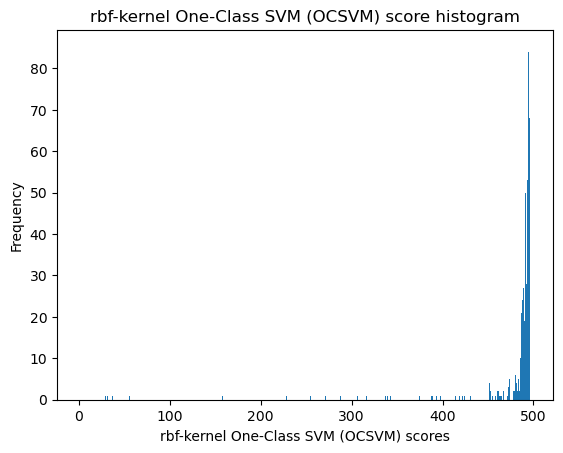

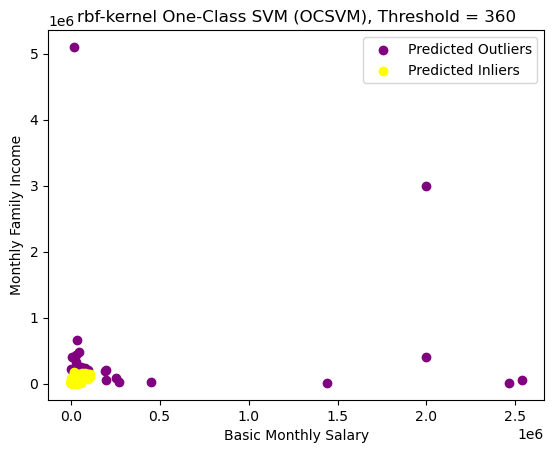

Number of predicted outliers: 38


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,True


[14, 24, 32, 50, 70, 114, 162, 200, 231, 253, 299, 323, 325, 380, 391, 405, 417, 435, 515, 556, 558, 563, 568, 584, 608, 677, 692, 702, 706, 762, 773, 830, 868, 912, 929, 940, 1009, 1046]


In [ ]:
# k = 'rbf'

# scores = plot_hist_ocsvm(ho_t01_num, kernel=k,
#                          bins=1_000)

# ho_t01_outliers = plot_ocsvm(ho_t01_num, k, scores, 360)
# print(ho_t01_outliers)

## EDA on Dataset

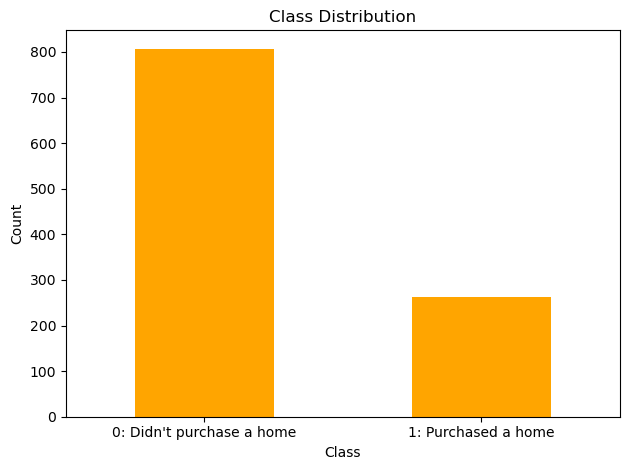

0    0.754206
1    0.245794
Name: home_ownership_class, dtype: float64

In [16]:
df = t01
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
df['home_ownership_class'].value_counts(normalize=True)

## Runs: RobustScaler

In [17]:
scaler = RobustScaler()

In [18]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.44305555555555554
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Train Score of Best Model: 1.0
GridSearchCV Runtime: 22.33450961112976 secs
Run 1 - Random State: 0
Test Precision: 0.5555555555555556
Run 2 - Random State: 1
Test Precision: 0.4444444444444444
Run 3 - Random State: 2
Test Precision: 0.4642857142857143
Run 4 - Random State: 3
Test Precision: 0.391304347826087
Run 5 - Random Stat

## AdaBoost Loss vs. Number of Trees

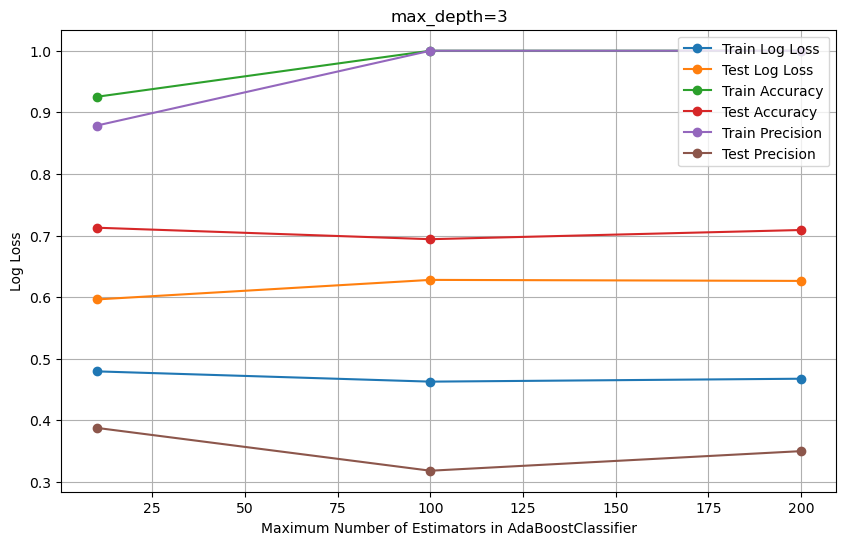

In [22]:
from sklearn.metrics import log_loss

label_col = 'home_ownership_class'
random_state = 0
df = t01
scorer = 'precision'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=random_state)

# n_estimators_range = list(range(10, 1010, 10))
# n_estimators_range = list(range(10, 110, 10))
n_estimators_range = [10, 100, 200]
train_log_loss = []
test_log_loss = []
train_accuracy = []
test_accuracy = []
train_precision = []
test_precision = []

for n_estimators in n_estimators_range:
    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', SMOTE(random_state=0)),
        ('classifier', AdaBoostClassifier(
            algorithm='SAMME',
            n_estimators=n_estimators,
            estimator=RandomForestClassifier(n_estimators=100,
                                             max_depth=3,
                                            #  min_samples_split=10,
                                            #  min_samples_leaf=10,
                                            ),
            random_state=random_state))
    ])

    pipeline.fit(X_train, y_train)

    # Predict class probabilities
    train_probs = pipeline.predict_proba(X_train)
    test_probs = pipeline.predict_proba(X_test)
    
    # Calculate log loss for training and testing data
    train_loss = log_loss(y_train, train_probs)
    test_loss = log_loss(y_test, test_probs)
    
    # Calculate training and testing accuracy
    train_pred = pipeline.predict(X_train)
    test_pred = pipeline.predict(X_test)
    train_acc = accuracy_score(y_train, train_pred)
    test_acc = accuracy_score(y_test, test_pred)

    # Calculate training and testing precision
    train_prec = precision_score(y_train, train_pred)
    test_prec = precision_score(y_test, test_pred)

    train_log_loss.append(train_loss)
    test_log_loss.append(test_loss)
    train_accuracy.append(train_acc)
    test_accuracy.append(test_acc)
    train_precision.append(train_prec)
    test_precision.append(test_prec)

# Plot the log loss curve
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, train_log_loss, label='Train Log Loss', marker='o')
plt.plot(n_estimators_range, test_log_loss, label='Test Log Loss', marker='o')
plt.plot(n_estimators_range, train_accuracy, label='Train Accuracy', marker='o')
plt.plot(n_estimators_range, test_accuracy, label='Test Accuracy', marker='o')
plt.plot(n_estimators_range, train_precision, label='Train Precision', marker='o')
plt.plot(n_estimators_range, test_precision, label='Test Precision', marker='o')

plt.xlabel('Maximum Number of Estimators in AdaBoostClassifier')
plt.ylabel('Log Loss')
plt.legend()
plt.title('max_depth=3')
plt.grid()
plt.show()

## Functions

In [140]:
def modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title):
    num_random_states = 5

    label_col = 'home_ownership_class'
    df = t01
    scorer = 'precision'
    scaler = RobustScaler()
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    # n_estimators_range = [10, 20, 200]
    # n_estimators_range = list(range(10, 110, 10))
    # n_estimators_range = list(range(20, 120, 20))
    train_log_loss = np.zeros((len(n_estimators_range), num_random_states))
    test_log_loss = np.zeros((len(n_estimators_range), num_random_states))
    train_accuracy = np.zeros((len(n_estimators_range), num_random_states))
    test_accuracy = np.zeros((len(n_estimators_range), num_random_states))
    train_precision = np.zeros((len(n_estimators_range), num_random_states))
    test_precision = np.zeros((len(n_estimators_range), num_random_states))

    for state in range(num_random_states):
        random_state = state  # Set the random state for this iteration
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=random_state)

        for i, n_estimators in enumerate(n_estimators_range):
            pipeline = Pipeline([
                ('scaler', scaler),
                ('resampling', SMOTE(random_state=0)),
                ('classifier', AdaBoostClassifier(
                        algorithm='SAMME',
                        n_estimators=n_estimators,
                        estimator=RandomForestClassifier(
                            # n_estimators=100,
                            **classifier_params,
                            ),
                        random_state=0)
                    )
            ])

            pipeline.fit(X_train, y_train)

            # Predict class probabilities
            train_probs = pipeline.predict_proba(X_train)
            test_probs = pipeline.predict_proba(X_test)

            # Calculate log loss for training and testing data
            train_loss = log_loss(y_train, train_probs)
            test_loss = log_loss(y_test, test_probs)

            # Calculate training and testing accuracy
            train_pred = pipeline.predict(X_train)
            test_pred = pipeline.predict(X_test)
            train_acc = accuracy_score(y_train, train_pred)
            test_acc = accuracy_score(y_test, test_pred)

            # Calculate training and testing precision
            train_prec = precision_score(y_train, train_pred)
            test_prec = precision_score(y_test, test_pred)

            train_log_loss[i, state] = train_loss
            test_log_loss[i, state] = test_loss
            train_accuracy[i, state] = train_acc
            test_accuracy[i, state] = test_acc
            train_precision[i, state] = train_prec
            test_precision[i, state] = test_prec

    # Calculate average and standard deviation for each metric
    avg_train_log_loss = np.mean(train_log_loss, axis=1)
    std_train_log_loss = np.std(train_log_loss, axis=1)
    avg_test_log_loss = np.mean(test_log_loss, axis=1)
    std_test_log_loss = np.std(test_log_loss, axis=1)
    avg_train_accuracy = np.mean(train_accuracy, axis=1)
    std_train_accuracy = np.std(train_accuracy, axis=1)
    avg_test_accuracy = np.mean(test_accuracy, axis=1)
    std_test_accuracy = np.std(test_accuracy, axis=1)
    avg_train_precision = np.mean(train_precision, axis=1)
    std_train_precision = np.std(train_precision, axis=1)
    avg_test_precision = np.mean(test_precision, axis=1)
    std_test_precision = np.std(test_precision, axis=1)

    # Plot the log loss curve with error bars
    plt.figure(figsize=(10, 6))
    plt.errorbar(n_estimators_range, avg_train_log_loss, yerr=std_train_log_loss, label='Train Log Loss', marker='o')
    plt.errorbar(n_estimators_range, avg_test_log_loss, yerr=std_test_log_loss, label='Test Log Loss', marker='o')
    plt.errorbar(n_estimators_range, avg_train_accuracy, yerr=std_train_accuracy, label='Train Accuracy', marker='o')
    plt.errorbar(n_estimators_range, avg_test_accuracy, yerr=std_test_accuracy, label='Test Accuracy', marker='o')
    plt.errorbar(n_estimators_range, avg_train_precision, yerr=std_train_precision, label='Train Precision', marker='o')
    plt.errorbar(n_estimators_range, avg_test_precision, yerr=std_test_precision, label='Test Precision', marker='o')

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.title(title)
    plt.grid()
    plt.show()

    print('Avg Train Accuracy:\n', avg_train_accuracy)
    print('Avg Test Accuracy:\n', avg_test_accuracy)
    print('Avg Train Precision:\n', avg_train_precision)
    print('Avg Test Precision:\n', avg_test_precision)
    print('Avg Train Log Loss:\n', avg_train_log_loss)
    print('Avg Test Log Loss:\n', avg_test_log_loss)

## Varying `n_estimators` of AdaBoostClassifier()

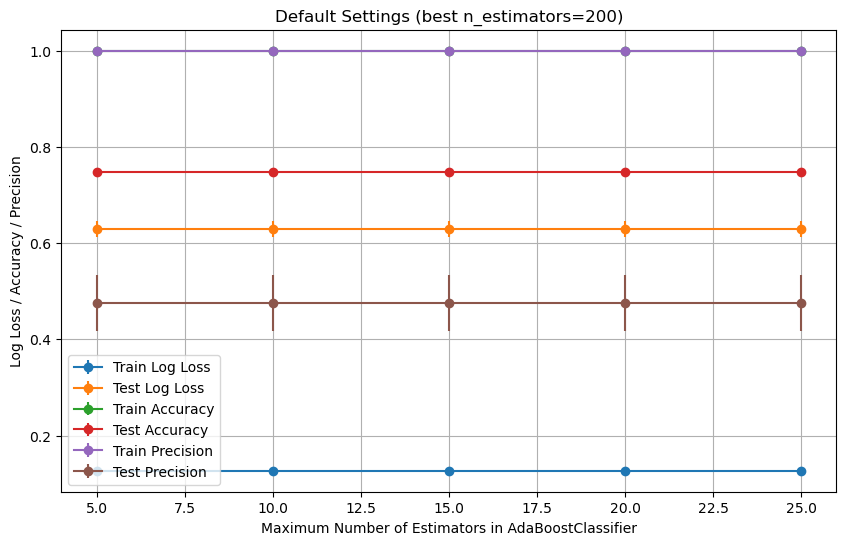

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.74850746 0.74850746 0.74850746 0.74850746 0.74850746]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.47587992 0.47587992 0.47587992 0.47587992 0.47587992]
Avg Train Log Loss:
 [0.12692801 0.12692801 0.12692801 0.12692801 0.12692801]
Avg Test Log Loss:
 [0.62991309 0.62991309 0.62991309 0.62991309 0.62991309]


In [142]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'Default Settings (best n_estimators=200)'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### Varying `max_depth` of `RFClassifier()` from 1-5
- Lower test precision than default.

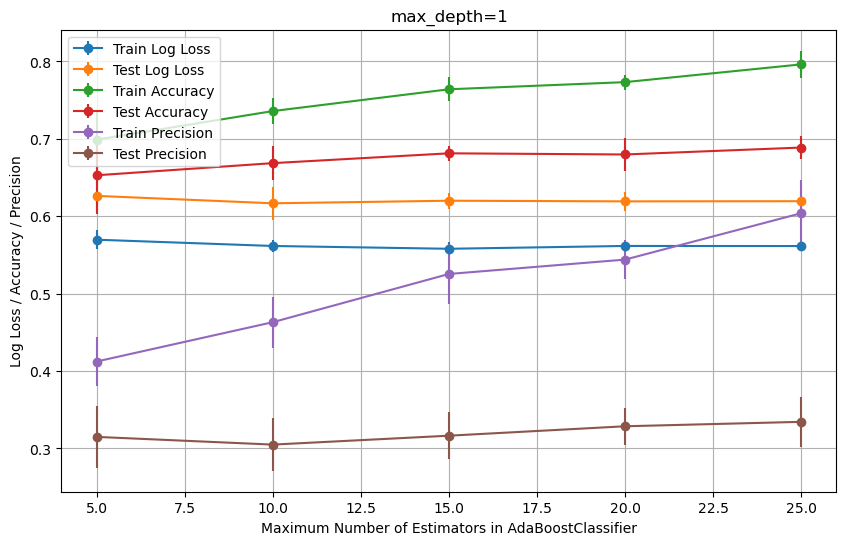

Avg Train Accuracy:
 [0.69900249 0.73591022 0.76408978 0.77331671 0.79625935]
Avg Test Accuracy:
 [0.65298507 0.66865672 0.68134328 0.67985075 0.68880597]
Avg Train Precision:
 [0.41237758 0.46315887 0.52546643 0.54404417 0.60394302]
Avg Test Precision:
 [0.31497816 0.30501647 0.3165228  0.32869516 0.33442844]
Avg Train Log Loss:
 [0.56974876 0.56164199 0.55801671 0.56166584 0.56153642]
Avg Test Log Loss:
 [0.62635666 0.61677996 0.62010858 0.61927012 0.61949243]


In [143]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'max_depth': 1,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=1'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

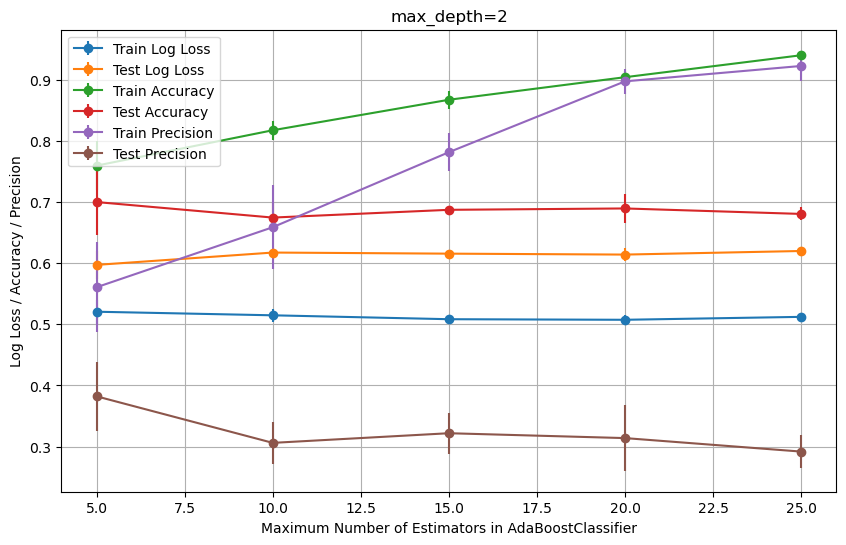

Avg Train Accuracy:
 [0.759601   0.81745636 0.86733167 0.9042394  0.94014963]
Avg Test Accuracy:
 [0.7        0.67462687 0.68731343 0.68955224 0.68059701]
Avg Train Precision:
 [0.56072114 0.65884989 0.781568   0.89745883 0.92261979]
Avg Test Precision:
 [0.38223038 0.30613039 0.32190525 0.31393902 0.29186755]
Avg Train Log Loss:
 [0.52062669 0.51477438 0.5083902  0.50744985 0.51224211]
Avg Test Log Loss:
 [0.59725185 0.61741612 0.61562551 0.61409971 0.61996845]


In [144]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'max_depth': 2,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=2'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

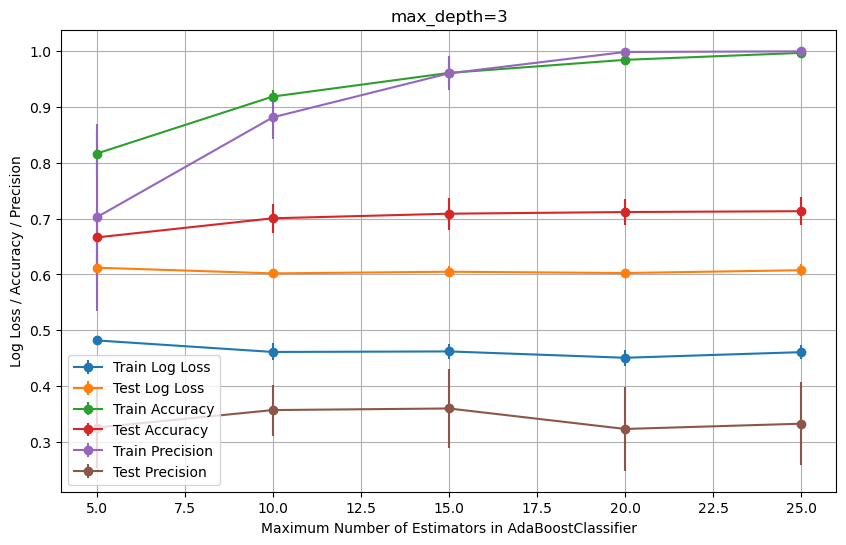

Avg Train Accuracy:
 [0.81670823 0.91895262 0.96134663 0.98478803 0.99725686]
Avg Test Accuracy:
 [0.66641791 0.70074627 0.70895522 0.7119403  0.71343284]
Avg Train Precision:
 [0.70248591 0.88170981 0.9605516  0.9988764  1.        ]
Avg Test Precision:
 [0.32546965 0.35694865 0.35981011 0.32310076 0.33250542]
Avg Train Log Loss:
 [0.4818076  0.46111456 0.46207739 0.45071266 0.46077464]
Avg Test Log Loss:
 [0.61217219 0.60195454 0.60491747 0.60262112 0.60762931]


In [145]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'max_depth': 3,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=3'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

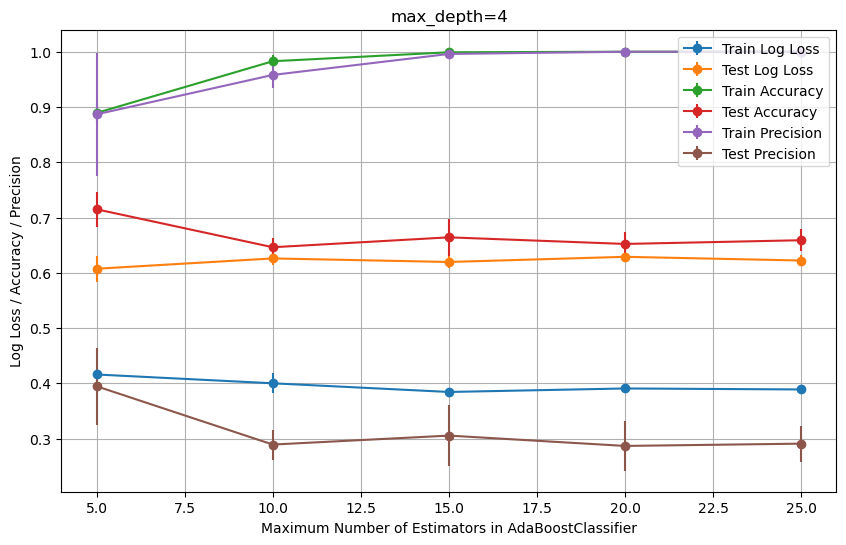

Avg Train Accuracy:
 [0.88927681 0.98279302 0.99900249 1.         1.        ]
Avg Test Accuracy:
 [0.71492537 0.64626866 0.6641791  0.65223881 0.65895522]
Avg Train Precision:
 [0.886739   0.95800299 0.9959899  1.         1.        ]
Avg Test Precision:
 [0.39471781 0.28924737 0.30547181 0.28678702 0.29089835]
Avg Train Log Loss:
 [0.41601759 0.40011098 0.38441979 0.39074938 0.38895822]
Avg Test Log Loss:
 [0.60738473 0.6260346  0.61960492 0.62894218 0.6222461 ]


In [146]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'max_depth': 4,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=4'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

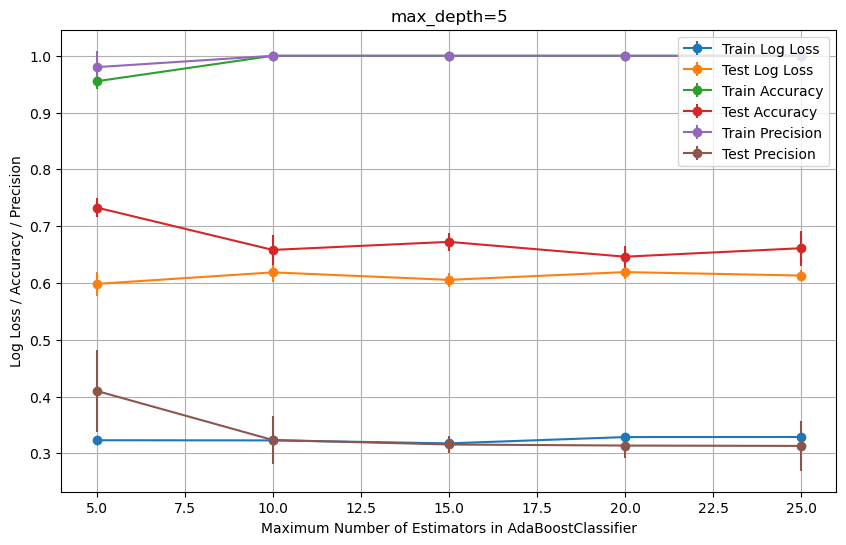

Avg Train Accuracy:
 [0.95511222 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.73283582 0.65820896 0.67238806 0.64626866 0.66119403]
Avg Train Precision:
 [0.97998157 1.         1.         1.         1.        ]
Avg Test Precision:
 [0.40997316 0.3235407  0.31561708 0.3137393  0.31311434]
Avg Train Log Loss:
 [0.3231097  0.32282839 0.31759576 0.3286796  0.32883862]
Avg Test Log Loss:
 [0.59837999 0.61864939 0.60549305 0.6191417  0.61305861]


In [147]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'max_depth': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

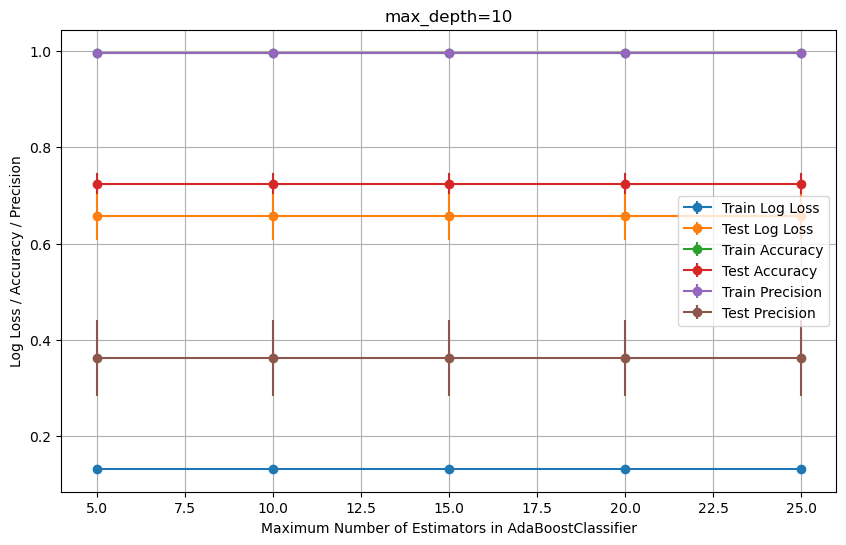

Avg Train Accuracy:
 [0.99700748 0.99700748 0.99700748 0.99700748 0.99700748]
Avg Test Accuracy:
 [0.72462687 0.72462687 0.72462687 0.72462687 0.72462687]
Avg Train Precision:
 [0.99693862 0.99693862 0.99693862 0.99693862 0.99693862]
Avg Test Precision:
 [0.36183477 0.36183477 0.36183477 0.36183477 0.36183477]
Avg Train Log Loss:
 [0.13145826 0.13145826 0.13145826 0.13145826 0.13145826]
Avg Test Log Loss:
 [0.65818837 0.65818837 0.65818837 0.65818837 0.65818837]


In [148]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'max_depth': 10,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=10'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### Varying `min_samples_split` of `RFClassifier()` over `[5, 10, 15]`
- Lower test precision than default.

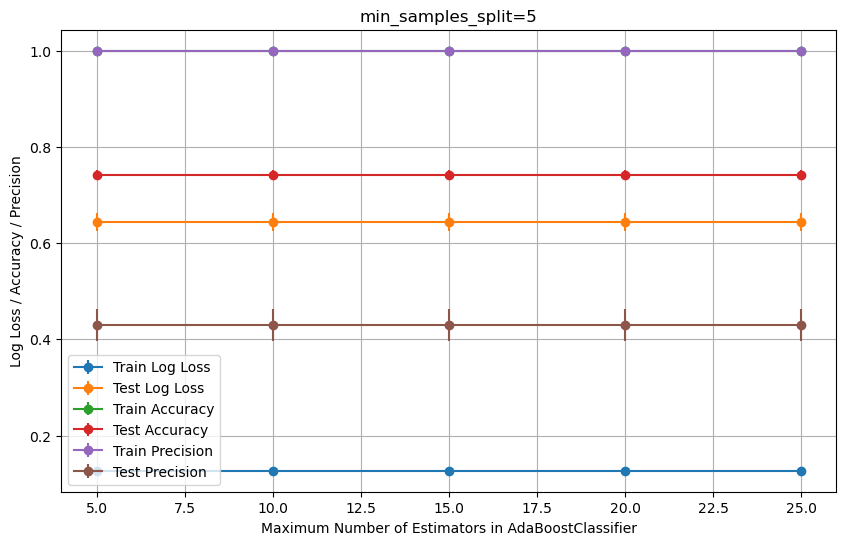

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.74179104 0.74179104 0.74179104 0.74179104 0.74179104]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.42960804 0.42960804 0.42960804 0.42960804 0.42960804]
Avg Train Log Loss:
 [0.12692801 0.12692801 0.12692801 0.12692801 0.12692801]
Avg Test Log Loss:
 [0.64334592 0.64334592 0.64334592 0.64334592 0.64334592]


In [149]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

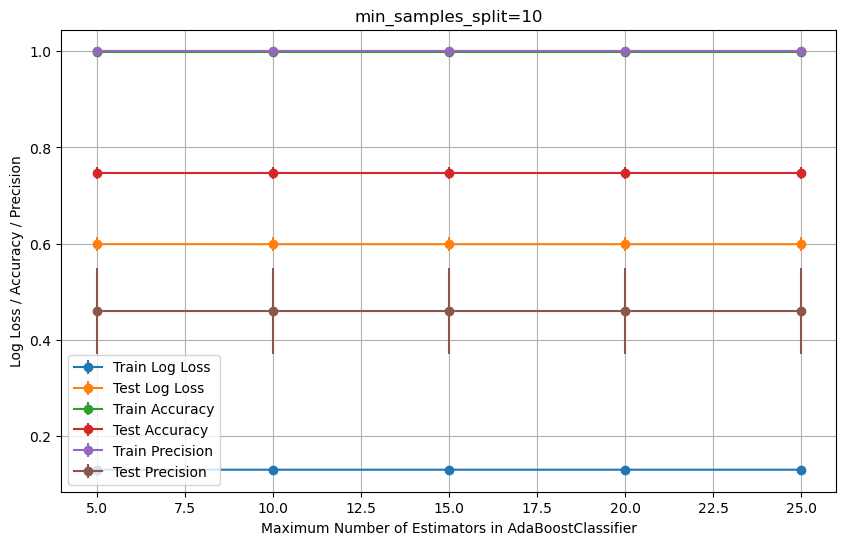

Avg Train Accuracy:
 [0.99850374 0.99850374 0.99850374 0.99850374 0.99850374]
Avg Test Accuracy:
 [0.74701493 0.74701493 0.74701493 0.74701493 0.74701493]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.46047009 0.46047009 0.46047009 0.46047009 0.46047009]
Avg Train Log Loss:
 [0.13065302 0.13063851 0.13063851 0.13063851 0.13063851]
Avg Test Log Loss:
 [0.59923259 0.59918875 0.59918875 0.59918875 0.59918875]


In [150]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 10,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=10'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

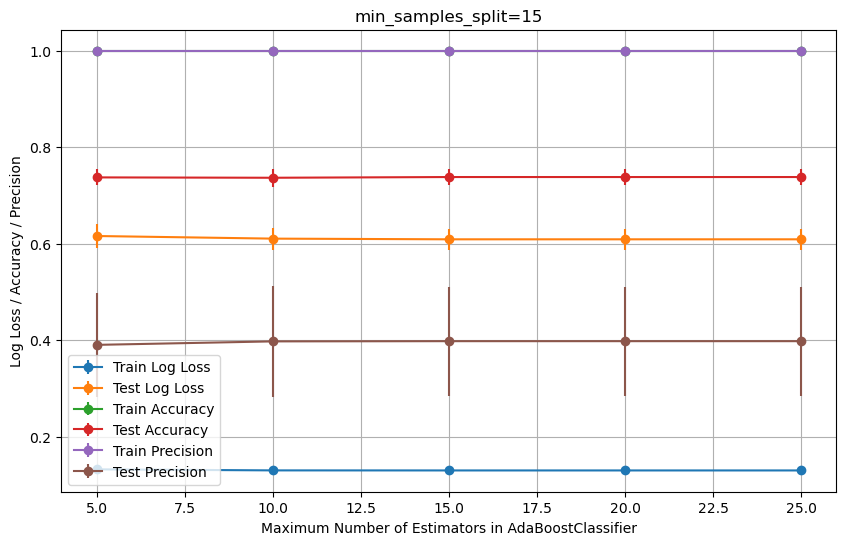

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.73731343 0.73656716 0.7380597  0.7380597  0.7380597 ]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.39003277 0.39725275 0.3977023  0.3977023  0.3977023 ]
Avg Train Log Loss:
 [0.13186706 0.12972604 0.12962001 0.12962001 0.12962001]
Avg Test Log Loss:
 [0.61576398 0.61033251 0.6089093  0.6089093  0.6089093 ]


In [151]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 15,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=15'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

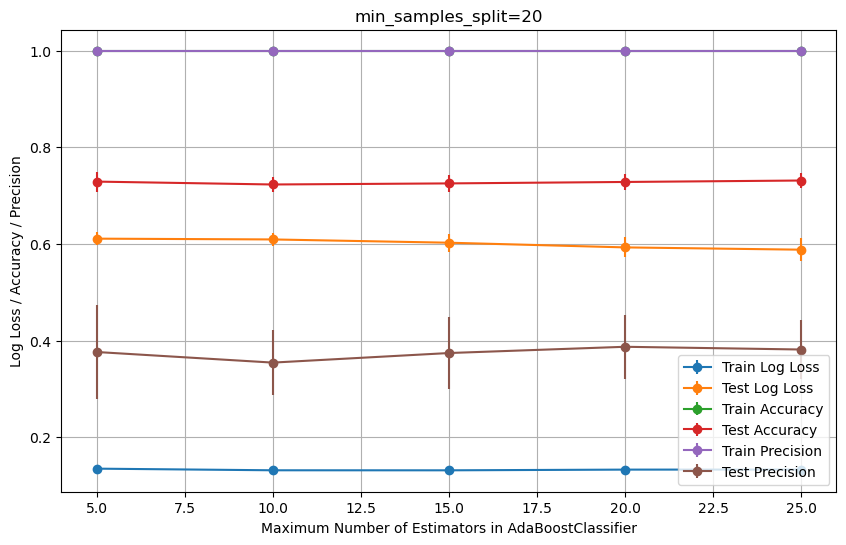

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.72910448 0.72313433 0.72537313 0.72835821 0.73134328]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.37640497 0.35446727 0.37427496 0.38721405 0.38156348]
Avg Train Log Loss:
 [0.13496645 0.13158252 0.13152043 0.13297036 0.13307027]
Avg Test Log Loss:
 [0.61100866 0.60939136 0.60262243 0.59292949 0.58818292]


In [152]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 20,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=20'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

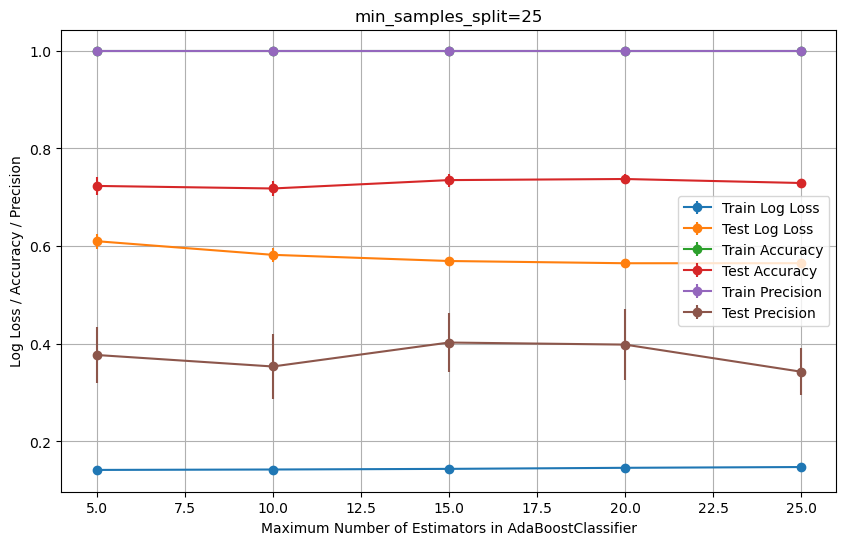

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.72313433 0.71791045 0.73507463 0.73731343 0.72910448]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.37695158 0.35340171 0.40245208 0.39820856 0.34267943]
Avg Train Log Loss:
 [0.1415811  0.14243384 0.14375152 0.14591528 0.14749916]
Avg Test Log Loss:
 [0.6099748  0.58204175 0.56940214 0.56482005 0.56489836]


In [153]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 25,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=25'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

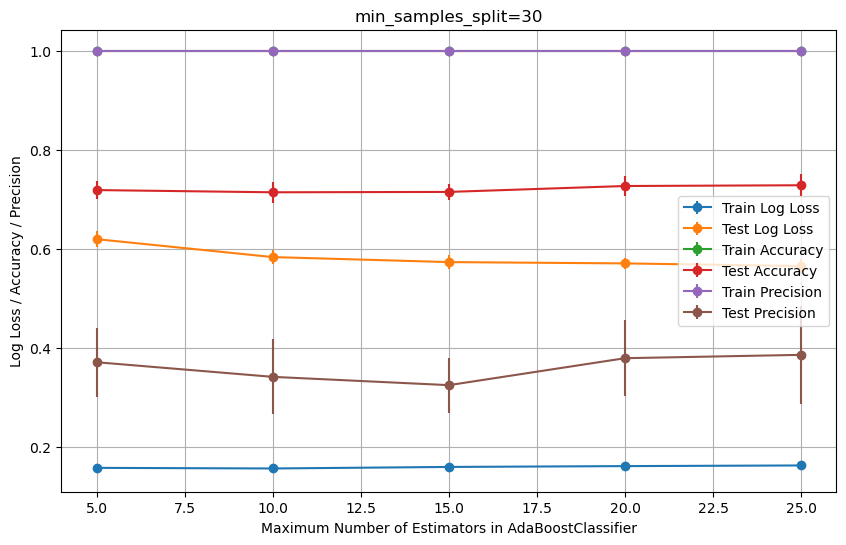

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.71865672 0.7141791  0.71492537 0.72686567 0.72835821]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.37107843 0.34153738 0.32479217 0.37922818 0.38596904]
Avg Train Log Loss:
 [0.15779818 0.15656316 0.1596607  0.16134351 0.16266088]
Avg Test Log Loss:
 [0.61954722 0.58336179 0.57324786 0.57060043 0.56527645]


In [154]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 30,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=30'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

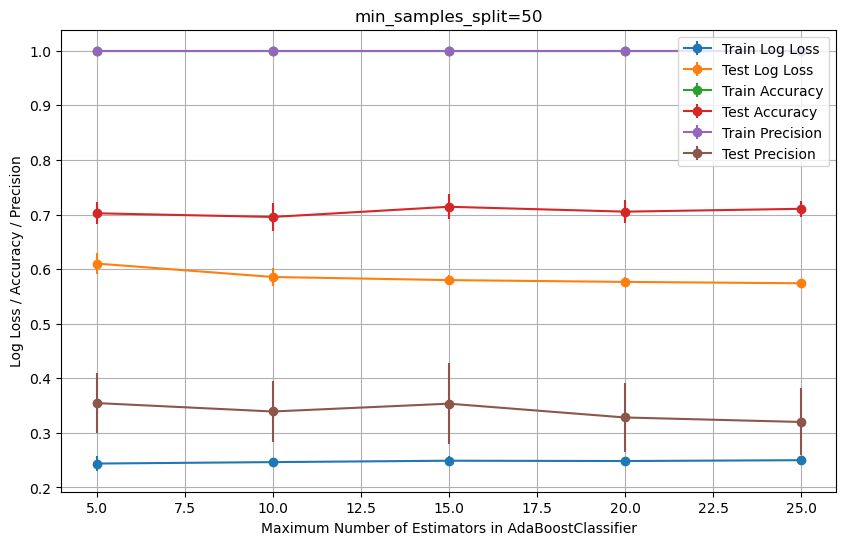

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.70223881 0.69552239 0.7141791  0.70522388 0.71044776]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.35464572 0.33918344 0.35352144 0.32823199 0.31998016]
Avg Train Log Loss:
 [0.2438356  0.24648104 0.2490336  0.24845952 0.24999213]
Avg Test Log Loss:
 [0.61014472 0.58555383 0.57984644 0.57655687 0.57405402]


In [155]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 50,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=50'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

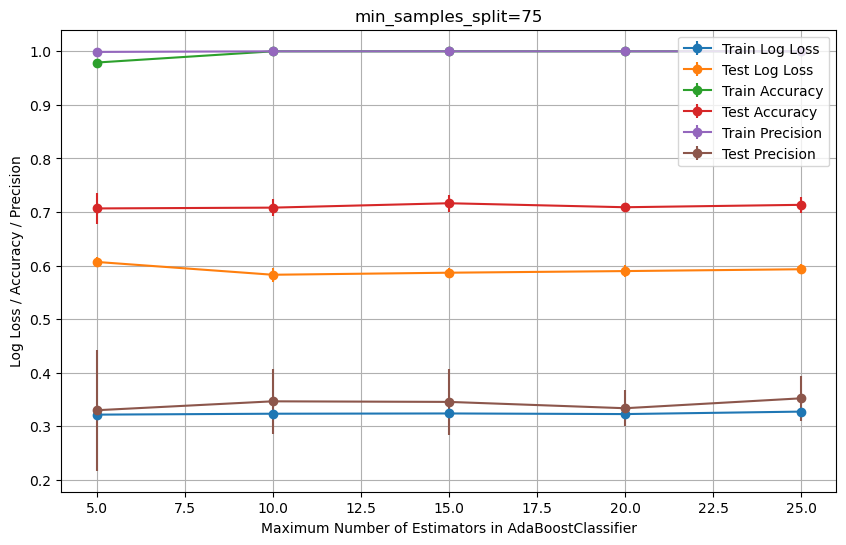

Avg Train Accuracy:
 [0.97905237 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.70671642 0.70820896 0.71641791 0.70895522 0.71343284]
Avg Train Precision:
 [0.9988764 1.        1.        1.        1.       ]
Avg Test Precision:
 [0.32999157 0.3466363  0.34556348 0.33374363 0.35225953]
Avg Train Log Loss:
 [0.3217876  0.32348727 0.323991   0.32283743 0.32743498]
Avg Test Log Loss:
 [0.60683733 0.58290868 0.586731   0.58977345 0.59318834]


In [156]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 75,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=75'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

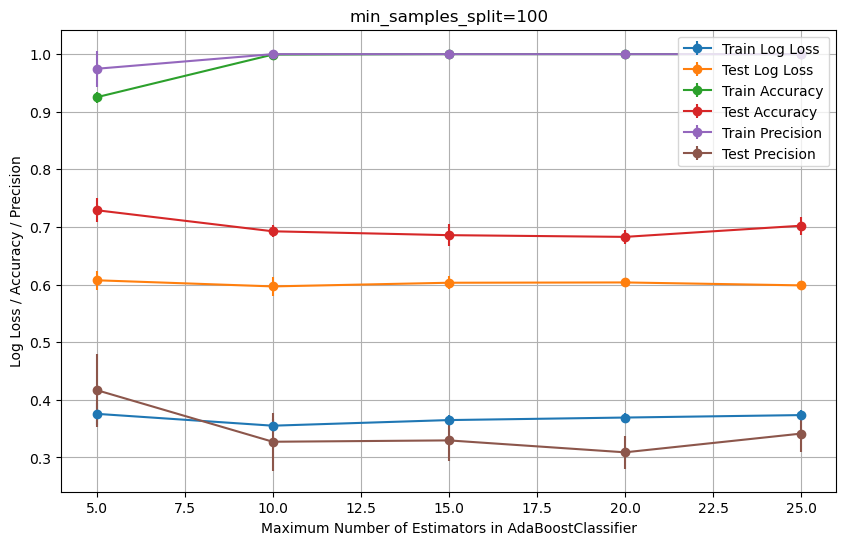

Avg Train Accuracy:
 [0.92518703 0.99925187 1.         1.         1.        ]
Avg Test Accuracy:
 [0.72910448 0.69253731 0.6858209  0.68283582 0.70223881]
Avg Train Precision:
 [0.97462223 1.         1.         1.         1.        ]
Avg Test Precision:
 [0.41690887 0.32726084 0.32960142 0.30890728 0.34141092]
Avg Train Log Loss:
 [0.37571564 0.35513543 0.36488037 0.36927237 0.37354212]
Avg Test Log Loss:
 [0.60751538 0.59687533 0.60323457 0.60376353 0.598672  ]


In [157]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_split': 100,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_split=100'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### Varying `min_samples_leaf` of `RFClassifier()` over `[5, 10, 15]`
- Lower test precision than default.

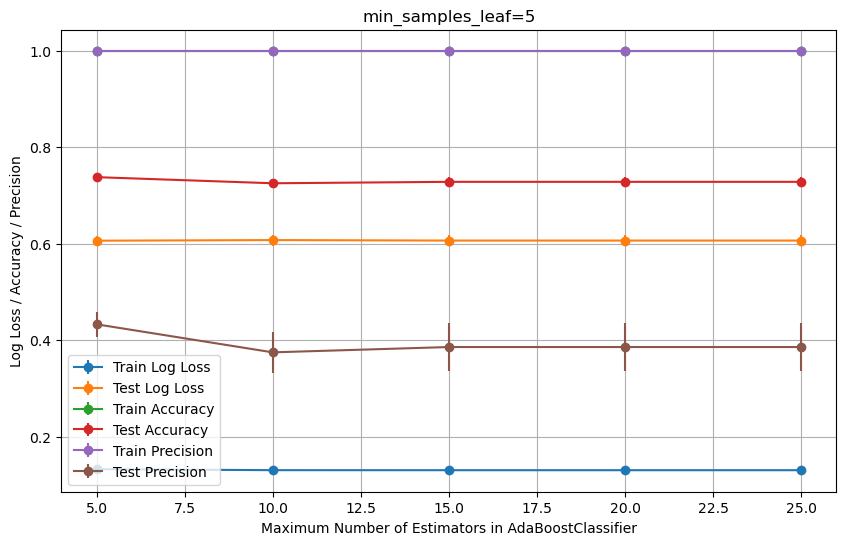

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.7380597  0.72537313 0.72835821 0.72835821 0.72835821]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.43315476 0.37505392 0.38608333 0.38608333 0.38608333]
Avg Train Log Loss:
 [0.13303009 0.13093705 0.1308862  0.1308862  0.1308862 ]
Avg Test Log Loss:
 [0.60639747 0.60768154 0.60667222 0.60667222 0.60667222]


In [158]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_leaf': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_leaf=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

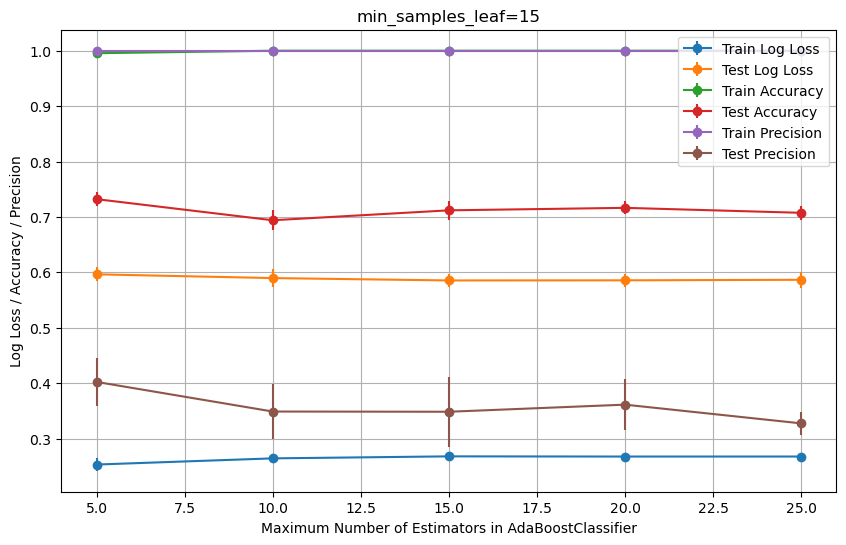

Avg Train Accuracy:
 [0.99551122 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.73208955 0.69402985 0.7119403  0.71641791 0.70746269]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.40223058 0.34879292 0.34840337 0.36123025 0.32742611]
Avg Train Log Loss:
 [0.25314184 0.2642741  0.26789688 0.26756311 0.26761002]
Avg Test Log Loss:
 [0.59642771 0.5896531  0.58537858 0.5855906  0.5865832 ]


In [159]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_leaf': 15,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_leaf=15'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

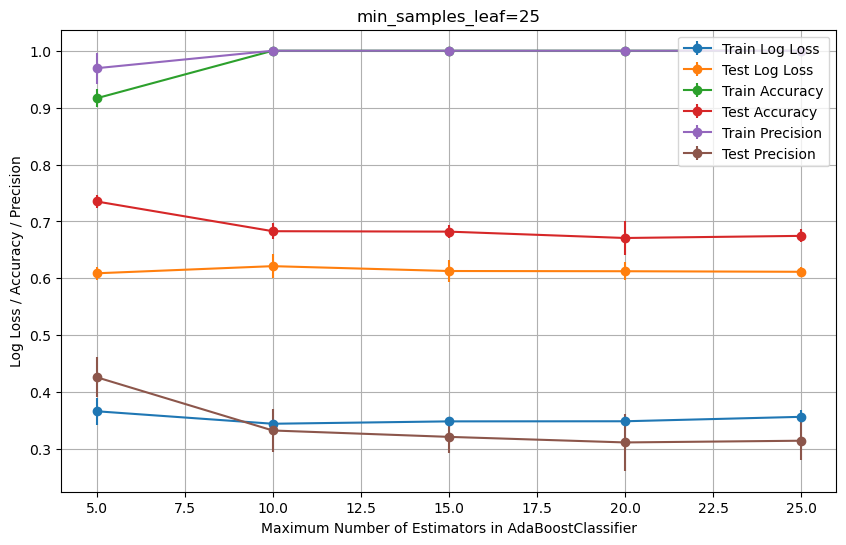

Avg Train Accuracy:
 [0.91645885 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.73507463 0.68283582 0.68208955 0.67089552 0.67462687]
Avg Train Precision:
 [0.96928251 1.         1.         1.         1.        ]
Avg Test Precision:
 [0.42622064 0.33260612 0.32140063 0.31162304 0.31462697]
Avg Train Log Loss:
 [0.36640041 0.34445419 0.34863628 0.34882792 0.35661958]
Avg Test Log Loss:
 [0.60888118 0.62140491 0.6128671  0.6124794  0.61151277]


In [160]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_leaf': 25,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_leaf=25'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

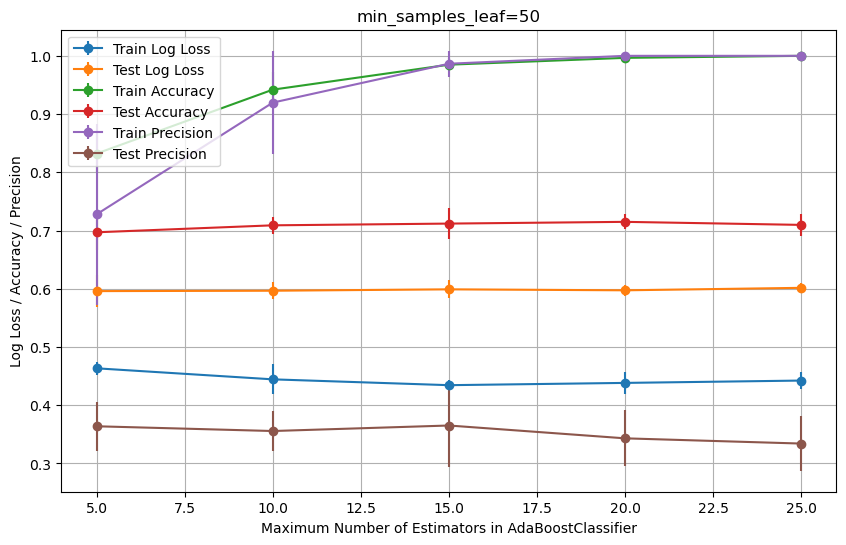

Avg Train Accuracy:
 [0.83216958 0.94189526 0.98478803 0.99650873 1.        ]
Avg Test Accuracy:
 [0.69701493 0.70895522 0.7119403  0.71492537 0.70970149]
Avg Train Precision:
 [0.72787056 0.91968095 0.98640914 1.         1.        ]
Avg Test Precision:
 [0.3639001  0.35575199 0.36522095 0.34319444 0.33421917]
Avg Train Log Loss:
 [0.46342355 0.44448588 0.43447045 0.43837603 0.44238652]
Avg Test Log Loss:
 [0.59598921 0.59664872 0.59904649 0.59736162 0.60162141]


In [161]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_leaf': 50,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_leaf=50'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

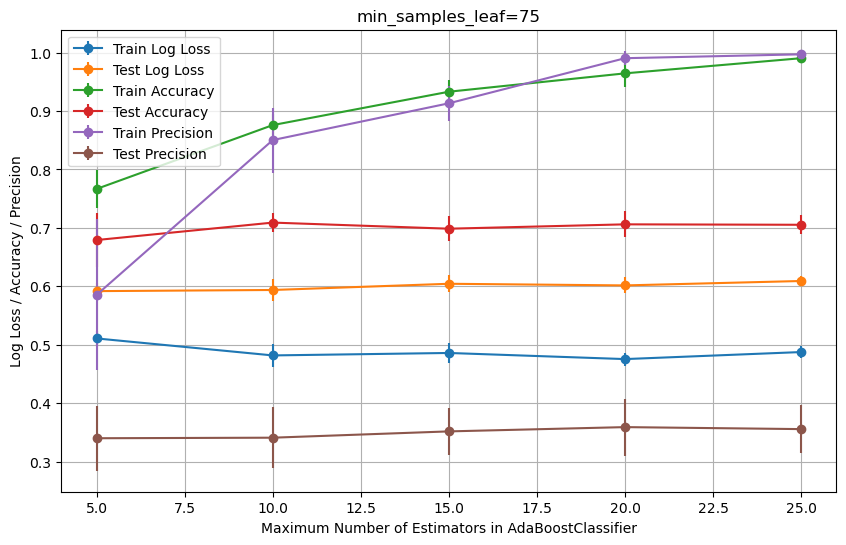

Avg Train Accuracy:
 [0.76658354 0.87581047 0.93291771 0.96433915 0.99027431]
Avg Test Accuracy:
 [0.67910448 0.70895522 0.69850746 0.70597015 0.70522388]
Avg Train Precision:
 [0.58534609 0.85016501 0.91311625 0.99028095 0.99692308]
Avg Test Precision:
 [0.33993757 0.34087255 0.35165963 0.35897096 0.35556523]
Avg Train Log Loss:
 [0.51071819 0.4816576  0.48585812 0.47538585 0.4874325 ]
Avg Test Log Loss:
 [0.5916986  0.59363595 0.60426153 0.60146402 0.60901937]


In [162]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_leaf': 75,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_leaf=75'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

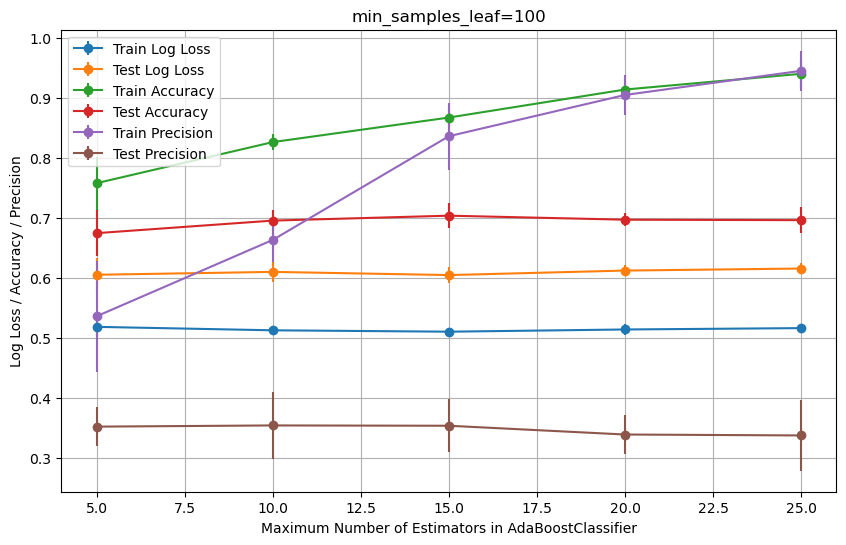

Avg Train Accuracy:
 [0.75785536 0.82618454 0.86708229 0.91371571 0.93990025]
Avg Test Accuracy:
 [0.67462687 0.69552239 0.70373134 0.69701493 0.69626866]
Avg Train Precision:
 [0.53627989 0.66337929 0.83602614 0.90466139 0.94487643]
Avg Test Precision:
 [0.35255846 0.35455819 0.35403113 0.33942867 0.33788834]
Avg Train Log Loss:
 [0.51865401 0.51291161 0.51060117 0.51428171 0.51654977]
Avg Test Log Loss:
 [0.60536129 0.61014845 0.60484722 0.61235835 0.61573621]


In [163]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'min_samples_leaf': 100,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'min_samples_leaf=100'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### Varying `n_estimators` of `RandomForestClassifier()`

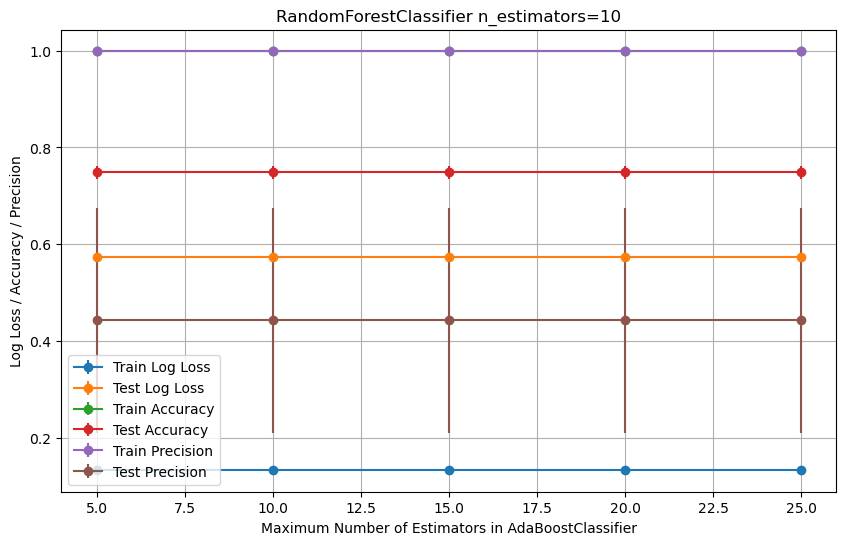

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.74850746 0.74850746 0.74850746 0.74850746 0.74850746]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.44222222 0.44222222 0.44222222 0.44222222 0.44222222]
Avg Train Log Loss:
 [0.1321812 0.1321812 0.1321812 0.1321812 0.1321812]
Avg Test Log Loss:
 [0.57411319 0.57411319 0.57411319 0.57411319 0.57411319]


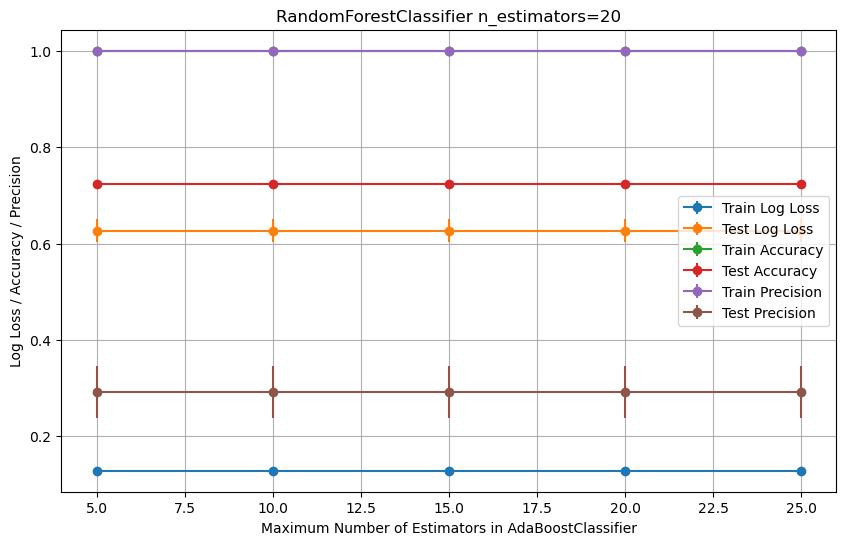

Avg Train Accuracy:
 [0.99900249 0.99900249 0.99900249 0.99900249 0.99900249]
Avg Test Accuracy:
 [0.72313433 0.72313433 0.72313433 0.72313433 0.72313433]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.29185155 0.29185155 0.29185155 0.29185155 0.29185155]
Avg Train Log Loss:
 [0.12873842 0.12873842 0.12873842 0.12873842 0.12873842]
Avg Test Log Loss:
 [0.62678238 0.62678238 0.62678238 0.62678238 0.62678238]


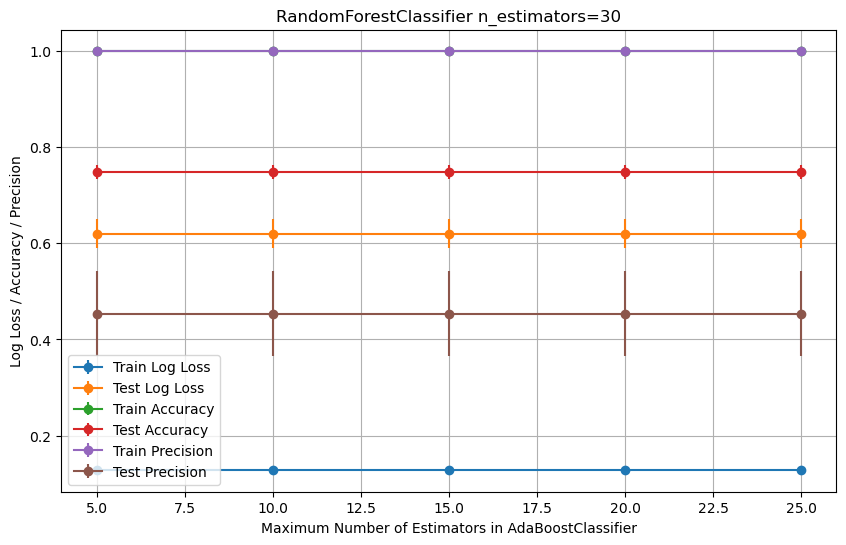

Avg Train Accuracy:
 [0.99900249 0.99900249 0.99900249 0.99900249 0.99900249]
Avg Test Accuracy:
 [0.74701493 0.74701493 0.74701493 0.74701493 0.74701493]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.45348335 0.45348335 0.45348335 0.45348335 0.45348335]
Avg Train Log Loss:
 [0.12843201 0.12843201 0.12843201 0.12843201 0.12843201]
Avg Test Log Loss:
 [0.61999536 0.61999536 0.61999536 0.61999536 0.61999536]


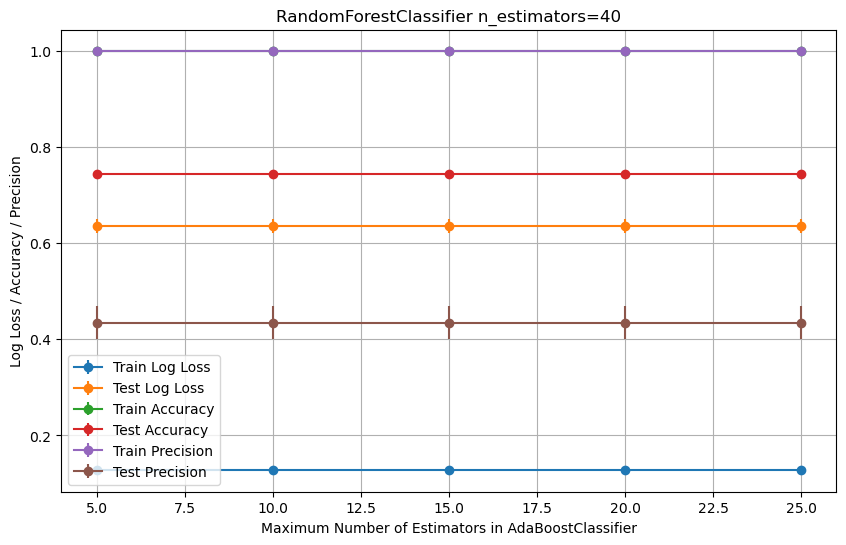

Avg Train Accuracy:
 [0.99975062 0.99975062 0.99975062 0.99975062 0.99975062]
Avg Test Accuracy:
 [0.74402985 0.74402985 0.74402985 0.74402985 0.74402985]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.4346906 0.4346906 0.4346906 0.4346906 0.4346906]
Avg Train Log Loss:
 [0.12732188 0.12732188 0.12732188 0.12732188 0.12732188]
Avg Test Log Loss:
 [0.63556947 0.63556947 0.63556947 0.63556947 0.63556947]


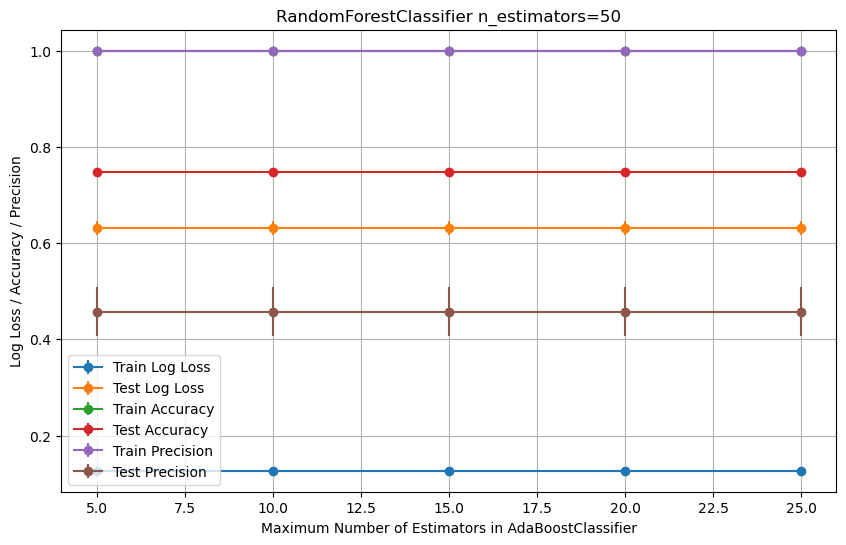

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.74776119 0.74776119 0.74776119 0.74776119 0.74776119]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.45780186 0.45780186 0.45780186 0.45780186 0.45780186]
Avg Train Log Loss:
 [0.12692801 0.12692801 0.12692801 0.12692801 0.12692801]
Avg Test Log Loss:
 [0.63140562 0.63140562 0.63140562 0.63140562 0.63140562]


In [134]:
for i in range(10, 60, 10):
    n_estimators_range = list(range(5, 30, 5))

    classifier_params = (
        'classifier', AdaBoostClassifier(
            algorithm='SAMME',
            n_estimators=n_estimators,
            estimator=RandomForestClassifier(
                n_estimators=i,
                ),
            random_state=0)
        )
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'RandomForestClassifier n_estimators={i}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

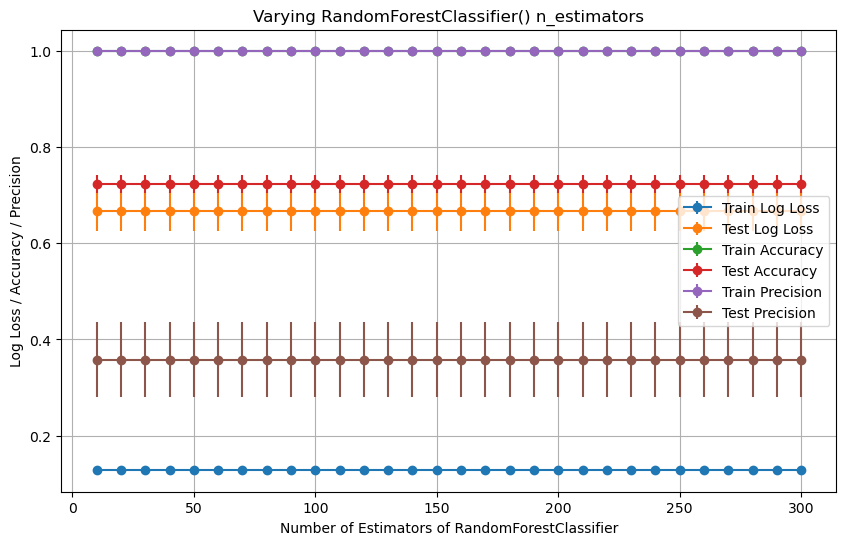

Avg Train Accuracy:
 [0.99900249 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249
 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249
 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249
 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249
 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249 0.99900249]
Avg Test Accuracy:
 [0.72238806 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806
 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806
 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806
 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806
 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806 0.72238806]
Avg Train Precision:
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.35818932 0.35818932 0.35818932 0.35818932 0.35818932 0.35818932
 0.35818932 0.35818932 0.35818932 0.35818932 0.35818932 0.35818932
 0.35818932 0.358

In [136]:
n_estimators_range = list(range(10, 310, 10))

classifier_params = (
    'classifier', AdaBoostClassifier(
        algorithm='SAMME',
        n_estimators=10,
        estimator=RandomForestClassifier(
            n_estimators=n_estimators,
            ),
        random_state=0)
    )
xlabel = 'Number of Estimators of RandomForestClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = f'Varying RandomForestClassifier() n_estimators'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

## `oob_score=precision`
- Lower test precision than default.

### Varying `max_depth` of `RFClassifier()` from 1-5

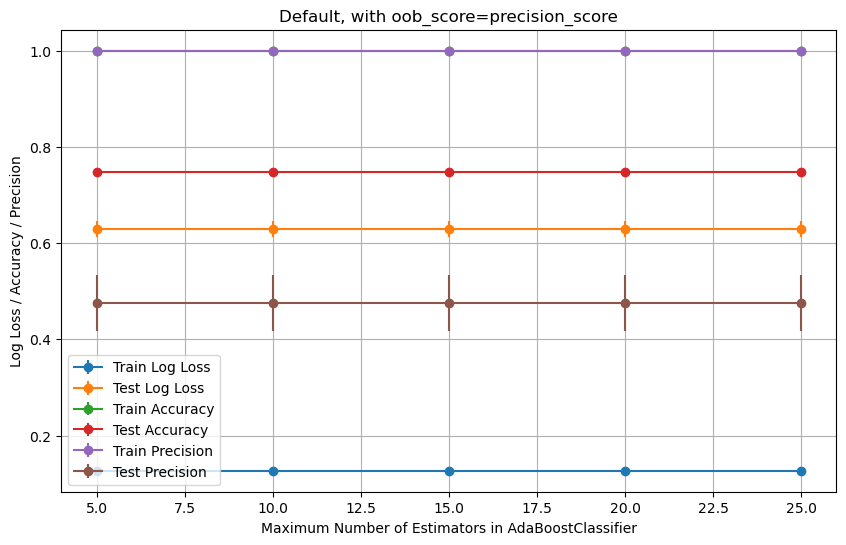

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.74850746 0.74850746 0.74850746 0.74850746 0.74850746]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.47587992 0.47587992 0.47587992 0.47587992 0.47587992]
Avg Train Log Loss:
 [0.12692801 0.12692801 0.12692801 0.12692801 0.12692801]
Avg Test Log Loss:
 [0.62991309 0.62991309 0.62991309 0.62991309 0.62991309]


In [164]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'oob_score': precision_score,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'Default, with oob_score=precision_score'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


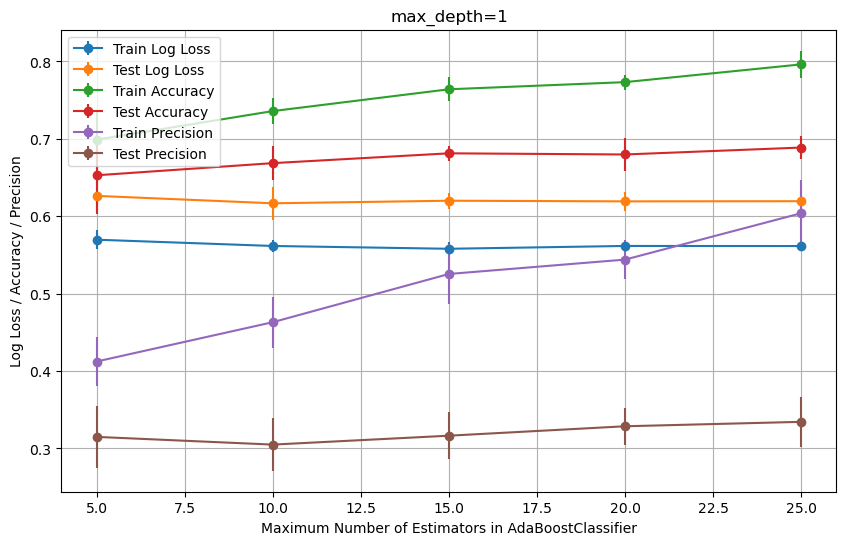

Avg Train Accuracy:
 [0.69900249 0.73591022 0.76408978 0.77331671 0.79625935]
Avg Test Accuracy:
 [0.65298507 0.66865672 0.68134328 0.67985075 0.68880597]
Avg Train Precision:
 [0.41237758 0.46315887 0.52546643 0.54404417 0.60394302]
Avg Test Precision:
 [0.31497816 0.30501647 0.3165228  0.32869516 0.33442844]
Avg Train Log Loss:
 [0.56974876 0.56164199 0.55801671 0.56166584 0.56153642]
Avg Test Log Loss:
 [0.62635666 0.61677996 0.62010858 0.61927012 0.61949243]


In [165]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'oob_score': precision_score,
    'max_depth': 1,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=1'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

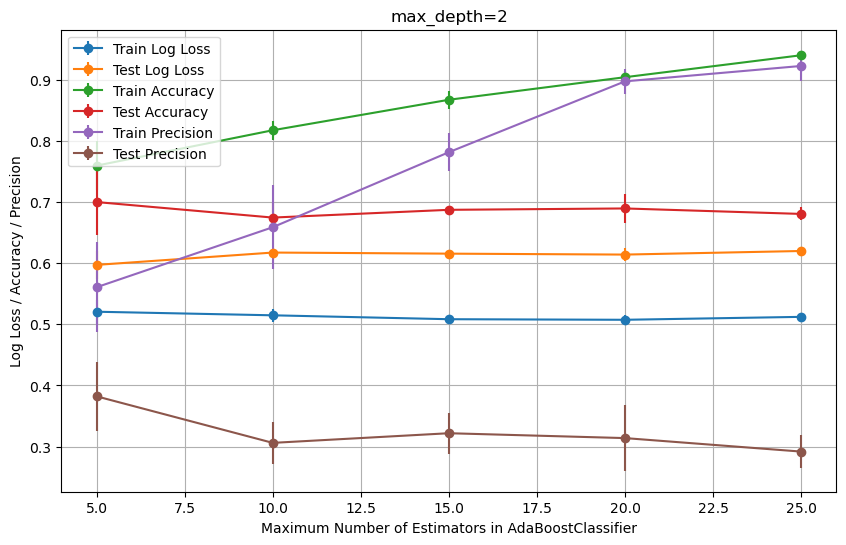

Avg Train Accuracy:
 [0.759601   0.81745636 0.86733167 0.9042394  0.94014963]
Avg Test Accuracy:
 [0.7        0.67462687 0.68731343 0.68955224 0.68059701]
Avg Train Precision:
 [0.56072114 0.65884989 0.781568   0.89745883 0.92261979]
Avg Test Precision:
 [0.38223038 0.30613039 0.32190525 0.31393902 0.29186755]
Avg Train Log Loss:
 [0.52062669 0.51477438 0.5083902  0.50744985 0.51224211]
Avg Test Log Loss:
 [0.59725185 0.61741612 0.61562551 0.61409971 0.61996845]


In [166]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'oob_score': precision_score,
    'max_depth': 2,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=2'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

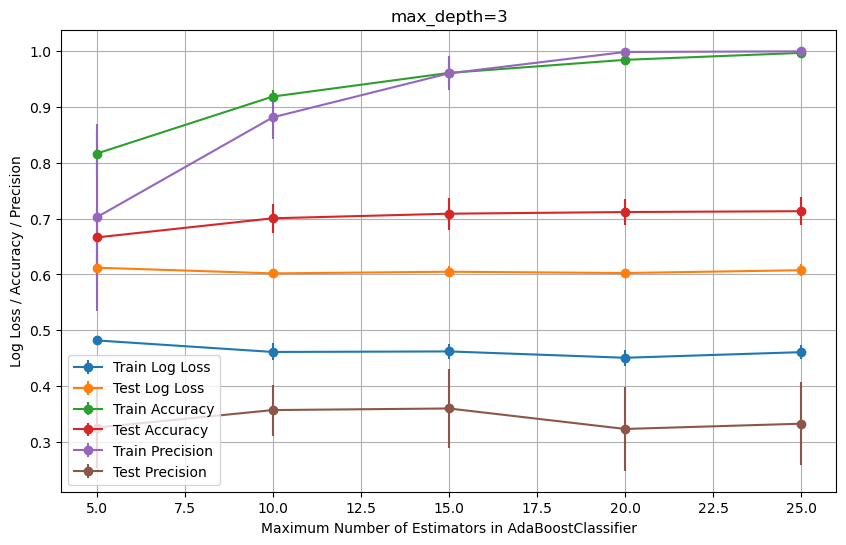

Avg Train Accuracy:
 [0.81670823 0.91895262 0.96134663 0.98478803 0.99725686]
Avg Test Accuracy:
 [0.66641791 0.70074627 0.70895522 0.7119403  0.71343284]
Avg Train Precision:
 [0.70248591 0.88170981 0.9605516  0.9988764  1.        ]
Avg Test Precision:
 [0.32546965 0.35694865 0.35981011 0.32310076 0.33250542]
Avg Train Log Loss:
 [0.4818076  0.46111456 0.46207739 0.45071266 0.46077464]
Avg Test Log Loss:
 [0.61217219 0.60195454 0.60491747 0.60262112 0.60762931]


In [167]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'oob_score': precision_score,
    'max_depth': 3,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=3'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

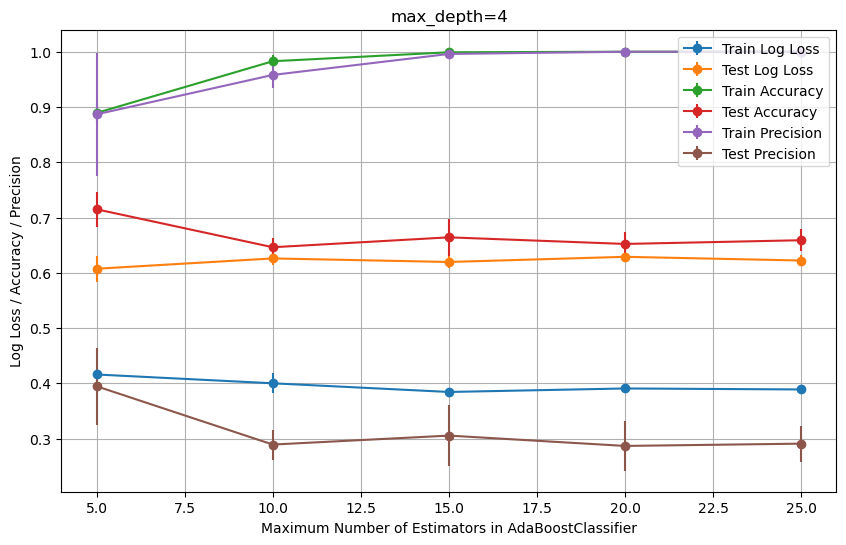

Avg Train Accuracy:
 [0.88927681 0.98279302 0.99900249 1.         1.        ]
Avg Test Accuracy:
 [0.71492537 0.64626866 0.6641791  0.65223881 0.65895522]
Avg Train Precision:
 [0.886739   0.95800299 0.9959899  1.         1.        ]
Avg Test Precision:
 [0.39471781 0.28924737 0.30547181 0.28678702 0.29089835]
Avg Train Log Loss:
 [0.41601759 0.40011098 0.38441979 0.39074938 0.38895822]
Avg Test Log Loss:
 [0.60738473 0.6260346  0.61960492 0.62894218 0.6222461 ]


In [168]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'oob_score': precision_score,
    'max_depth': 4,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=4'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

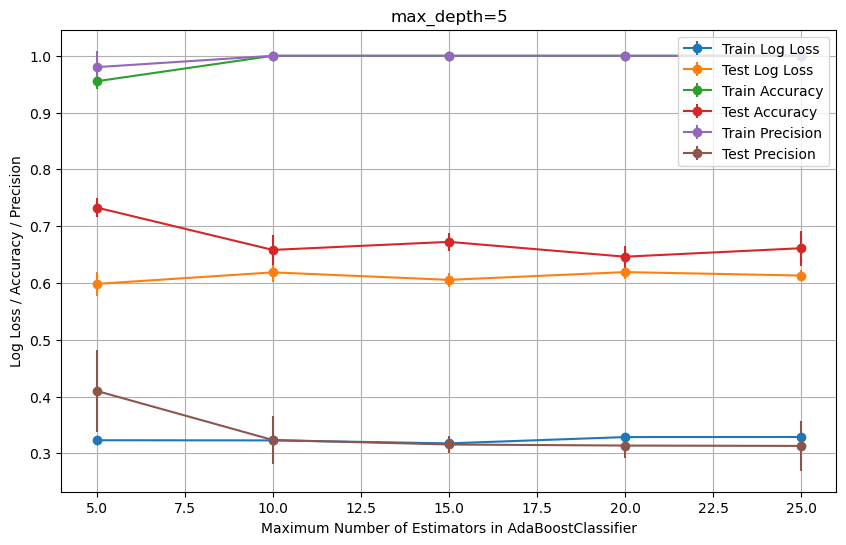

Avg Train Accuracy:
 [0.95511222 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.73283582 0.65820896 0.67238806 0.64626866 0.66119403]
Avg Train Precision:
 [0.97998157 1.         1.         1.         1.        ]
Avg Test Precision:
 [0.40997316 0.3235407  0.31561708 0.3137393  0.31311434]
Avg Train Log Loss:
 [0.3231097  0.32282839 0.31759576 0.3286796  0.32883862]
Avg Test Log Loss:
 [0.59837999 0.61864939 0.60549305 0.6191417  0.61305861]


In [169]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'oob_score': precision_score,
    'max_depth': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

## `criterion='entropy'`
- Lower test precision than default.

### Varying `max_depth` of `RFClassifier()` from 1-5

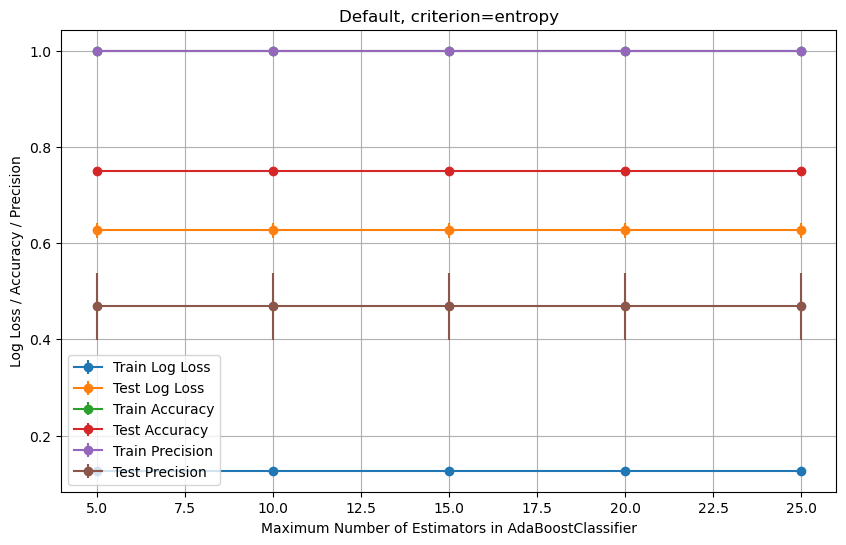

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.75 0.75 0.75 0.75 0.75]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.46882489 0.46882489 0.46882489 0.46882489 0.46882489]
Avg Train Log Loss:
 [0.12692801 0.12692801 0.12692801 0.12692801 0.12692801]
Avg Test Log Loss:
 [0.62692801 0.62692801 0.62692801 0.62692801 0.62692801]


In [170]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'entropy',
    # 'max_depth': 1,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'Default, criterion=entropy'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

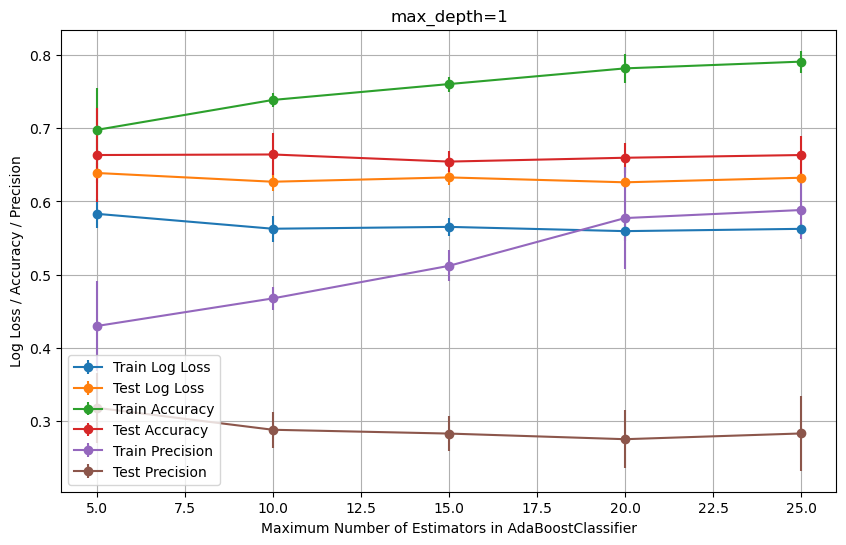

Avg Train Accuracy:
 [0.69775561 0.73865337 0.76034913 0.78179551 0.79102244]
Avg Test Accuracy:
 [0.66343284 0.6641791  0.65447761 0.65970149 0.66343284]
Avg Train Precision:
 [0.42982404 0.4675615  0.51203387 0.577322   0.58830349]
Avg Test Precision:
 [0.31812828 0.2881362  0.2829322  0.27525116 0.28308144]
Avg Train Log Loss:
 [0.58312183 0.5627475  0.56528088 0.55946381 0.56259508]
Avg Test Log Loss:
 [0.63890471 0.62695494 0.63284536 0.62616866 0.63239928]


In [171]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'entropy',
    'max_depth': 1,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=1'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

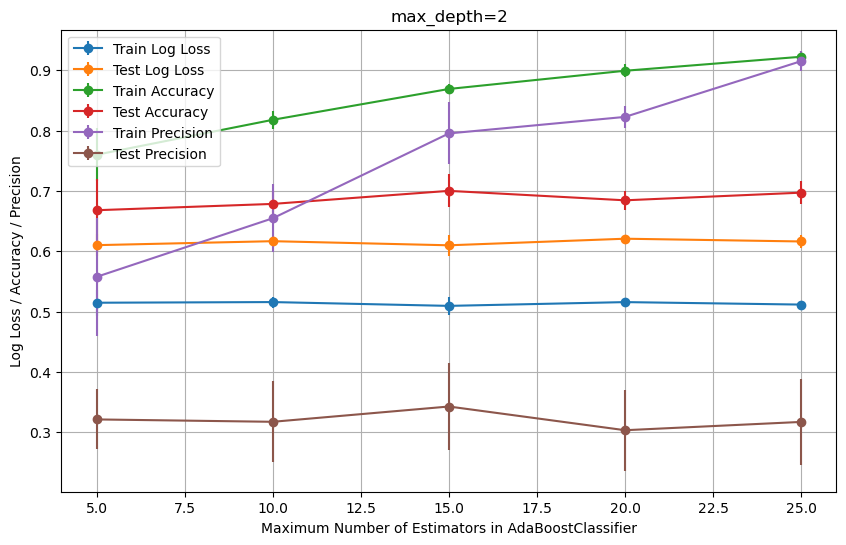

Avg Train Accuracy:
 [0.75985037 0.81770574 0.86882793 0.89900249 0.92219451]
Avg Test Accuracy:
 [0.66791045 0.67835821 0.7        0.68432836 0.69701493]
Avg Train Precision:
 [0.55753399 0.65456066 0.79515552 0.82253084 0.91493531]
Avg Test Precision:
 [0.32126741 0.31733633 0.3426687  0.30338552 0.31714019]
Avg Train Log Loss:
 [0.51462788 0.51571679 0.50941148 0.5156644  0.5115628 ]
Avg Test Log Loss:
 [0.61002915 0.61660767 0.6097928  0.62069416 0.61613785]


In [172]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'entropy',
    'max_depth': 2,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=2'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

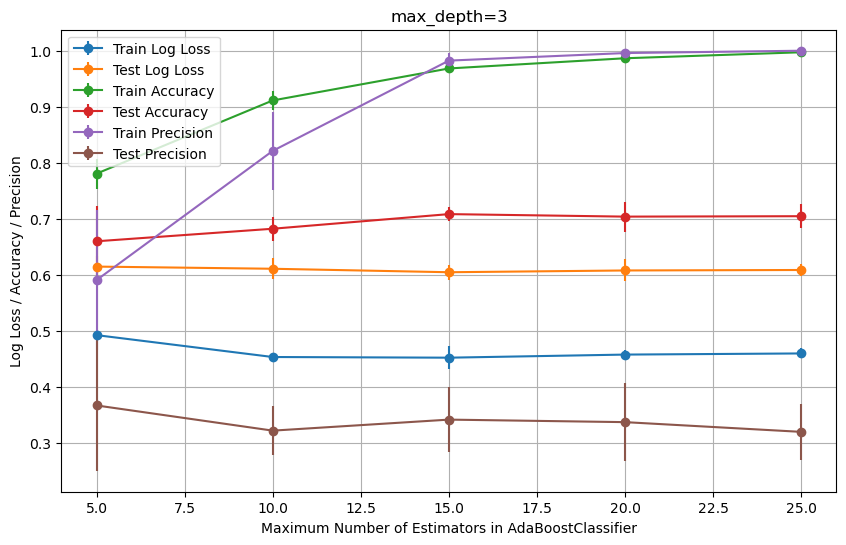

Avg Train Accuracy:
 [0.78054863 0.91122195 0.96832918 0.98653367 0.99725686]
Avg Test Accuracy:
 [0.65970149 0.68208955 0.70820896 0.70373134 0.70447761]
Avg Train Precision:
 [0.59049273 0.82118722 0.98234469 0.99584723 1.        ]
Avg Test Precision:
 [0.36647967 0.32152151 0.34120261 0.33669877 0.31934274]
Avg Train Log Loss:
 [0.49206484 0.45299796 0.45181537 0.45734581 0.45938274]
Avg Test Log Loss:
 [0.61448358 0.61061329 0.60440531 0.60756153 0.60840898]


In [173]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'entropy',
    'max_depth': 3,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=3'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

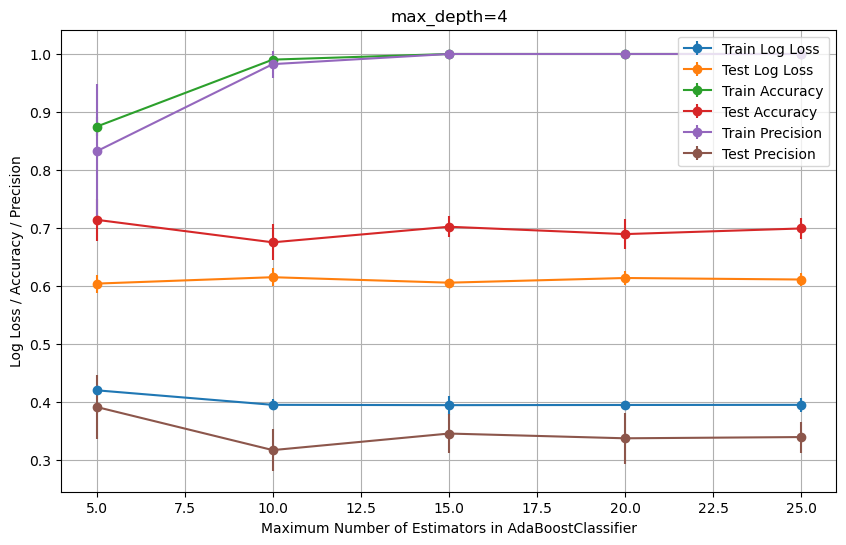

Avg Train Accuracy:
 [0.87481297 0.99027431 1.         1.         1.        ]
Avg Test Accuracy:
 [0.7141791  0.67537313 0.70223881 0.68955224 0.69925373]
Avg Train Precision:
 [0.83225955 0.98250392 1.         1.         1.        ]
Avg Test Precision:
 [0.3915692  0.31725149 0.34578957 0.33761246 0.33973785]
Avg Train Log Loss:
 [0.42032382 0.39527924 0.39474503 0.3950366  0.3952443 ]
Avg Test Log Loss:
 [0.60424433 0.61525405 0.60581973 0.61388401 0.61127311]


In [174]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'entropy',
    'max_depth': 4,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=4'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

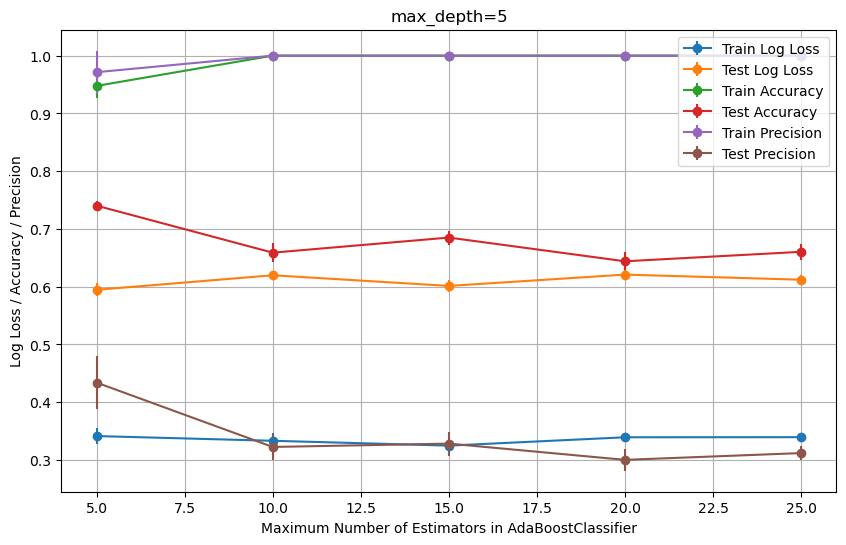

Avg Train Accuracy:
 [0.94763092 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.74029851 0.65895522 0.68507463 0.64402985 0.66044776]
Avg Train Precision:
 [0.97136067 1.         1.         1.         1.        ]
Avg Test Precision:
 [0.43402577 0.3226649  0.32843076 0.30033274 0.31206713]
Avg Train Log Loss:
 [0.34149783 0.3333465  0.32494459 0.33940085 0.33957403]
Avg Test Log Loss:
 [0.59466861 0.61983407 0.60140844 0.62098358 0.61214407]


In [175]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'entropy',
    'max_depth': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

## `criterion='log_loss'`
- Lower test precision than default.

### Varying `max_depth` of `RFClassifier()` from 1-5

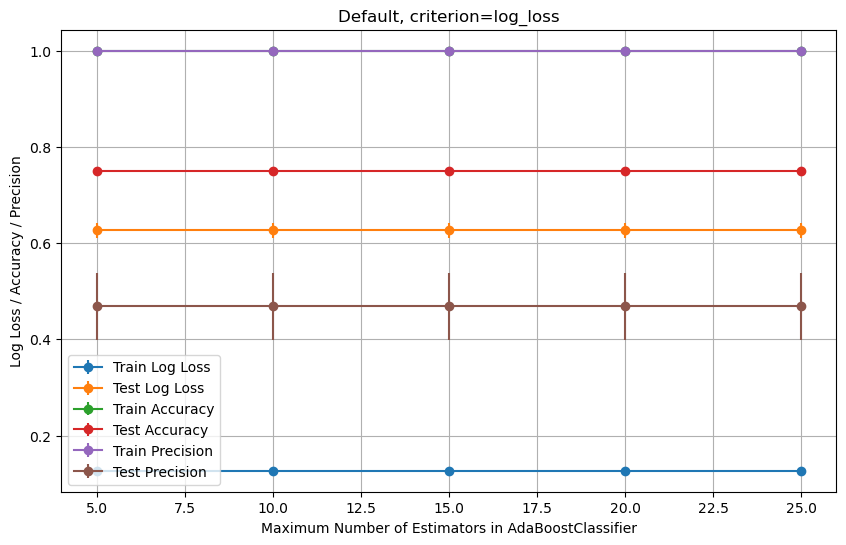

Avg Train Accuracy:
 [1. 1. 1. 1. 1.]
Avg Test Accuracy:
 [0.75 0.75 0.75 0.75 0.75]
Avg Train Precision:
 [1. 1. 1. 1. 1.]
Avg Test Precision:
 [0.46882489 0.46882489 0.46882489 0.46882489 0.46882489]
Avg Train Log Loss:
 [0.12692801 0.12692801 0.12692801 0.12692801 0.12692801]
Avg Test Log Loss:
 [0.62692801 0.62692801 0.62692801 0.62692801 0.62692801]


In [176]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'log_loss',
    # 'max_depth': 1,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'Default, criterion=log_loss'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

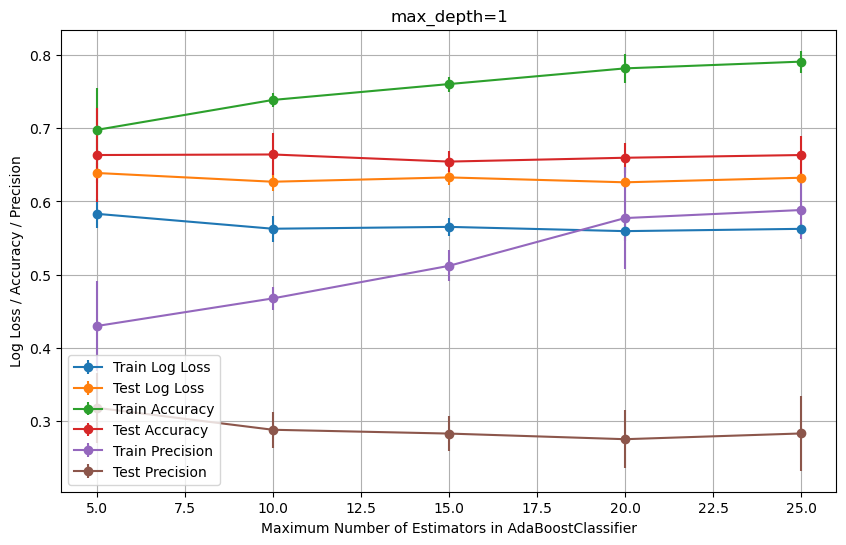

Avg Train Accuracy:
 [0.69775561 0.73865337 0.76034913 0.78179551 0.79102244]
Avg Test Accuracy:
 [0.66343284 0.6641791  0.65447761 0.65970149 0.66343284]
Avg Train Precision:
 [0.42982404 0.4675615  0.51203387 0.577322   0.58830349]
Avg Test Precision:
 [0.31812828 0.2881362  0.2829322  0.27525116 0.28308144]
Avg Train Log Loss:
 [0.58312183 0.5627475  0.56528088 0.55946381 0.56259508]
Avg Test Log Loss:
 [0.63890471 0.62695494 0.63284536 0.62616866 0.63239928]


In [177]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 1,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=1'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

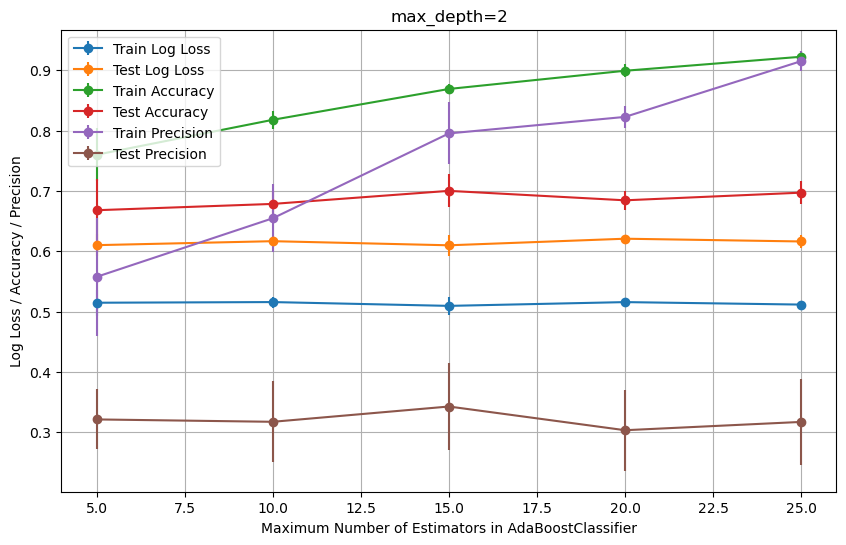

Avg Train Accuracy:
 [0.75985037 0.81770574 0.86882793 0.89900249 0.92219451]
Avg Test Accuracy:
 [0.66791045 0.67835821 0.7        0.68432836 0.69701493]
Avg Train Precision:
 [0.55753399 0.65456066 0.79515552 0.82253084 0.91493531]
Avg Test Precision:
 [0.32126741 0.31733633 0.3426687  0.30338552 0.31714019]
Avg Train Log Loss:
 [0.51462788 0.51571679 0.50941148 0.5156644  0.5115628 ]
Avg Test Log Loss:
 [0.61002915 0.61660767 0.6097928  0.62069416 0.61613785]


In [178]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 2,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=2'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

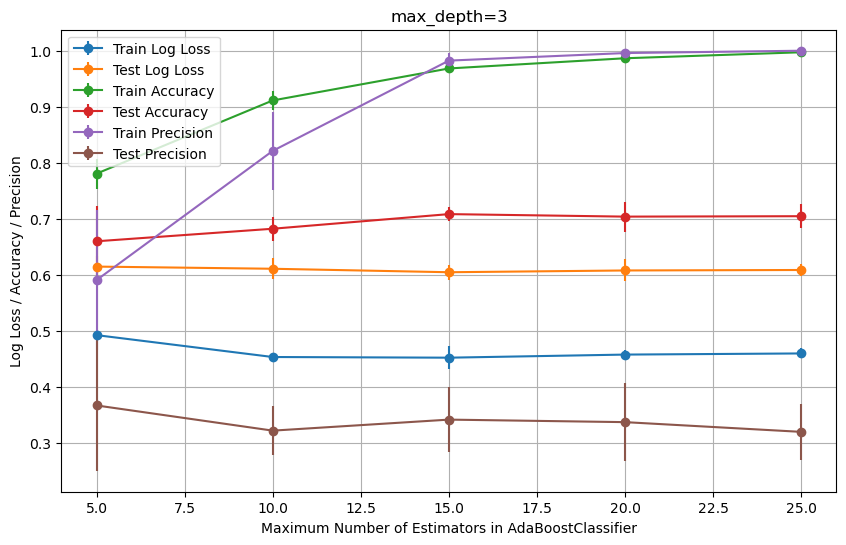

Avg Train Accuracy:
 [0.78054863 0.91122195 0.96832918 0.98653367 0.99725686]
Avg Test Accuracy:
 [0.65970149 0.68208955 0.70820896 0.70373134 0.70447761]
Avg Train Precision:
 [0.59049273 0.82118722 0.98234469 0.99584723 1.        ]
Avg Test Precision:
 [0.36647967 0.32152151 0.34120261 0.33669877 0.31934274]
Avg Train Log Loss:
 [0.49206484 0.45299796 0.45181537 0.45734581 0.45938274]
Avg Test Log Loss:
 [0.61448358 0.61061329 0.60440531 0.60756153 0.60840898]


In [179]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 3,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=3'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

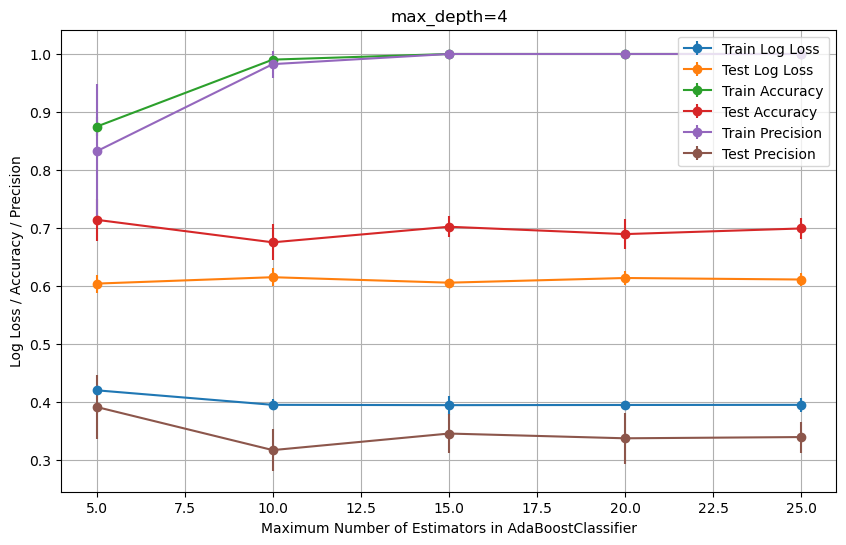

Avg Train Accuracy:
 [0.87481297 0.99027431 1.         1.         1.        ]
Avg Test Accuracy:
 [0.7141791  0.67537313 0.70223881 0.68955224 0.69925373]
Avg Train Precision:
 [0.83225955 0.98250392 1.         1.         1.        ]
Avg Test Precision:
 [0.3915692  0.31725149 0.34578957 0.33761246 0.33973785]
Avg Train Log Loss:
 [0.42032382 0.39527924 0.39474503 0.3950366  0.3952443 ]
Avg Test Log Loss:
 [0.60424433 0.61525405 0.60581973 0.61388401 0.61127311]


In [180]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 4,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=4'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

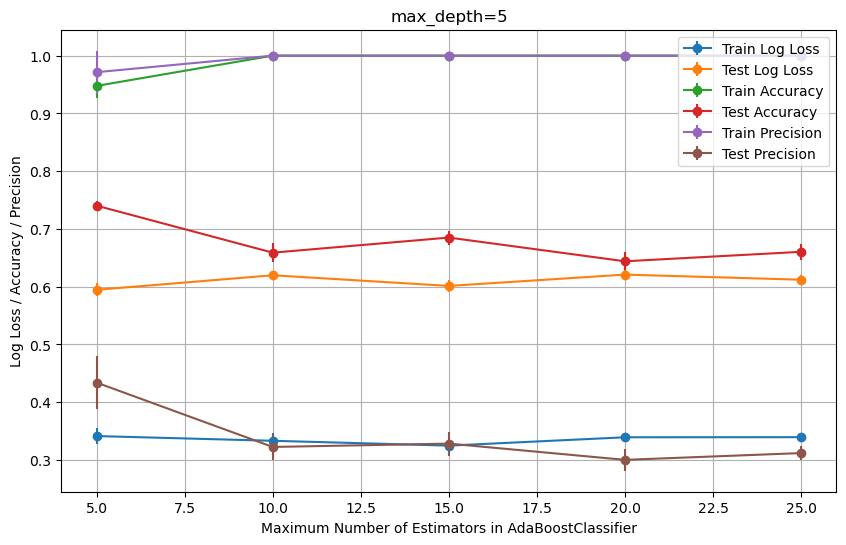

Avg Train Accuracy:
 [0.94763092 1.         1.         1.         1.        ]
Avg Test Accuracy:
 [0.74029851 0.65895522 0.68507463 0.64402985 0.66044776]
Avg Train Precision:
 [0.97136067 1.         1.         1.         1.        ]
Avg Test Precision:
 [0.43402577 0.3226649  0.32843076 0.30033274 0.31206713]
Avg Train Log Loss:
 [0.34149783 0.3333465  0.32494459 0.33940085 0.33957403]
Avg Test Log Loss:
 [0.59466861 0.61983407 0.60140844 0.62098358 0.61214407]


In [181]:
n_estimators_range = list(range(5, 30, 5))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

## Mixture of variations

### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`

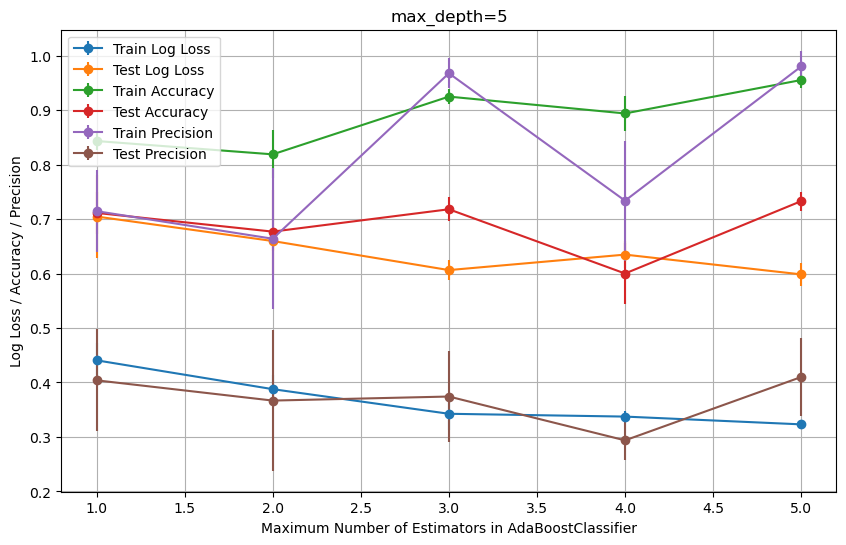

Avg Train Accuracy:
 [0.84314214 0.81870324 0.92468828 0.89376559 0.95511222]
Avg Test Accuracy:
 [0.71119403 0.67686567 0.71791045 0.6        0.73283582]
Avg Train Precision:
 [0.71440565 0.66379129 0.96750146 0.73362714 0.97998157]
Avg Test Precision:
 [0.40390552 0.36676008 0.37419542 0.2937659  0.40997316]
Avg Train Log Loss:
 [0.44064372 0.38771889 0.34253244 0.33738272 0.3231097 ]
Avg Test Log Loss:
 [0.70453995 0.65960382 0.60627124 0.63467616 0.59837999]


In [182]:
n_estimators_range = list(range(1, 6))

classifier_params = {
    # 'criterion': 'log_loss',
    'max_depth': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`, `criterion='log_loss`

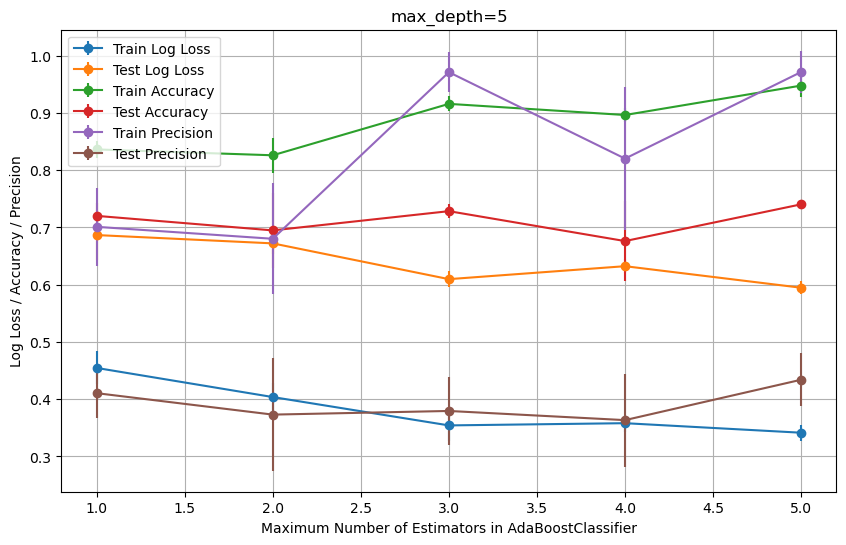

Avg Train Accuracy:
 [0.8361596  0.82593516 0.91571072 0.89625935 0.94763092]
Avg Test Accuracy:
 [0.72014925 0.69477612 0.72835821 0.6761194  0.74029851]
Avg Train Precision:
 [0.70101033 0.68013087 0.97103973 0.8201142  0.97136067]
Avg Test Precision:
 [0.41056765 0.37312145 0.37949395 0.36349604 0.43402577]
Avg Train Log Loss:
 [0.45460881 0.40378106 0.35426556 0.35814274 0.34149783]
Avg Test Log Loss:
 [0.6866295  0.67211026 0.60965348 0.63227576 0.59466861]


In [183]:
### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`
n_estimators_range = list(range(1, 6))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=4`, `criterion='log_loss`

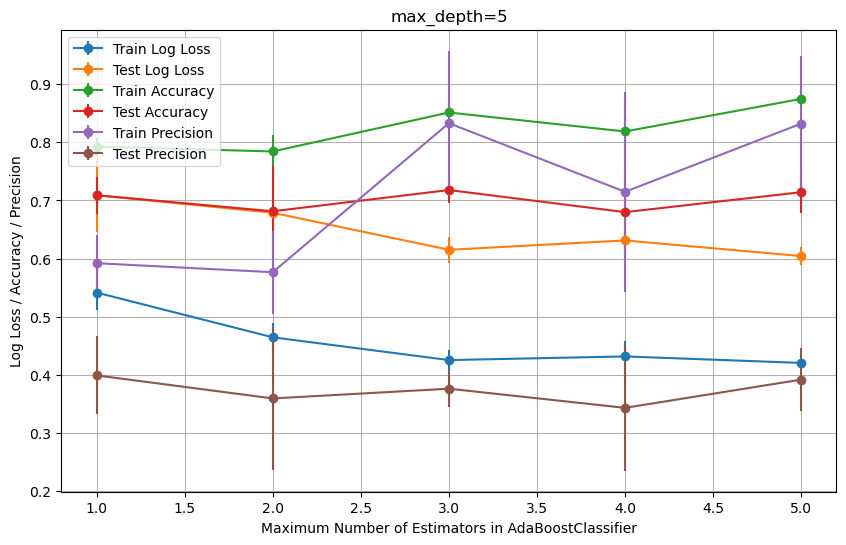

Avg Train Accuracy:
 [0.79276808 0.78428928 0.85137157 0.81870324 0.87481297]
Avg Test Accuracy:
 [0.70895522 0.68134328 0.71791045 0.67985075 0.7141791 ]
Avg Train Precision:
 [0.59198444 0.57644135 0.83298515 0.71485385 0.83225955]
Avg Test Precision:
 [0.39883279 0.35917703 0.37593777 0.34298304 0.3915692 ]
Avg Train Log Loss:
 [0.54139185 0.46438377 0.42519493 0.43149035 0.42032382]
Avg Test Log Loss:
 [0.70901756 0.67882232 0.61508149 0.6311535  0.60424433]


In [184]:
### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`
n_estimators_range = list(range(1, 6))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 4,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 10]`, RFC: `max_depth=5`, `criterion='log_loss`, `min_samples_leaf=25`

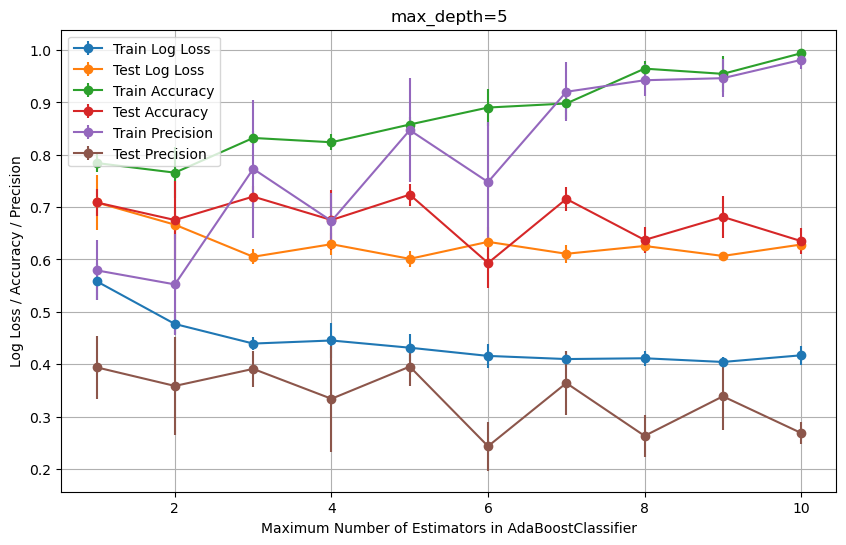

Avg Train Accuracy:
 [0.78428928 0.76583541 0.83216958 0.82394015 0.85785536 0.89027431
 0.89800499 0.96458853 0.95461347 0.99401496]
Avg Test Accuracy:
 [0.70895522 0.67537313 0.72014925 0.67537313 0.7238806  0.59328358
 0.71567164 0.63731343 0.68134328 0.63507463]
Avg Train Precision:
 [0.57924307 0.55239256 0.77314421 0.67353723 0.84710261 0.74794376
 0.92036719 0.94239907 0.94636984 0.9812962 ]
Avg Test Precision:
 [0.39394819 0.35839692 0.39099317 0.33388889 0.39533624 0.24320614
 0.36392566 0.26299936 0.33857636 0.26845581]
Avg Train Log Loss:
 [0.55834946 0.47674843 0.43936474 0.44522502 0.43144182 0.41577991
 0.4097665  0.4112829  0.40420927 0.41694181]
Avg Test Log Loss:
 [0.70901756 0.666454   0.60517282 0.62919842 0.60122652 0.63369204
 0.61088652 0.62579818 0.60675422 0.62855499]


In [187]:
### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`
n_estimators_range = list(range(1, 11))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 5,
    'min_samples_leaf': 25
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 10]`, RFC: `max_depth=5`, `criterion='log_loss`, `min_samples_leaf=5`

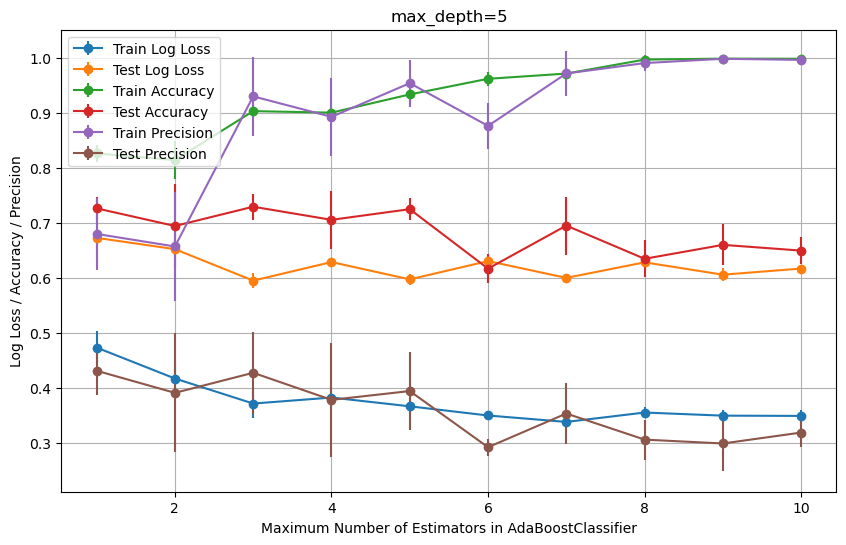

Avg Train Accuracy:
 [0.82668329 0.81471322 0.90374065 0.90099751 0.93416459 0.96259352
 0.97206983 0.99750623 0.99925187 0.99900249]
Avg Test Accuracy:
 [0.72686567 0.69477612 0.72985075 0.70597015 0.72537313 0.61716418
 0.69552239 0.63507463 0.66044776 0.65      ]
Avg Train Precision:
 [0.68036928 0.65750428 0.93062986 0.8933758  0.95459847 0.87692508
 0.97228948 0.99118502 0.9989899  0.99696457]
Avg Test Precision:
 [0.43138715 0.39119883 0.42771411 0.3784595  0.39446546 0.29225908
 0.35357761 0.30611691 0.29906717 0.31894636]
Avg Train Log Loss:
 [0.47356143 0.41729351 0.37170749 0.38264019 0.36670084 0.34998452
 0.33830152 0.35537337 0.34971086 0.34924703]
Avg Test Log Loss:
 [0.67319667 0.65262494 0.59537472 0.6291401  0.59764594 0.63092534
 0.60035394 0.62866666 0.60616892 0.61735464]


In [188]:
### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`
n_estimators_range = list(range(1, 11))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 5,
    'min_samples_leaf': 5
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 10]`, RFC: `max_depth=5`, `criterion='log_loss`, `min_samples_leaf=5`, `min_samples_split=5`

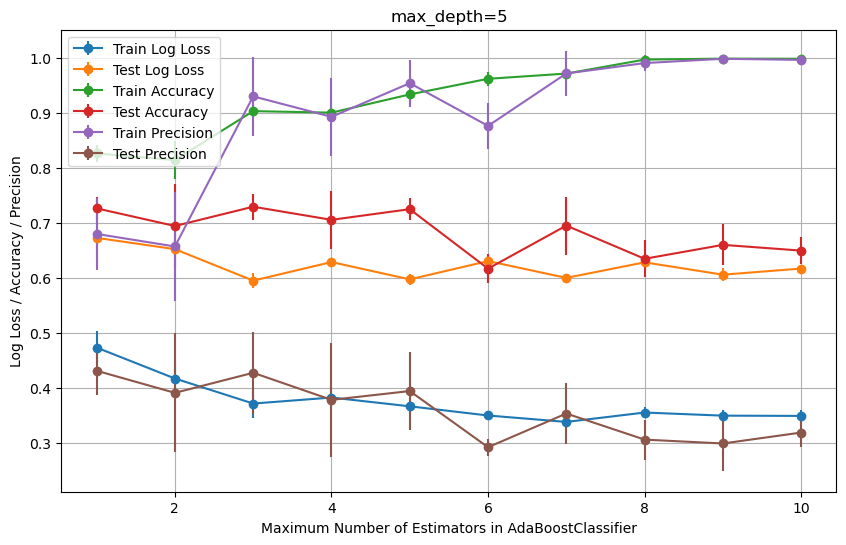

Avg Train Accuracy:
 [0.82668329 0.81471322 0.90374065 0.90099751 0.93416459 0.96259352
 0.97206983 0.99750623 0.99925187 0.99900249]
Avg Test Accuracy:
 [0.72686567 0.69477612 0.72985075 0.70597015 0.72537313 0.61716418
 0.69552239 0.63507463 0.66044776 0.65      ]
Avg Train Precision:
 [0.68036928 0.65750428 0.93062986 0.8933758  0.95459847 0.87692508
 0.97228948 0.99118502 0.9989899  0.99696457]
Avg Test Precision:
 [0.43138715 0.39119883 0.42771411 0.3784595  0.39446546 0.29225908
 0.35357761 0.30611691 0.29906717 0.31894636]
Avg Train Log Loss:
 [0.47356143 0.41729351 0.37170749 0.38264019 0.36670084 0.34998452
 0.33830152 0.35537337 0.34971086 0.34924703]
Avg Test Log Loss:
 [0.67319667 0.65262494 0.59537472 0.6291401  0.59764594 0.63092534
 0.60035394 0.62866666 0.60616892 0.61735464]


In [189]:
### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`
n_estimators_range = list(range(1, 11))

classifier_params = {
    'criterion': 'log_loss',
    'max_depth': 5,
    'min_samples_leaf': 5,
    'min_samples_split': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 10]`, RFC: `max_depth=5`, `min_samples_leaf=5`

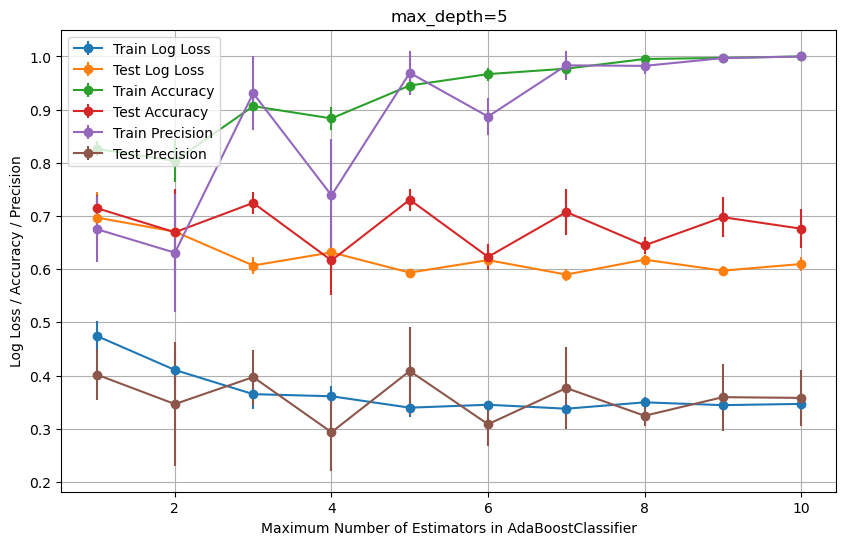

Avg Train Accuracy:
 [0.82618454 0.80374065 0.90648379 0.88354115 0.94538653 0.96683292
 0.97705736 0.99526185 0.99725686 1.        ]
Avg Test Accuracy:
 [0.71492537 0.66940299 0.72462687 0.61641791 0.73059701 0.62313433
 0.70746269 0.64477612 0.69776119 0.6761194 ]
Avg Train Precision:
 [0.67537346 0.63098206 0.93086527 0.73880156 0.9691832  0.88699003
 0.98331741 0.98230207 0.99693813 1.        ]
Avg Test Precision:
 [0.40188111 0.34630965 0.39707155 0.29337852 0.40849346 0.30841082
 0.37649874 0.32433788 0.3593138  0.35791246]
Avg Train Log Loss:
 [0.47455893 0.41045452 0.36499225 0.36101091 0.33953424 0.34505904
 0.33760881 0.34954345 0.34431536 0.34663647]
Avg Test Log Loss:
 [0.69707726 0.67059161 0.60686164 0.63157081 0.59350274 0.61704177
 0.58980828 0.61792916 0.59726476 0.60968804]


In [190]:
### ABC: `n_estimators=[1, 5]`, RFC: `max_depth=5`
n_estimators_range = list(range(1, 11))

classifier_params = {
    # 'criterion': 'log_loss',
    'max_depth': 5,
    'min_samples_leaf': 5,
    # 'min_samples_split': 5,
}
xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
ylabel = 'Log Loss / Accuracy / Precision'
title = 'max_depth=5'

modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

### ABC: `n_estimators=[1, 10]`, RFC: `max_depth=5`, `min_samples_leaf=5`, `criterion='log_loss'`, varying `n_estimators`

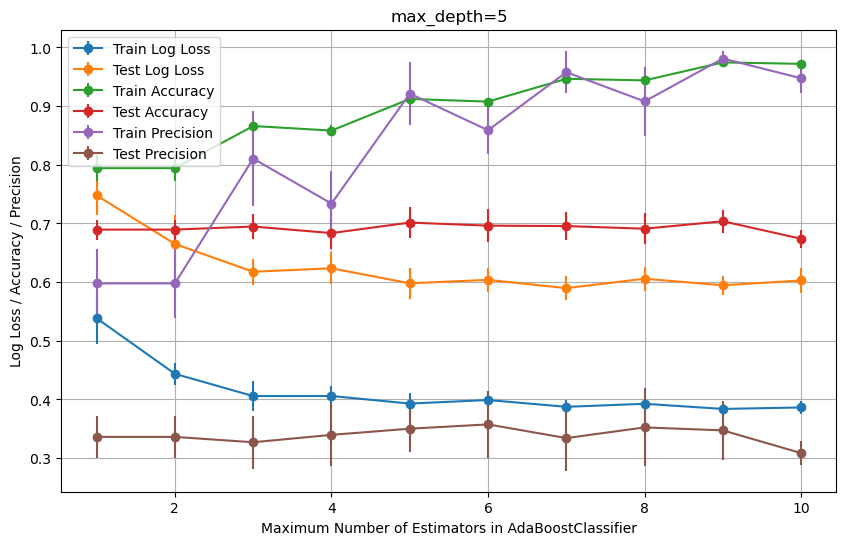

Avg Train Accuracy:
 [0.79426434 0.79426434 0.86608479 0.85835411 0.91221945 0.90773067
 0.94663342 0.94389027 0.97456359 0.97206983]
Avg Test Accuracy:
 [0.68955224 0.68955224 0.69477612 0.68358209 0.70149254 0.69626866
 0.69552239 0.69104478 0.70373134 0.6738806 ]
Avg Train Precision:
 [0.59778962 0.59778962 0.81052609 0.73391599 0.92134285 0.85891881
 0.95784347 0.90807995 0.98114218 0.9475049 ]
Avg Test Precision:
 [0.33613594 0.33613594 0.32699693 0.3396166  0.35012279 0.35747665
 0.33410025 0.35230924 0.34725289 0.30848485]
Avg Train Log Loss:
 [0.53839933 0.44365507 0.40575332 0.40584287 0.39294309 0.39900025
 0.38742431 0.39256884 0.38381631 0.38633608]
Avg Test Log Loss:
 [0.74782353 0.66503611 0.61766925 0.62354173 0.59798781 0.60381497
 0.58972115 0.60577114 0.59459571 0.6027541 ]


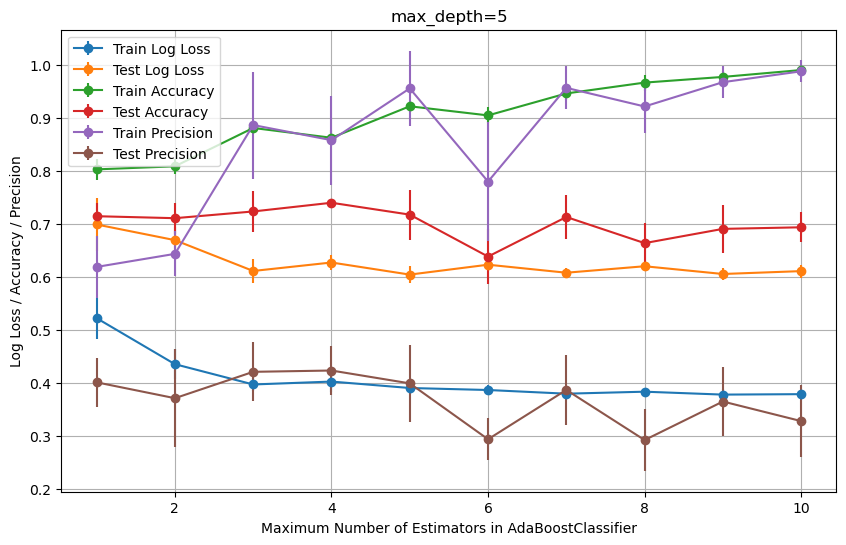

Avg Train Accuracy:
 [0.80249377 0.80822943 0.88054863 0.86209476 0.92144638 0.9042394
 0.94563591 0.96608479 0.97680798 0.98977556]
Avg Test Accuracy:
 [0.7141791  0.71044776 0.72313433 0.73955224 0.71716418 0.6380597
 0.71268657 0.66343284 0.69029851 0.69328358]
Avg Train Precision:
 [0.61856068 0.64319374 0.88607691 0.85754001 0.95517587 0.77945712
 0.95616601 0.9210584  0.9668841  0.98739262]
Avg Test Precision:
 [0.40098657 0.37104447 0.42077056 0.42323802 0.39901132 0.29362877
 0.38663468 0.29214454 0.36479441 0.32787233]
Avg Train Log Loss:
 [0.52194048 0.43519805 0.39692456 0.40240793 0.39027772 0.38649643
 0.37955356 0.38331452 0.37782918 0.37866668]
Avg Test Log Loss:
 [0.6985698  0.6690462  0.61091634 0.62689352 0.60408479 0.62275475
 0.60763865 0.6198319  0.60523868 0.61065928]


In [192]:
for n_trees in range(10, 210, 10):
    n_estimators_range = list(range(1, 11))

    classifier_params = {
        'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in Random Forest Classifier = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

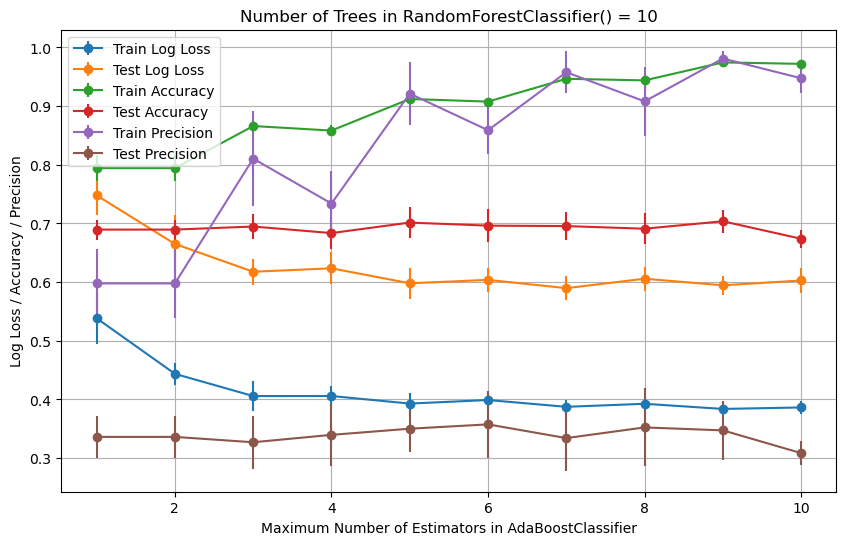

Avg Train Accuracy:
 [0.79426434 0.79426434 0.86608479 0.85835411 0.91221945 0.90773067
 0.94663342 0.94389027 0.97456359 0.97206983]
Avg Test Accuracy:
 [0.68955224 0.68955224 0.69477612 0.68358209 0.70149254 0.69626866
 0.69552239 0.69104478 0.70373134 0.6738806 ]
Avg Train Precision:
 [0.59778962 0.59778962 0.81052609 0.73391599 0.92134285 0.85891881
 0.95784347 0.90807995 0.98114218 0.9475049 ]
Avg Test Precision:
 [0.33613594 0.33613594 0.32699693 0.3396166  0.35012279 0.35747665
 0.33410025 0.35230924 0.34725289 0.30848485]
Avg Train Log Loss:
 [0.53839933 0.44365507 0.40575332 0.40584287 0.39294309 0.39900025
 0.38742431 0.39256884 0.38381631 0.38633608]
Avg Test Log Loss:
 [0.74782353 0.66503611 0.61766925 0.62354173 0.59798781 0.60381497
 0.58972115 0.60577114 0.59459571 0.6027541 ]


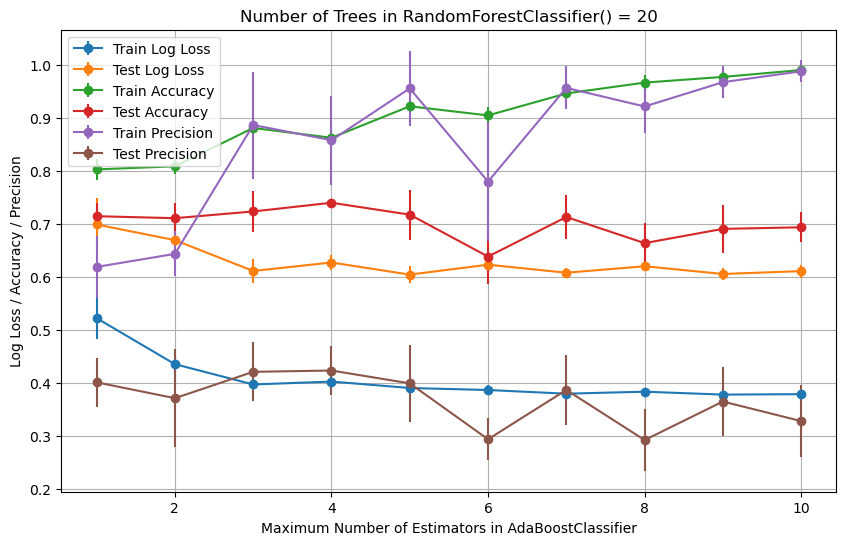

Avg Train Accuracy:
 [0.80249377 0.80822943 0.88054863 0.86209476 0.92144638 0.9042394
 0.94563591 0.96608479 0.97680798 0.98977556]
Avg Test Accuracy:
 [0.7141791  0.71044776 0.72313433 0.73955224 0.71716418 0.6380597
 0.71268657 0.66343284 0.69029851 0.69328358]
Avg Train Precision:
 [0.61856068 0.64319374 0.88607691 0.85754001 0.95517587 0.77945712
 0.95616601 0.9210584  0.9668841  0.98739262]
Avg Test Precision:
 [0.40098657 0.37104447 0.42077056 0.42323802 0.39901132 0.29362877
 0.38663468 0.29214454 0.36479441 0.32787233]
Avg Train Log Loss:
 [0.52194048 0.43519805 0.39692456 0.40240793 0.39027772 0.38649643
 0.37955356 0.38331452 0.37782918 0.37866668]
Avg Test Log Loss:
 [0.6985698  0.6690462  0.61091634 0.62689352 0.60408479 0.62275475
 0.60763865 0.6198319  0.60523868 0.61065928]


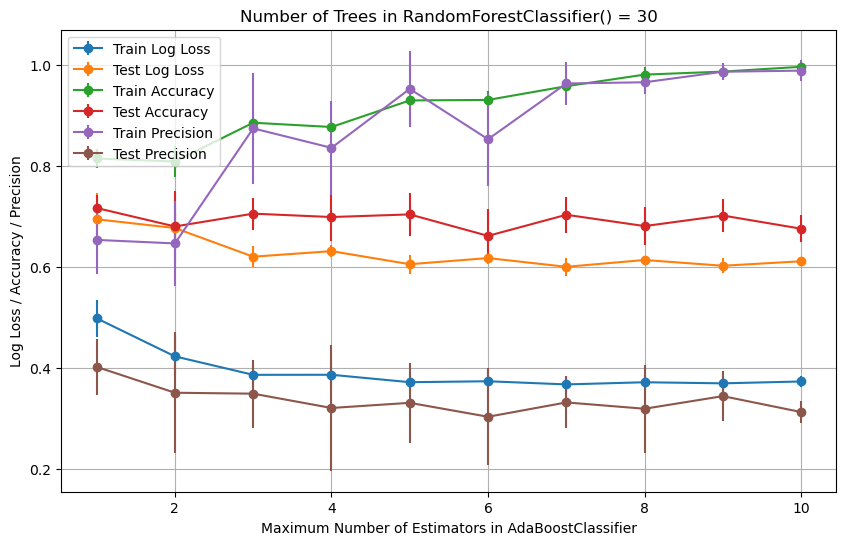

Avg Train Accuracy:
 [0.81446384 0.8084788  0.88528678 0.87680798 0.92942643 0.93042394
 0.95760599 0.98054863 0.98653367 0.99600998]
Avg Test Accuracy:
 [0.71641791 0.67985075 0.70522388 0.69850746 0.70373134 0.66119403
 0.70298507 0.68059701 0.70149254 0.67537313]
Avg Train Precision:
 [0.65323963 0.64626072 0.87410316 0.83553983 0.95227358 0.85259056
 0.96300947 0.96537615 0.98627451 0.98841298]
Avg Test Precision:
 [0.40180247 0.35057932 0.34872645 0.32040138 0.33060041 0.30299729
 0.33138389 0.31885741 0.34386377 0.31231668]
Avg Train Log Loss:
 [0.49800033 0.42259401 0.38603867 0.38615885 0.37145368 0.37331347
 0.36706541 0.37134374 0.36919688 0.37287044]
Avg Test Log Loss:
 [0.69409219 0.67673216 0.61997943 0.630983   0.605104   0.61724409
 0.59994765 0.61343489 0.60205681 0.61089003]


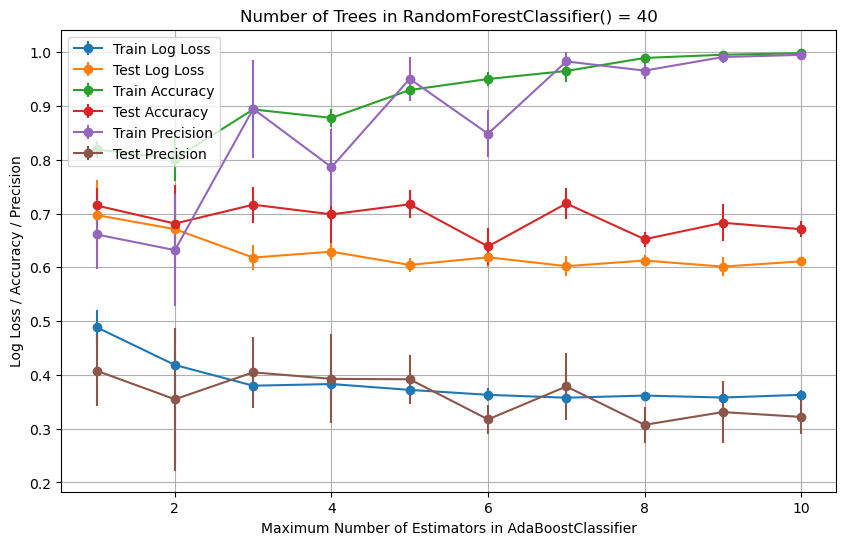

Avg Train Accuracy:
 [0.819202   0.80199501 0.89351621 0.87780549 0.92967581 0.95012469
 0.96508728 0.98927681 0.99526185 0.99800499]
Avg Test Accuracy:
 [0.71492537 0.68134328 0.71641791 0.69850746 0.71716418 0.63880597
 0.71865672 0.65223881 0.68283582 0.67089552]
Avg Train Precision:
 [0.66111036 0.63197156 0.89464301 0.78621665 0.95038205 0.84837817
 0.98280408 0.9657371  0.99102042 0.9950098 ]
Avg Test Precision:
 [0.40765521 0.35463798 0.40472685 0.39257503 0.3917652  0.31718586
 0.37841218 0.30714385 0.33082828 0.32183344]
Avg Train Log Loss:
 [0.48852402 0.41838739 0.3798448  0.38294085 0.37207706 0.362878
 0.3575238  0.36148443 0.35787651 0.36289921]
Avg Test Log Loss:
 [0.69707726 0.67097035 0.61809472 0.62906783 0.60439377 0.61867344
 0.60213287 0.61259928 0.60128593 0.61104664]


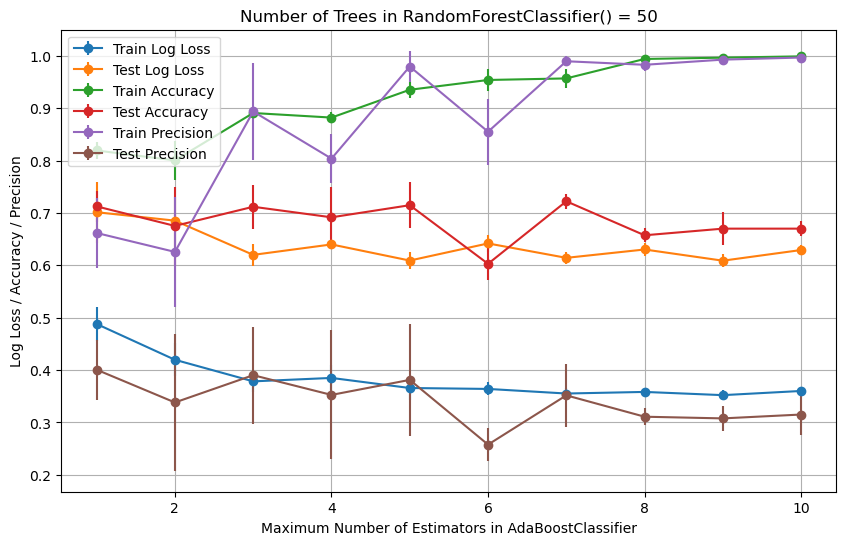

Avg Train Accuracy:
 [0.81945137 0.80049875 0.89102244 0.88229426 0.93541147 0.95411471
 0.95710723 0.99426434 0.9967581  0.99925187]
Avg Test Accuracy:
 [0.71268657 0.67537313 0.7119403  0.69179104 0.71492537 0.60298507
 0.72238806 0.65746269 0.67014925 0.67014925]
Avg Train Precision:
 [0.66186878 0.62571578 0.89396794 0.80389114 0.97984674 0.85529564
 0.98988962 0.98312908 0.99297406 0.997     ]
Avg Test Precision:
 [0.4006809  0.33812447 0.39022063 0.35254826 0.38123932 0.25763093
 0.35170868 0.31089846 0.30769517 0.3150765 ]
Avg Train Log Loss:
 [0.48802527 0.41966874 0.37842466 0.38498587 0.36573139 0.36396857
 0.35519585 0.35826031 0.35210092 0.36009112]
Avg Test Log Loss:
 [0.70155488 0.68542082 0.62005393 0.63999002 0.6091782  0.64190223
 0.61436417 0.63031791 0.60892459 0.62933186]


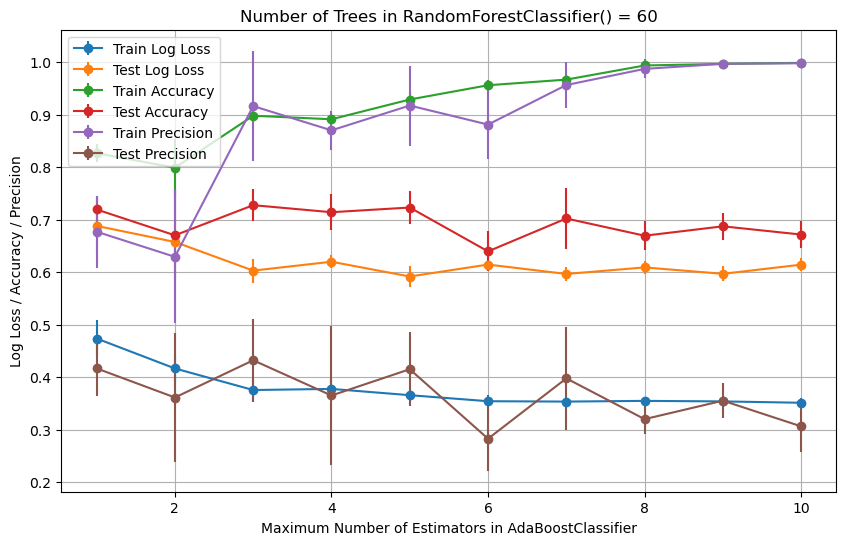

Avg Train Accuracy:
 [0.82668329 0.79900249 0.89800499 0.89127182 0.92892768 0.95610973
 0.96683292 0.99376559 0.9967581  0.99875312]
Avg Test Accuracy:
 [0.71940299 0.67014925 0.72761194 0.7141791  0.72313433 0.63955224
 0.70223881 0.66940299 0.68731343 0.67164179]
Avg Train Precision:
 [0.67706055 0.62916267 0.91638324 0.87017124 0.91742886 0.8811689
 0.95652699 0.98726096 0.99696457 0.9979798 ]
Avg Test Precision:
 [0.41662084 0.36115797 0.43209615 0.36497745 0.4150299  0.2826145
 0.39761861 0.31993192 0.3550972  0.30615927]
Avg Train Log Loss:
 [0.47356143 0.41650189 0.37540181 0.37754254 0.36558707 0.35407887
 0.35338604 0.35472459 0.35372297 0.351125  ]
Avg Test Log Loss:
 [0.68812204 0.65747921 0.60292039 0.61983836 0.59169877 0.61445674
 0.59652495 0.60902581 0.59680239 0.61428534]


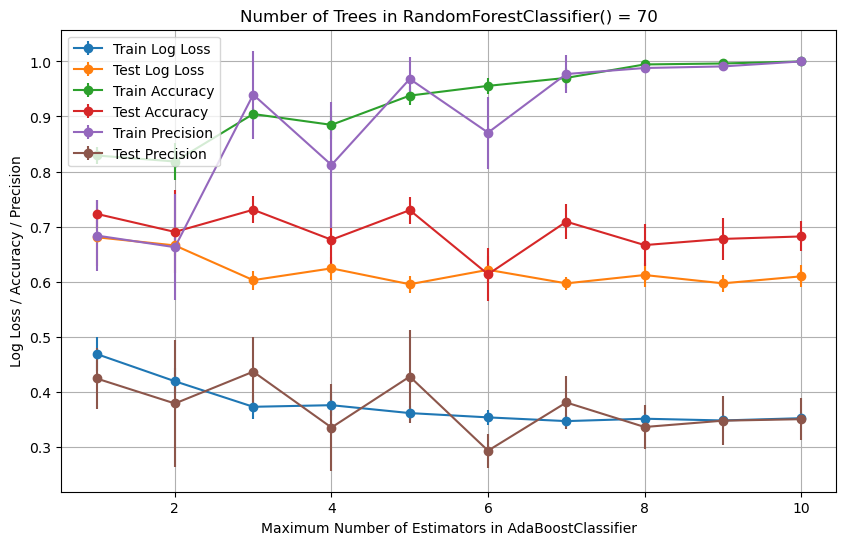

Avg Train Accuracy:
 [0.82917706 0.81820449 0.90448878 0.88478803 0.93790524 0.95561097
 0.97007481 0.99451372 0.99625935 1.        ]
Avg Test Accuracy:
 [0.72313433 0.69029851 0.73059701 0.6761194  0.72985075 0.61343284
 0.70895522 0.66641791 0.67761194 0.68208955]
Avg Train Precision:
 [0.68375793 0.66257712 0.93968624 0.81194166 0.96817158 0.87068097
 0.97714399 0.98802935 0.99092721 1.        ]
Avg Test Precision:
 [0.42411016 0.37870253 0.43648485 0.33505016 0.42756263 0.29300132
 0.38054422 0.33599782 0.3474714  0.35021279]
Avg Train Log Loss:
 [0.4685739  0.41909351 0.37270262 0.37562349 0.36127284 0.35347121
 0.34669771 0.35103137 0.34788452 0.35199854]
Avg Test Log Loss:
 [0.68065935 0.66578563 0.60273237 0.62413629 0.59527739 0.62149725
 0.59688408 0.61202989 0.59693603 0.60963463]


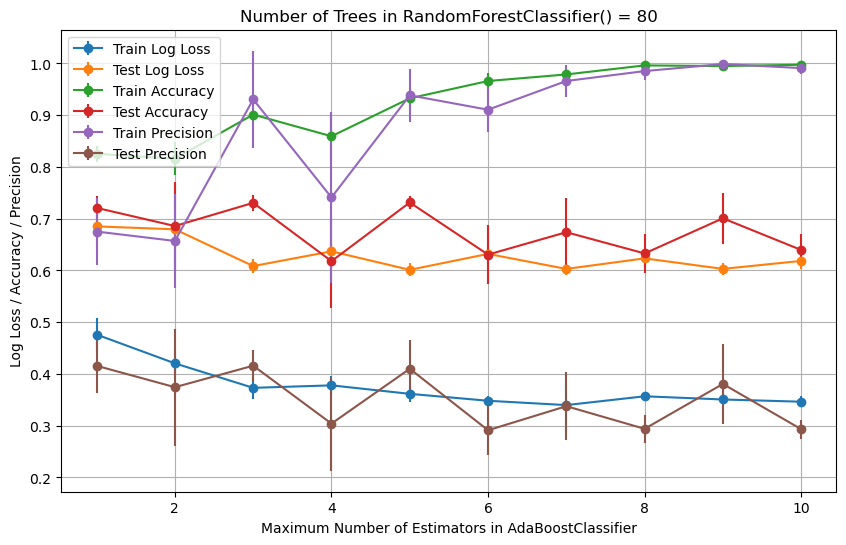

Avg Train Accuracy:
 [0.82543641 0.8159601  0.90124688 0.85935162 0.93266833 0.96608479
 0.97880299 0.99625935 0.99501247 0.99750623]
Avg Test Accuracy:
 [0.72089552 0.6858209  0.73059701 0.61791045 0.73134328 0.63059701
 0.6738806  0.63283582 0.70074627 0.63955224]
Avg Train Precision:
 [0.67514876 0.65699399 0.93065932 0.74103398 0.93842295 0.91064235
 0.96616846 0.98527369 0.9989899  0.99104478]
Avg Test Precision:
 [0.41569703 0.37432975 0.4158752  0.30394667 0.40994461 0.29110295
 0.33765079 0.29387669 0.38063203 0.29316925]
Avg Train Log Loss:
 [0.47605519 0.42040133 0.37307938 0.37788083 0.36148881 0.3481056
 0.33973162 0.35674722 0.35059321 0.34628626]
Avg Test Log Loss:
 [0.68513697 0.67947221 0.60844412 0.63691939 0.60117899 0.6319438
 0.60293634 0.6233243  0.60298718 0.61844338]


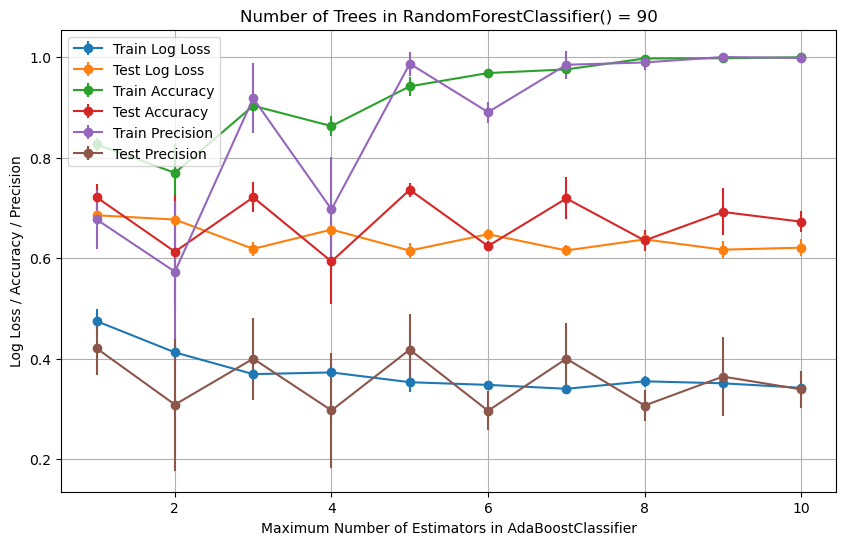

Avg Train Accuracy:
 [0.82618454 0.76957606 0.90299252 0.86259352 0.94164589 0.9680798
 0.97531172 0.99700748 0.99750623 0.99950125]
Avg Test Accuracy:
 [0.72089552 0.61268657 0.72089552 0.59328358 0.7358209  0.6238806
 0.71865672 0.63507463 0.69179104 0.67238806]
Avg Train Precision:
 [0.67683935 0.5728596  0.9179919  0.69697116 0.98674299 0.89029904
 0.98456248 0.98915969 1.         0.99798995]
Avg Test Precision:
 [0.42045177 0.30849257 0.39990342 0.2969589  0.41795077 0.2962707
 0.39987901 0.30675421 0.36429381 0.33885788]
Avg Train Log Loss:
 [0.47455893 0.41239087 0.36918835 0.37254361 0.35308437 0.34779179
 0.34000999 0.35486283 0.35093746 0.34202694]
Avg Test Log Loss:
 [0.68513697 0.67668212 0.6183614  0.65668952 0.61490057 0.64754121
 0.61518037 0.63720248 0.61676443 0.62074077]


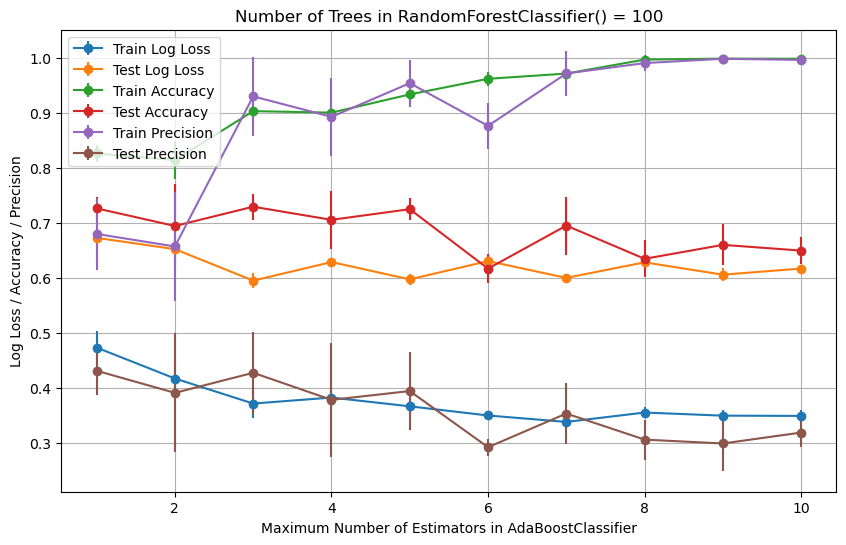

Avg Train Accuracy:
 [0.82668329 0.81471322 0.90374065 0.90099751 0.93416459 0.96259352
 0.97206983 0.99750623 0.99925187 0.99900249]
Avg Test Accuracy:
 [0.72686567 0.69477612 0.72985075 0.70597015 0.72537313 0.61716418
 0.69552239 0.63507463 0.66044776 0.65      ]
Avg Train Precision:
 [0.68036928 0.65750428 0.93062986 0.8933758  0.95459847 0.87692508
 0.97228948 0.99118502 0.9989899  0.99696457]
Avg Test Precision:
 [0.43138715 0.39119883 0.42771411 0.3784595  0.39446546 0.29225908
 0.35357761 0.30611691 0.29906717 0.31894636]
Avg Train Log Loss:
 [0.47356143 0.41729351 0.37170749 0.38264019 0.36670084 0.34998452
 0.33830152 0.35537337 0.34971086 0.34924703]
Avg Test Log Loss:
 [0.67319667 0.65262494 0.59537472 0.6291401  0.59764594 0.63092534
 0.60035394 0.62866666 0.60616892 0.61735464]


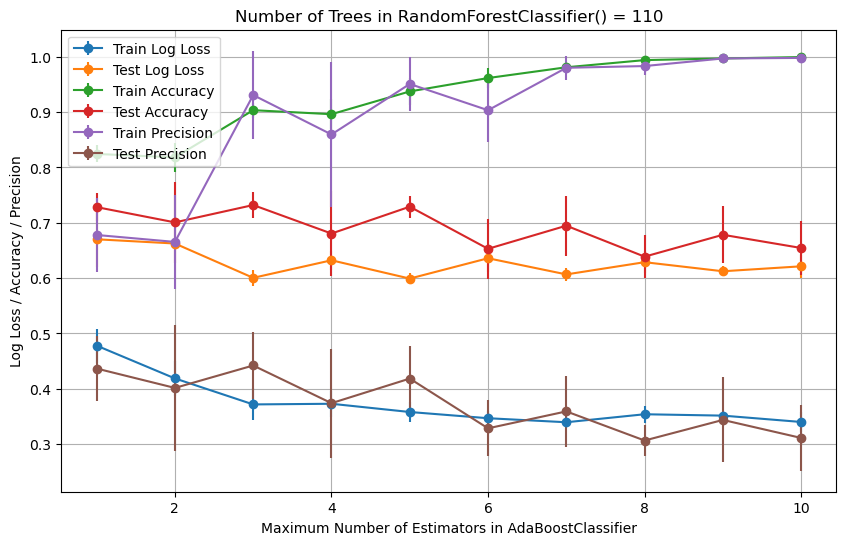

Avg Train Accuracy:
 [0.8244389  0.81820449 0.90349127 0.89625935 0.93740648 0.96159601
 0.98104738 0.99401496 0.99700748 0.99950125]
Avg Test Accuracy:
 [0.72835821 0.70074627 0.73208955 0.68059701 0.72910448 0.65298507
 0.69477612 0.63880597 0.67835821 0.65447761]
Avg Train Precision:
 [0.67799081 0.66544845 0.93081113 0.85963032 0.95086226 0.90344031
 0.98012602 0.98325438 0.99697985 0.9979798 ]
Avg Test Precision:
 [0.43661978 0.4015784  0.44212835 0.37403245 0.41849135 0.32859575
 0.35917311 0.30655793 0.34375449 0.3111896 ]
Avg Train Log Loss:
 [0.47805021 0.41876805 0.37178067 0.37295973 0.35808512 0.34684175
 0.33956834 0.35401863 0.35153683 0.34007153]
Avg Test Log Loss:
 [0.67021159 0.66257639 0.60052914 0.63227339 0.59918944 0.6359428
 0.60673701 0.62881595 0.61241804 0.62136849]


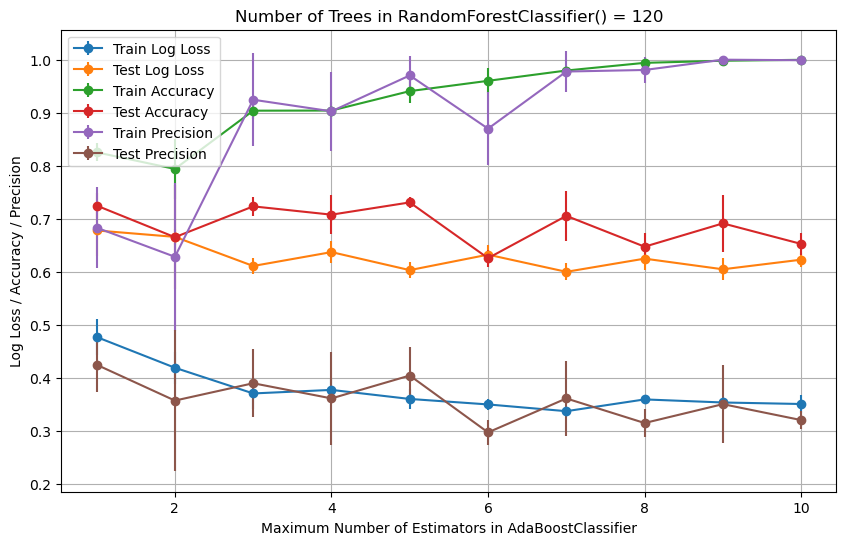

Avg Train Accuracy:
 [0.82518703 0.79376559 0.90374065 0.90399002 0.94064838 0.96009975
 0.97955112 0.99401496 0.99800499 0.99975062]
Avg Test Accuracy:
 [0.72462687 0.66492537 0.72313433 0.70746269 0.73059701 0.62537313
 0.70522388 0.64701493 0.69104478 0.65223881]
Avg Train Precision:
 [0.68292857 0.62794082 0.92442457 0.90252528 0.97025738 0.86980149
 0.97762296 0.98057344 1.         0.9989899 ]
Avg Test Precision:
 [0.42419787 0.35655232 0.38928299 0.36066234 0.4038197  0.29649848
 0.36058488 0.31418557 0.34981668 0.31974077]
Avg Train Log Loss:
 [0.47655395 0.41852109 0.37003105 0.37671508 0.35963474 0.34927909
 0.33654696 0.35875737 0.35297713 0.35010232]
Avg Test Log Loss:
 [0.67767428 0.66553669 0.61060958 0.63681166 0.60278379 0.63198132
 0.59959485 0.62446929 0.60437246 0.62249719]


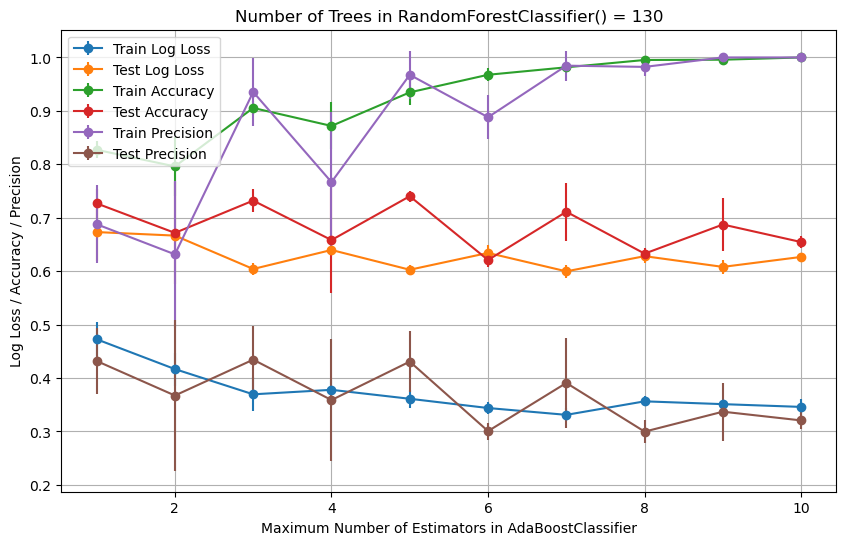

Avg Train Accuracy:
 [0.82718204 0.79600998 0.90548628 0.87182045 0.93466334 0.96758105
 0.98154613 0.99526185 0.9957606  1.        ]
Avg Test Accuracy:
 [0.72686567 0.67164179 0.73208955 0.65820896 0.74029851 0.62089552
 0.71119403 0.63283582 0.68731343 0.65447761]
Avg Train Precision:
 [0.68784502 0.63148604 0.93536839 0.7666761  0.96752604 0.88813298
 0.98463913 0.9823173  1.         1.        ]
Avg Test Precision:
 [0.43190655 0.36727623 0.43441296 0.35880553 0.43076249 0.30066353
 0.39081087 0.29969663 0.33701451 0.32068208]
Avg Train Log Loss:
 [0.47256392 0.41673855 0.36952984 0.3779389  0.36118466 0.34387763
 0.33110551 0.35638626 0.35113707 0.34596489]
Avg Test Log Loss:
 [0.67319667 0.66657625 0.60409826 0.63968414 0.60265928 0.63415797
 0.59967551 0.62807975 0.60801247 0.62667395]


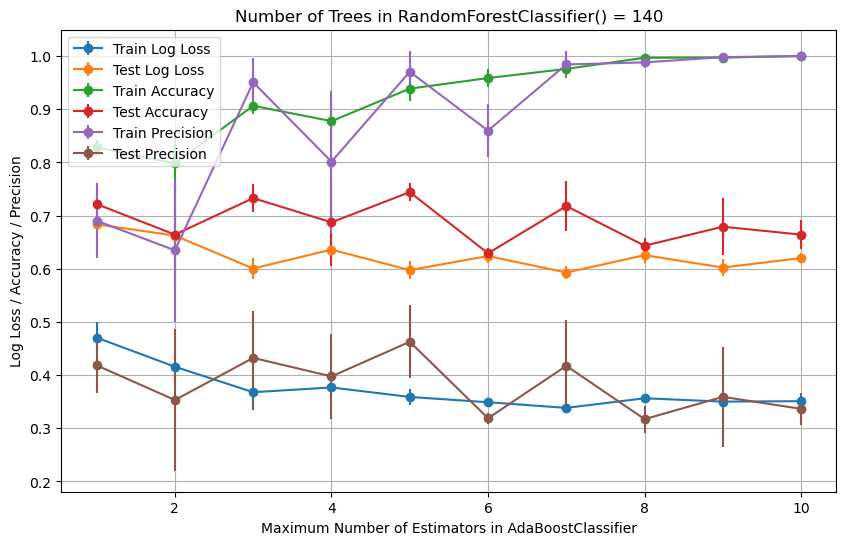

Avg Train Accuracy:
 [0.82817955 0.79825436 0.90648379 0.87755611 0.93865337 0.95860349
 0.97581047 0.9967581  0.99700748 1.        ]
Avg Test Accuracy:
 [0.72164179 0.6641791  0.73283582 0.68731343 0.74402985 0.62910448
 0.71791045 0.64328358 0.67910448 0.6641791 ]
Avg Train Precision:
 [0.69030813 0.63464191 0.95057689 0.80131596 0.9704698  0.8597467
 0.98424539 0.98805418 0.9979798  1.        ]
Avg Test Precision:
 [0.41844777 0.35319417 0.43240775 0.39759631 0.46270945 0.31892216
 0.41751719 0.31722338 0.35912788 0.33658451]
Avg Train Log Loss:
 [0.47056891 0.41575227 0.36788353 0.37680312 0.35899807 0.3490158
 0.33837751 0.35648935 0.35015994 0.35100749]
Avg Test Log Loss:
 [0.68364443 0.66235497 0.60047321 0.6360104  0.5974517  0.62400978
 0.5928435  0.62557993 0.6022762  0.6201255 ]


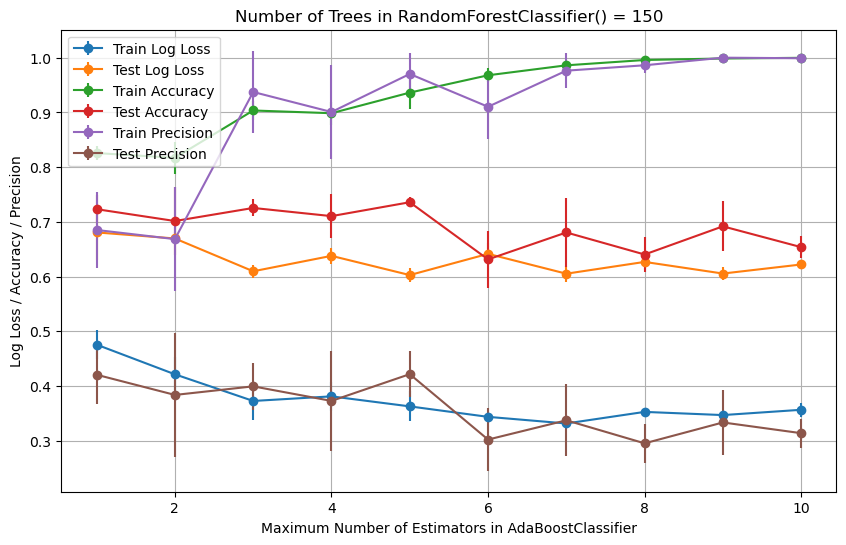

Avg Train Accuracy:
 [0.82568579 0.81695761 0.90349127 0.89850374 0.9361596  0.96783042
 0.98603491 0.9957606  0.99850374 0.99975062]
Avg Test Accuracy:
 [0.72313433 0.70149254 0.72537313 0.71044776 0.7358209  0.63134328
 0.68059701 0.64029851 0.69179104 0.65373134]
Avg Train Precision:
 [0.68513152 0.66840294 0.93730812 0.90072153 0.97024338 0.91029289
 0.97626901 0.98611705 1.         0.9989899 ]
Avg Test Precision:
 [0.42056864 0.38366791 0.39935516 0.37272792 0.42163492 0.30209097
 0.33728804 0.29521023 0.3333754  0.31377735]
Avg Train Log Loss:
 [0.47555644 0.42136847 0.37264159 0.38107444 0.3627386  0.34360444
 0.33152075 0.35267672 0.3468578  0.35651422]
Avg Test Log Loss:
 [0.68065935 0.66958821 0.6096352  0.63784172 0.60271563 0.6414851
 0.60521667 0.6267702  0.60549646 0.62206841]


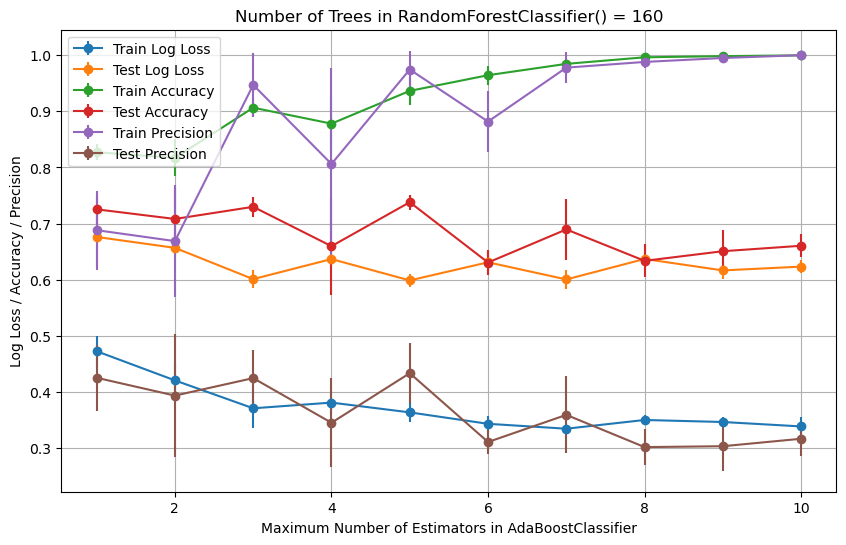

Avg Train Accuracy:
 [0.82718204 0.81695761 0.90648379 0.87805486 0.93640898 0.96433915
 0.98453865 0.99625935 0.99825436 0.99975062]
Avg Test Accuracy:
 [0.72537313 0.70820896 0.72985075 0.65970149 0.7380597  0.63059701
 0.68955224 0.63358209 0.65074627 0.66044776]
Avg Train Precision:
 [0.68822003 0.66874323 0.9470553  0.8061294  0.97449305 0.8817309
 0.97783816 0.98797985 0.99498995 1.        ]
Avg Test Precision:
 [0.42525635 0.39346385 0.42462809 0.34507799 0.43341717 0.31079633
 0.35913842 0.30170759 0.30328267 0.31659686]
Avg Train Log Loss:
 [0.47256392 0.42058    0.37086114 0.38099939 0.36356996 0.3431933
 0.33447571 0.35003225 0.34642875 0.33854624]
Avg Test Log Loss:
 [0.67618174 0.65673027 0.60100799 0.6367581  0.59869985 0.63101202
 0.60045237 0.6369193  0.61653389 0.62328153]


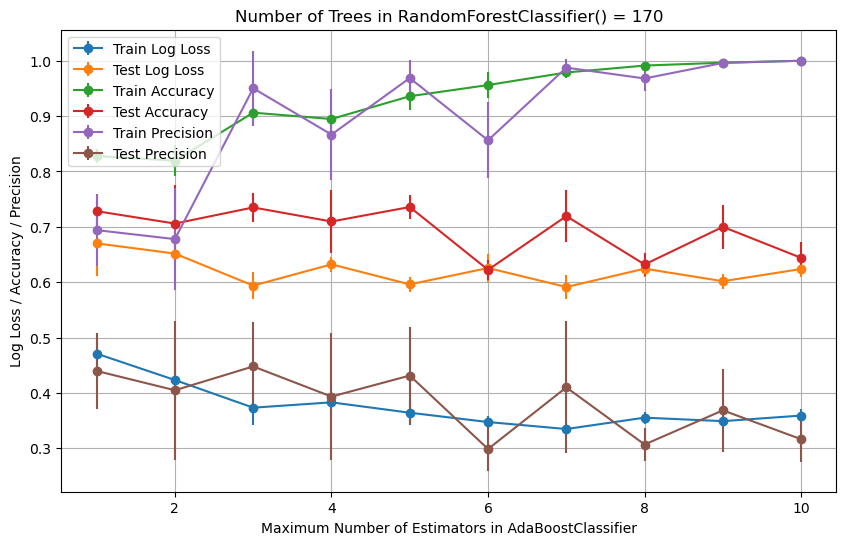

Avg Train Accuracy:
 [0.82793017 0.81945137 0.90623441 0.89476309 0.93591022 0.95610973
 0.97880299 0.99127182 0.99650873 1.        ]
Avg Test Accuracy:
 [0.72835821 0.70597015 0.73507463 0.70970149 0.7358209  0.62238806
 0.71940299 0.63208955 0.7        0.64402985]
Avg Train Precision:
 [0.69409776 0.67787473 0.95029618 0.86669397 0.96873885 0.85633135
 0.98753259 0.96799475 0.9960199  1.        ]
Avg Test Precision:
 [0.43979451 0.40492964 0.44793175 0.39350144 0.43146769 0.29878239
 0.41011255 0.30696285 0.36864884 0.31647207]
Avg Train Log Loss:
 [0.47106766 0.42338921 0.37346119 0.3830869  0.36435769 0.34751465
 0.33490535 0.3554358  0.349119   0.3592173 ]
Avg Test Log Loss:
 [0.67021159 0.65172809 0.59392502 0.63230836 0.59610292 0.62570838
 0.59138422 0.62450413 0.60182594 0.6238849 ]


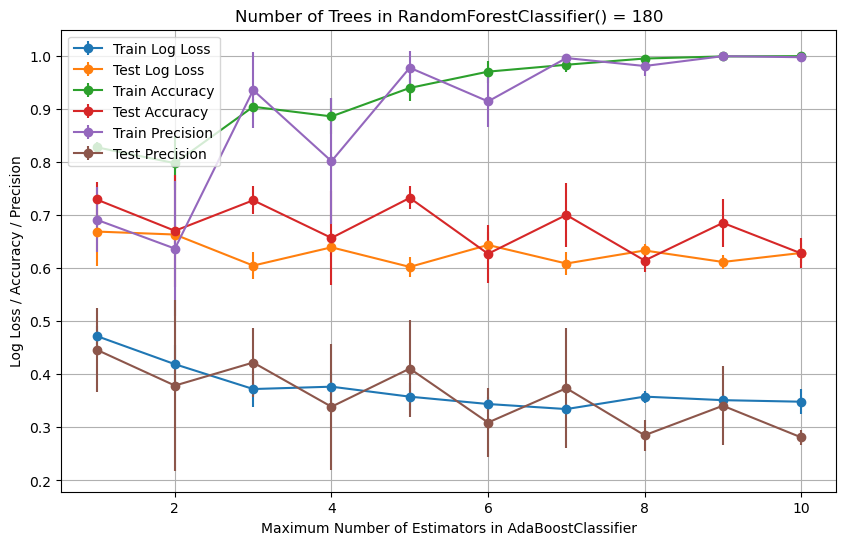

Avg Train Accuracy:
 [0.82743142 0.79750623 0.90374065 0.88553616 0.93915212 0.96982544
 0.98279302 0.99451372 0.99850374 0.99900249]
Avg Test Accuracy:
 [0.72910448 0.67014925 0.72761194 0.65671642 0.73208955 0.62686567
 0.7        0.6141791  0.68507463 0.62761194]
Avg Train Precision:
 [0.69101455 0.63664973 0.9349727  0.80120118 0.97720904 0.91378836
 0.99541334 0.9804405  0.9989899  0.99698492]
Avg Test Precision:
 [0.44621818 0.37871494 0.42211935 0.33885334 0.41071855 0.30909842
 0.37376263 0.2851993  0.34077208 0.28119664]
Avg Train Log Loss:
 [0.47206517 0.41897218 0.37221736 0.37664378 0.35783599 0.34401327
 0.33448385 0.35792221 0.35126977 0.34834637]
Avg Test Log Loss:
 [0.66871906 0.66312743 0.60463283 0.63905704 0.60216289 0.64347827
 0.60853946 0.63307641 0.61146312 0.62845055]


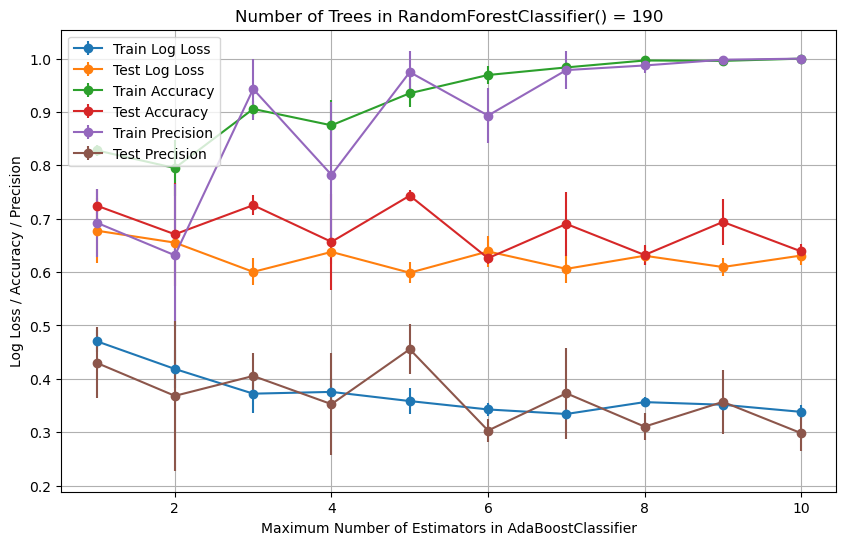

Avg Train Accuracy:
 [0.82817955 0.79501247 0.90573566 0.87506234 0.93516209 0.96932668
 0.98354115 0.99650873 0.9957606  1.        ]
Avg Test Accuracy:
 [0.72462687 0.67089552 0.72537313 0.65671642 0.74328358 0.6261194
 0.69029851 0.63208955 0.69402985 0.63880597]
Avg Train Precision:
 [0.69264924 0.63148192 0.94307342 0.78222033 0.97473019 0.89332145
 0.97855174 0.98718507 0.99798995 1.        ]
Avg Test Precision:
 [0.43001883 0.36817073 0.40542769 0.35260937 0.45551822 0.30316281
 0.37300654 0.31052235 0.35691643 0.29828194]
Avg Train Log Loss:
 [0.47056891 0.41853966 0.37226453 0.37558397 0.35840159 0.34267561
 0.33420129 0.35645878 0.35149435 0.33817117]
Avg Test Log Loss:
 [0.67767428 0.65524595 0.60045058 0.63784583 0.59884682 0.63875311
 0.60610965 0.63066939 0.60956083 0.63104518]


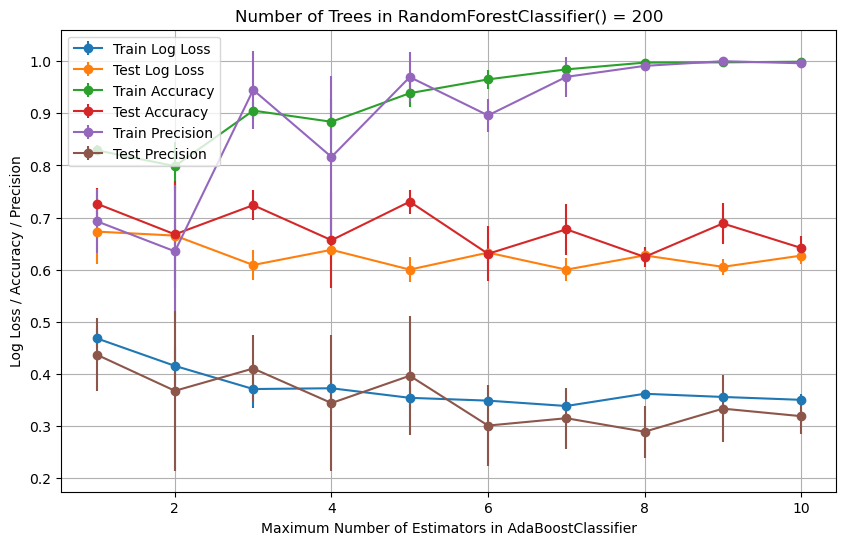

Avg Train Accuracy:
 [0.82917706 0.79875312 0.90523691 0.88379052 0.93865337 0.96508728
 0.98428928 0.99725686 0.99775561 0.99900249]
Avg Test Accuracy:
 [0.72686567 0.66791045 0.7238806  0.65671642 0.73059701 0.63059701
 0.67761194 0.62462687 0.68880597 0.64179104]
Avg Train Precision:
 [0.69314878 0.63534142 0.944904   0.81636778 0.96951372 0.89603403
 0.96994302 0.99098944 1.         0.9959899 ]
Avg Test Precision:
 [0.43724973 0.36785877 0.41063626 0.34437254 0.39672387 0.30120634
 0.31530583 0.28943098 0.33366476 0.31922859]
Avg Train Log Loss:
 [0.4685739  0.41565568 0.37128702 0.37276235 0.35439912 0.34901914
 0.33874931 0.36218482 0.35608845 0.35055025]
Avg Test Log Loss:
 [0.67319667 0.6655217  0.60913533 0.63825583 0.60028737 0.63289999
 0.60019935 0.62752801 0.6055947  0.62716735]


In [194]:
for n_trees in range(10, 210, 10):
    n_estimators_range = list(range(1, 11))

    classifier_params = {
        'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in RandomForestClassifier() = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

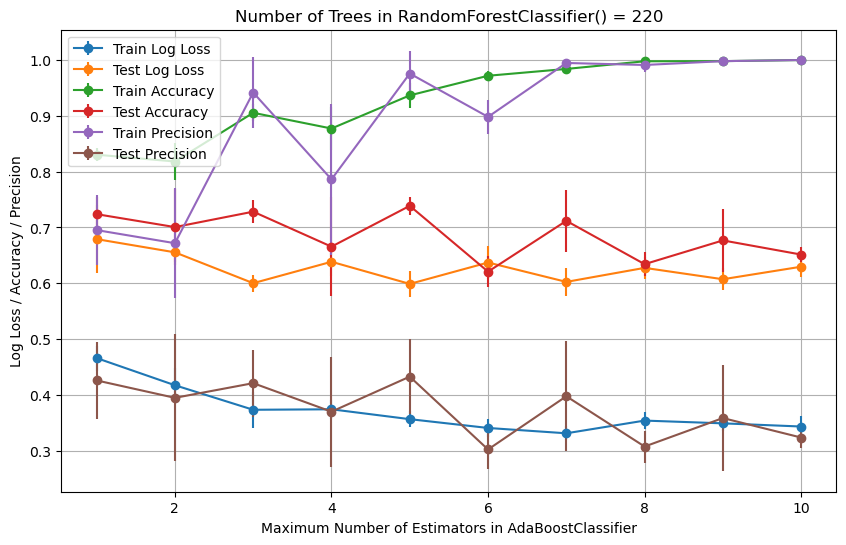

Avg Train Accuracy:
 [0.83042394 0.81820449 0.90548628 0.87730673 0.93665835 0.97182045
 0.9840399  0.99775561 0.99800499 1.        ]
Avg Test Accuracy:
 [0.7238806  0.70074627 0.72835821 0.66567164 0.73880597 0.62089552
 0.7119403  0.63432836 0.67686567 0.65149254]
Avg Train Precision:
 [0.69535489 0.6718698  0.94179558 0.78618995 0.97581235 0.89812706
 0.99472727 0.9911272  0.99798995 1.        ]
Avg Test Precision:
 [0.42605587 0.39486943 0.42116013 0.37009481 0.43285714 0.30235939
 0.39768116 0.30761845 0.35863882 0.32373608]
Avg Train Log Loss:
 [0.46608013 0.41744489 0.37348041 0.37435604 0.35666772 0.3409013
 0.33136011 0.35412047 0.34917941 0.34348015]
Avg Test Log Loss:
 [0.67916682 0.65550751 0.60025327 0.63860093 0.59895136 0.63727607
 0.60255828 0.62769082 0.6073125  0.62976781]


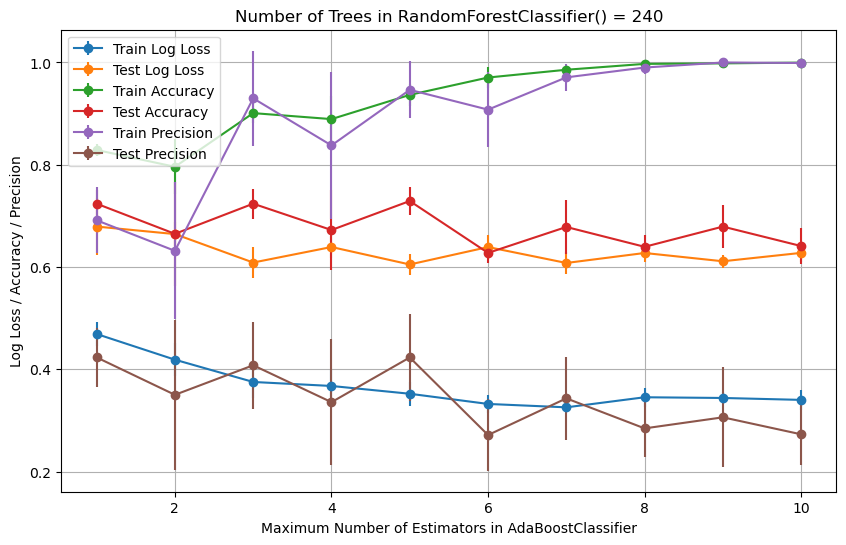

Avg Train Accuracy:
 [0.82892768 0.79600998 0.90099751 0.88927681 0.93665835 0.97057357
 0.98578554 0.99725686 0.99825436 0.99975062]
Avg Test Accuracy:
 [0.7238806  0.66492537 0.7238806  0.67238806 0.72910448 0.62761194
 0.67835821 0.63955224 0.67910448 0.64104478]
Avg Train Precision:
 [0.69143806 0.63168994 0.92992446 0.83779864 0.94651537 0.90779527
 0.97088478 0.99010857 1.         0.9989899 ]
Avg Test Precision:
 [0.42333333 0.35014558 0.40791859 0.33576711 0.42319953 0.27150723
 0.3432185  0.28451413 0.30613735 0.27289702]
Avg Train Log Loss:
 [0.46907265 0.41884229 0.37527413 0.36745051 0.35223133 0.3323073
 0.32566899 0.34537658 0.34398602 0.34022988]
Avg Test Log Loss:
 [0.67916682 0.66446504 0.60878757 0.63916722 0.60502054 0.63910239
 0.60795551 0.62747565 0.6112875  0.62770982]


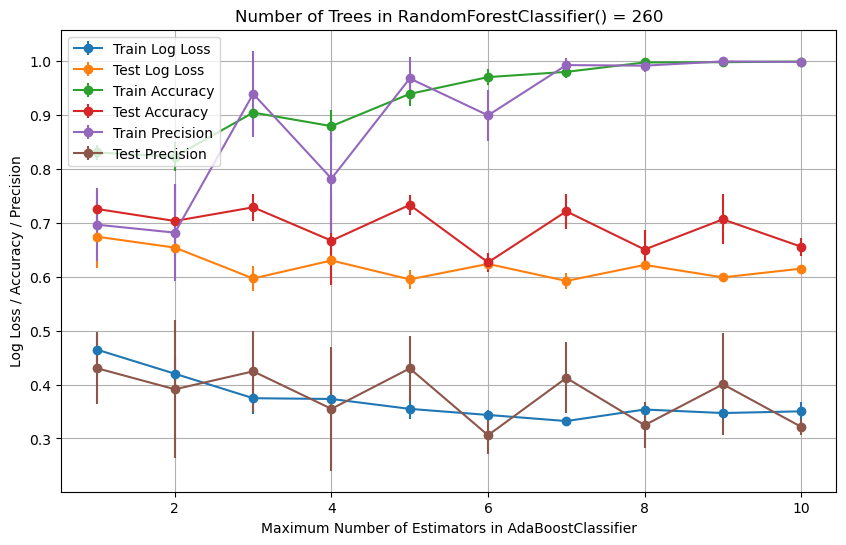

Avg Train Accuracy:
 [0.83092269 0.82319202 0.90498753 0.8798005  0.93965087 0.97082294
 0.98054863 0.99800499 0.99850374 0.99975062]
Avg Test Accuracy:
 [0.7261194  0.70373134 0.72910448 0.66716418 0.73358209 0.62686567
 0.72164179 0.65074627 0.70671642 0.65597015]
Avg Train Precision:
 [0.69692683 0.6820813  0.93971701 0.78243784 0.96834558 0.89981698
 0.99313725 0.99206847 1.         0.9989899 ]
Avg Test Precision:
 [0.43058038 0.391278   0.42461046 0.35496797 0.43002828 0.30598639
 0.412393   0.32467877 0.40059584 0.32157556]
Avg Train Log Loss:
 [0.46508262 0.42011709 0.37470697 0.37329022 0.35491023 0.34363467
 0.33228724 0.35372983 0.34716288 0.35038067]
Avg Test Log Loss:
 [0.67468921 0.65425981 0.59697715 0.63040366 0.59533663 0.62401321
 0.59242009 0.6221295  0.59905337 0.61525679]


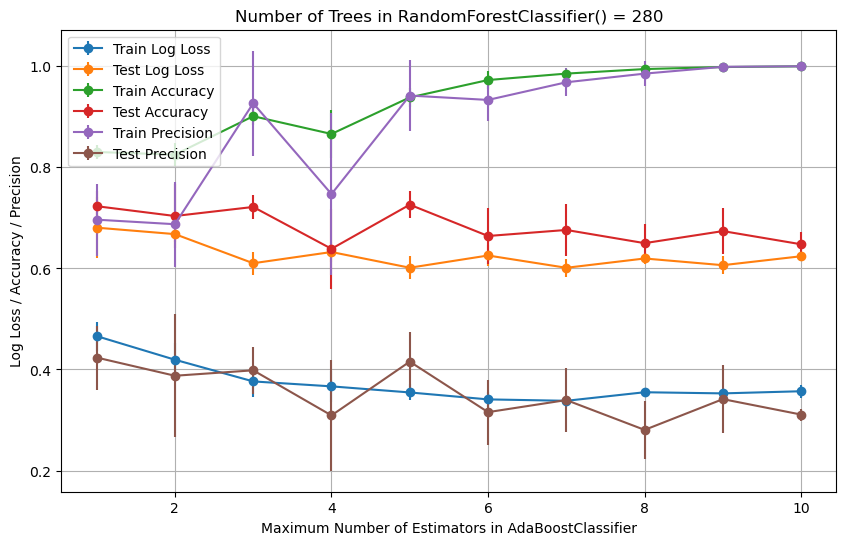

Avg Train Accuracy:
 [0.83042394 0.82518703 0.90124688 0.86608479 0.93840399 0.97281796
 0.98553616 0.99451372 0.99850374 1.        ]
Avg Test Accuracy:
 [0.72313433 0.70373134 0.72164179 0.63880597 0.7261194  0.6641791
 0.6761194  0.65       0.6738806  0.64776119]
Avg Train Precision:
 [0.69648769 0.68748473 0.92681033 0.74712664 0.94207113 0.93344303
 0.96838234 0.9854798  0.9989899  1.        ]
Avg Test Precision:
 [0.42361747 0.38760083 0.39834821 0.30908394 0.41554803 0.31558793
 0.33949176 0.2804527  0.34133113 0.31075863]
Avg Train Log Loss:
 [0.46608013 0.41931764 0.37638895 0.3666023  0.3545608  0.34080748
 0.33803516 0.35496982 0.35270845 0.35694561]
Avg Test Log Loss:
 [0.68065935 0.66789729 0.61025479 0.63246595 0.60136757 0.62557949
 0.60126108 0.61964989 0.60639814 0.62410388]


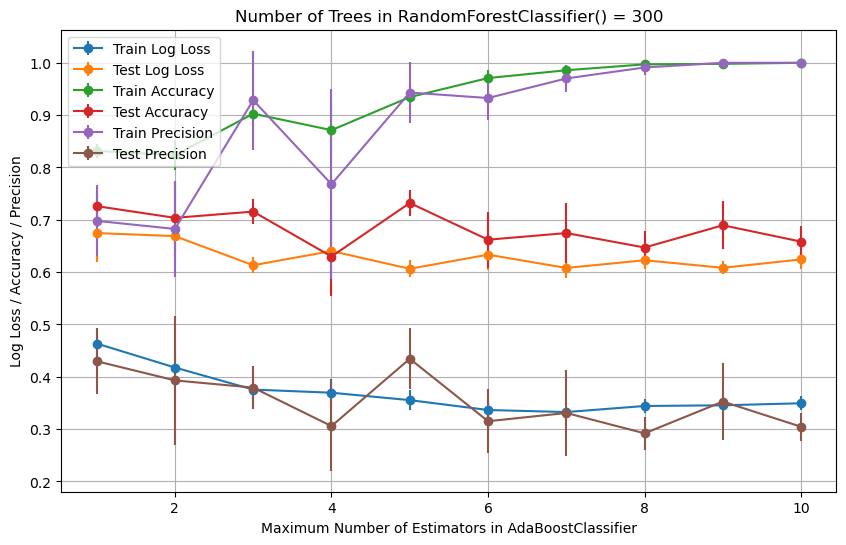

Avg Train Accuracy:
 [0.83167082 0.8234414  0.90274314 0.8713217  0.93441397 0.97082294
 0.98578554 0.99700748 0.99800499 1.        ]
Avg Test Accuracy:
 [0.7261194  0.70373134 0.71567164 0.62985075 0.73208955 0.6619403
 0.67462687 0.64701493 0.68955224 0.65820896]
Avg Train Precision:
 [0.69797504 0.68250866 0.92854065 0.76806451 0.94315304 0.93269123
 0.97007974 0.99105926 1.         1.        ]
Avg Test Precision:
 [0.42976829 0.39310162 0.37932652 0.30577635 0.43440607 0.31510087
 0.3308518  0.29193764 0.35265329 0.30451191]
Avg Train Log Loss:
 [0.46358637 0.41771902 0.37555367 0.36956935 0.35540062 0.33652518
 0.33261461 0.34422067 0.34550935 0.34942803]
Avg Test Log Loss:
 [0.67468921 0.66878668 0.61314002 0.64027735 0.60639152 0.63336568
 0.60796451 0.62268358 0.60825469 0.62434233]


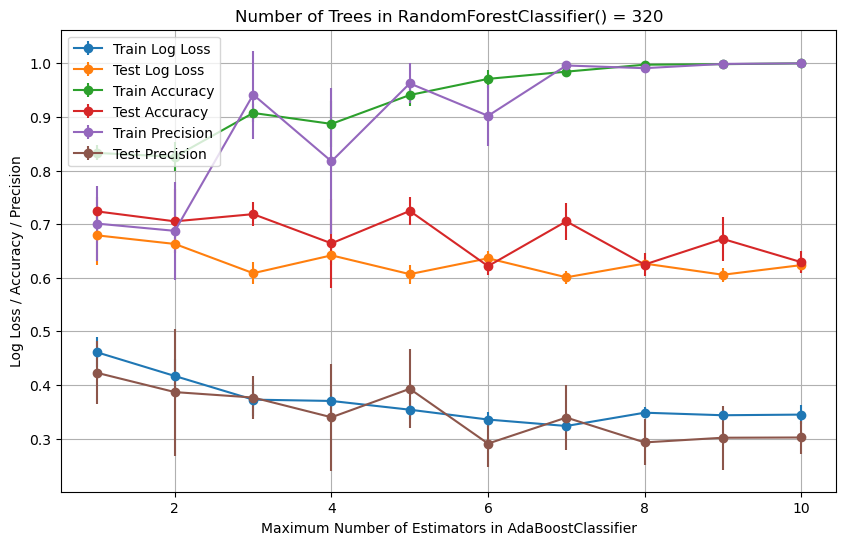

Avg Train Accuracy:
 [0.83291771 0.82568579 0.9074813  0.88703242 0.94089776 0.97107232
 0.98453865 0.99750623 0.99850374 1.        ]
Avg Test Accuracy:
 [0.7238806  0.70522388 0.71865672 0.6641791  0.72462687 0.62164179
 0.70522388 0.62462687 0.67238806 0.62910448]
Avg Train Precision:
 [0.70106483 0.68747404 0.94166876 0.81719414 0.96260411 0.90210231
 0.9960199  0.99102433 0.9989899  1.        ]
Avg Test Precision:
 [0.42273845 0.38658461 0.37645244 0.33960704 0.39269879 0.2905026
 0.33911201 0.29271647 0.30145008 0.30188868]
Avg Train Log Loss:
 [0.4610926  0.41659037 0.37250832 0.37006992 0.35374596 0.3353726
 0.32334139 0.34814527 0.34340827 0.34459664]
Avg Test Log Loss:
 [0.67916682 0.66300922 0.60845133 0.64177564 0.60668874 0.63625177
 0.60077114 0.62639314 0.60556802 0.6235307 ]


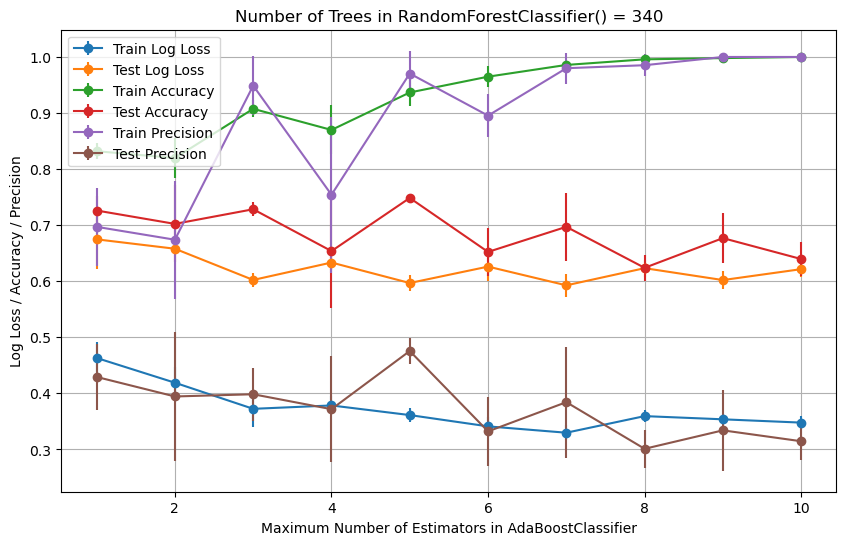

Avg Train Accuracy:
 [0.8319202  0.81970075 0.9074813  0.86982544 0.93665835 0.96483791
 0.98578554 0.9957606  0.99800499 1.        ]
Avg Test Accuracy:
 [0.7261194  0.70223881 0.72835821 0.65373134 0.74850746 0.65223881
 0.69701493 0.6238806  0.67686567 0.63955224]
Avg Train Precision:
 [0.69700406 0.67399638 0.94883564 0.75422077 0.97046595 0.89535428
 0.97993773 0.98529341 1.         1.        ]
Avg Test Precision:
 [0.42923629 0.39441349 0.39837137 0.37172569 0.4755     0.33213396
 0.38425665 0.30106186 0.33397546 0.31455322]
Avg Train Log Loss:
 [0.46308761 0.41892617 0.37235487 0.37838185 0.36121805 0.34107196
 0.32974547 0.35935934 0.35365743 0.34777714]
Avg Test Log Loss:
 [0.67468921 0.65793624 0.60223188 0.63331782 0.59676277 0.62605392
 0.59263762 0.62326694 0.60203603 0.62149496]


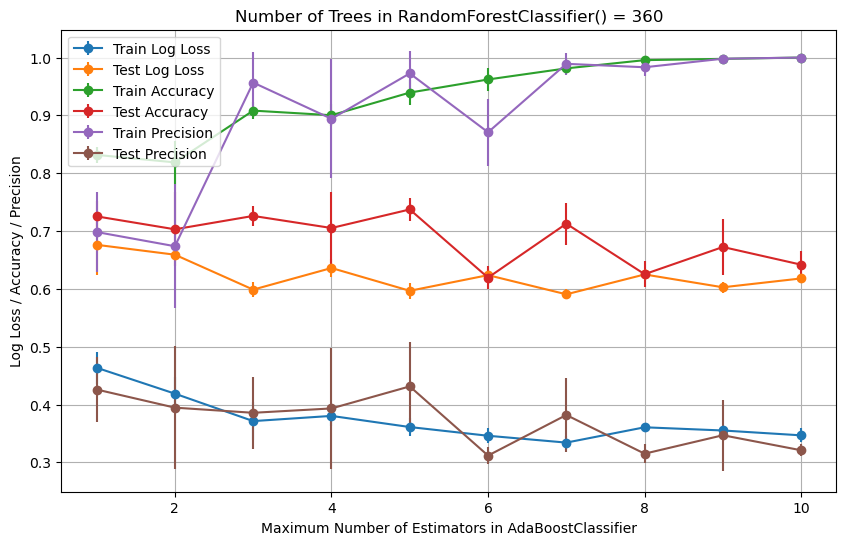

Avg Train Accuracy:
 [0.83167082 0.81870324 0.90822943 0.90024938 0.9394015  0.96209476
 0.98129676 0.99551122 0.99775561 1.        ]
Avg Test Accuracy:
 [0.72537313 0.70298507 0.7261194  0.70522388 0.73731343 0.61940299
 0.71268657 0.62537313 0.67238806 0.64179104]
Avg Train Precision:
 [0.69827951 0.67371678 0.95674198 0.89408014 0.97257494 0.87078433
 0.98915473 0.98322538 0.99798995 1.        ]
Avg Test Precision:
 [0.42594328 0.39455513 0.38567901 0.39321664 0.43131573 0.31169672
 0.3818576  0.31496099 0.34685161 0.32085201]
Avg Train Log Loss:
 [0.46358637 0.418761   0.37131422 0.38030122 0.36103952 0.34595968
 0.33411733 0.36060788 0.3550718  0.34667919]
Avg Test Log Loss:
 [0.67618174 0.65906495 0.59866847 0.63605763 0.59663673 0.62371512
 0.5905556  0.62490292 0.60271787 0.61800973]


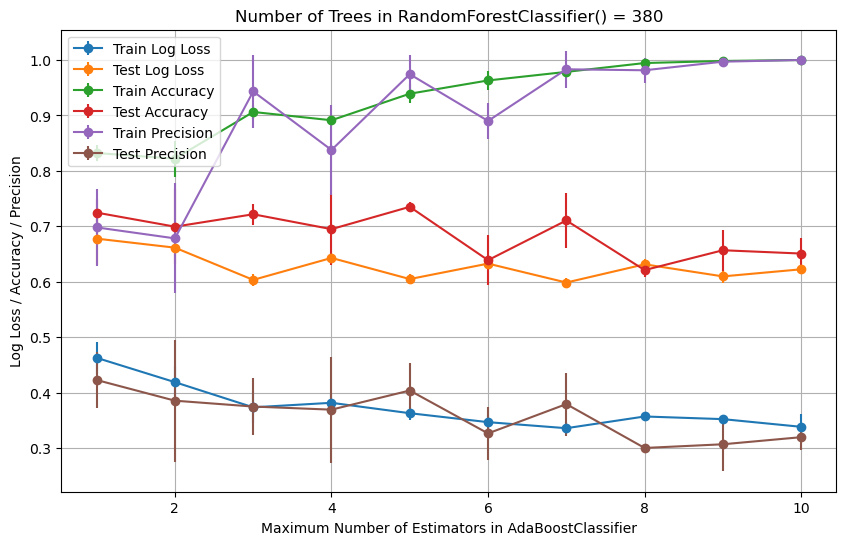

Avg Train Accuracy:
 [0.83216958 0.82194514 0.90623441 0.89127182 0.93915212 0.96309227
 0.97855362 0.99451372 0.99825436 1.        ]
Avg Test Accuracy:
 [0.72462687 0.69925373 0.72164179 0.69477612 0.73507463 0.63880597
 0.71044776 0.62089552 0.65671642 0.65074627]
Avg Train Precision:
 [0.69792227 0.67812721 0.94328473 0.83761576 0.97437138 0.89001649
 0.98325581 0.98147472 0.99697985 1.        ]
Avg Test Precision:
 [0.42257822 0.38525765 0.37466242 0.36905523 0.40361039 0.32621675
 0.37911198 0.29995303 0.30660173 0.31939594]
Avg Train Log Loss:
 [0.46258886 0.41868345 0.37329113 0.3814278  0.36266355 0.34650493
 0.3356152  0.35674334 0.35197012 0.33809494]
Avg Test Log Loss:
 [0.67767428 0.66138758 0.60322532 0.64284106 0.60472993 0.63259173
 0.59844918 0.63130969 0.60952998 0.62232416]


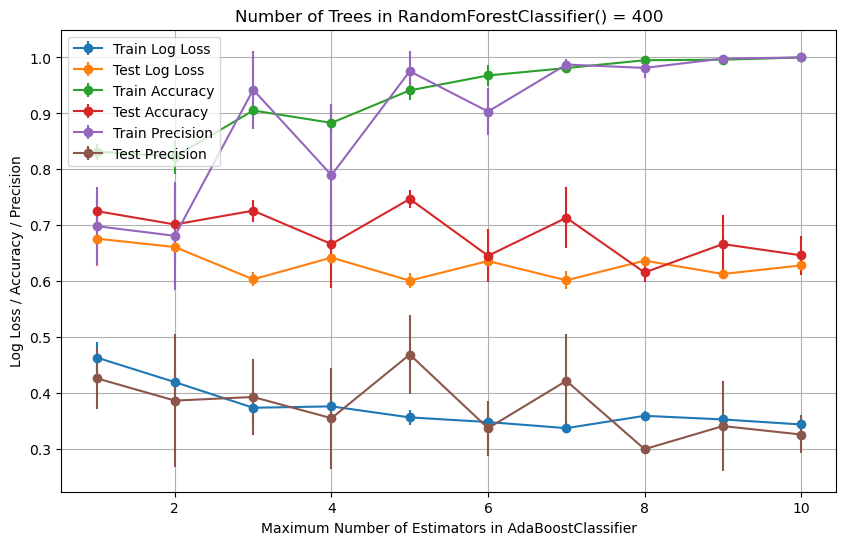

Avg Train Accuracy:
 [0.83167082 0.82269327 0.90523691 0.88304239 0.94114713 0.96783042
 0.98104738 0.99501247 0.99600998 1.        ]
Avg Test Accuracy:
 [0.72537313 0.70149254 0.7261194  0.66641791 0.74701493 0.64552239
 0.71343284 0.61567164 0.66641791 0.64626866]
Avg Train Precision:
 [0.69847296 0.68113704 0.94224886 0.78969753 0.97533705 0.90334519
 0.98730713 0.98133067 0.99797467 1.        ]
Avg Test Precision:
 [0.42649806 0.38661667 0.39305728 0.35513046 0.46896552 0.33726777
 0.42193182 0.29981035 0.34110815 0.32598312]
Avg Train Log Loss:
 [0.46358637 0.41963249 0.3738295  0.37629268 0.35660346 0.34827267
 0.33736106 0.3594302  0.35292768 0.34395967]
Avg Test Log Loss:
 [0.67618174 0.66111771 0.60340633 0.64224121 0.60108677 0.63611099
 0.6016618  0.63683026 0.61295687 0.62831166]


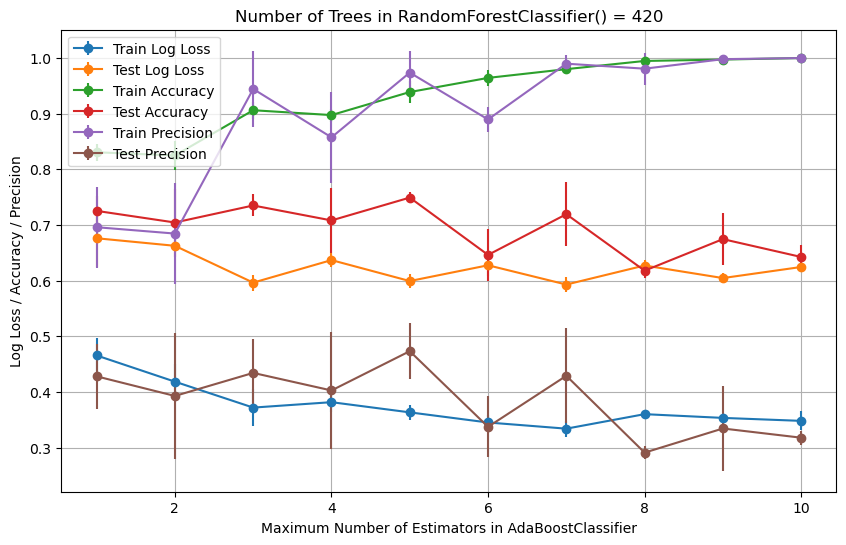

Avg Train Accuracy:
 [0.83067332 0.82493766 0.90623441 0.89750623 0.93890274 0.96433915
 0.98004988 0.99476309 0.99725686 1.        ]
Avg Test Accuracy:
 [0.72537313 0.70447761 0.73507463 0.70820896 0.74925373 0.64626866
 0.71940299 0.61791045 0.67462687 0.64253731]
Avg Train Precision:
 [0.69601916 0.68459642 0.94442144 0.8574693  0.97382105 0.88966094
 0.98985594 0.98089556 0.99795363 1.        ]
Avg Test Precision:
 [0.42806856 0.39279762 0.43423188 0.40267415 0.47326908 0.33729514
 0.42905452 0.29098184 0.33434727 0.31780891]
Avg Train Log Loss:
 [0.46558138 0.418479   0.37190195 0.38163658 0.36333316 0.34511588
 0.33403338 0.36011046 0.35337495 0.34803658]
Avg Test Log Loss:
 [0.67618174 0.66261023 0.59644562 0.63693704 0.59928844 0.62763178
 0.59297815 0.62722368 0.60463878 0.62455829]


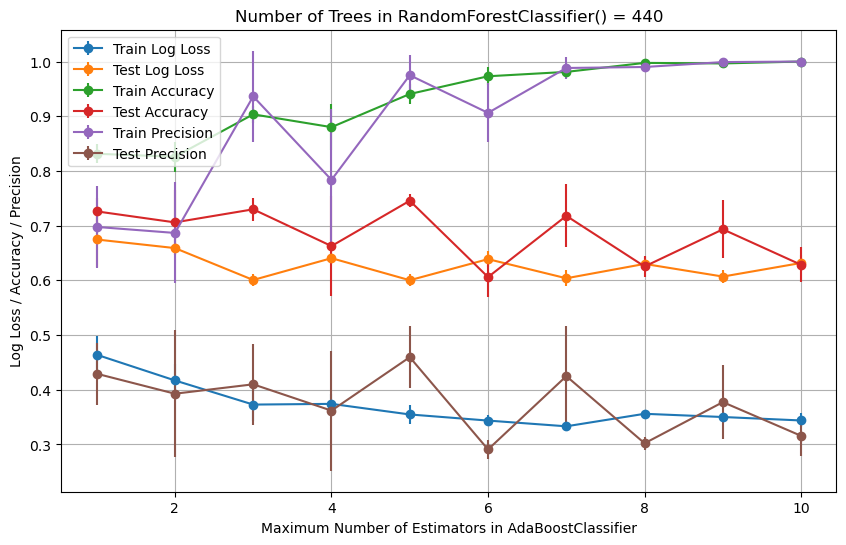

Avg Train Accuracy:
 [0.83142145 0.82593516 0.90349127 0.88004988 0.94064838 0.97306733
 0.98104738 0.99750623 0.99650873 1.        ]
Avg Test Accuracy:
 [0.7261194  0.70597015 0.72985075 0.66268657 0.74552239 0.60597015
 0.71791045 0.62537313 0.69328358 0.62835821]
Avg Train Precision:
 [0.69765997 0.68666555 0.93629851 0.78367474 0.97499891 0.9061517
 0.98821591 0.9900193  0.99897959 1.        ]
Avg Test Precision:
 [0.42936726 0.39277436 0.40996372 0.36185772 0.45957541 0.29085591
 0.42492495 0.30212371 0.37740996 0.31571158]
Avg Train Log Loss:
 [0.46408512 0.41704532 0.37290782 0.37421468 0.35484694 0.34366913
 0.33318875 0.35607172 0.35018685 0.34386146]
Avg Test Log Loss:
 [0.67468921 0.65898488 0.60066873 0.64053573 0.60022281 0.63878243
 0.60379367 0.6300348  0.60691146 0.63179516]


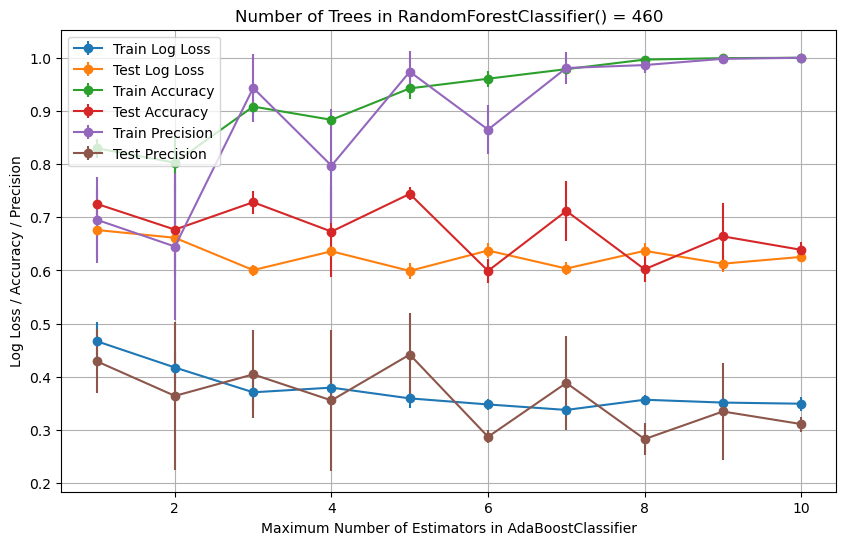

Avg Train Accuracy:
 [0.82992519 0.80274314 0.90822943 0.88329177 0.94239401 0.9605985
 0.97855362 0.99650873 0.99925187 1.        ]
Avg Test Accuracy:
 [0.72537313 0.67686567 0.72835821 0.67313433 0.74402985 0.59925373
 0.7119403  0.60223881 0.6641791  0.63880597]
Avg Train Precision:
 [0.69548638 0.64496927 0.94321662 0.79701864 0.97375837 0.86486496
 0.98075117 0.98624193 0.9979798  1.        ]
Avg Test Precision:
 [0.42935731 0.36418368 0.40461111 0.35568817 0.4418992  0.28723948
 0.38854581 0.28296668 0.33483955 0.31120851]
Avg Train Log Loss:
 [0.46707764 0.4175393  0.37092568 0.37973214 0.35950116 0.3480857
 0.33776709 0.3569522  0.35161305 0.34947247]
Avg Test Log Loss:
 [0.67618174 0.66146585 0.60071326 0.6361018  0.59924853 0.63753845
 0.60366154 0.63688853 0.61277403 0.62552266]


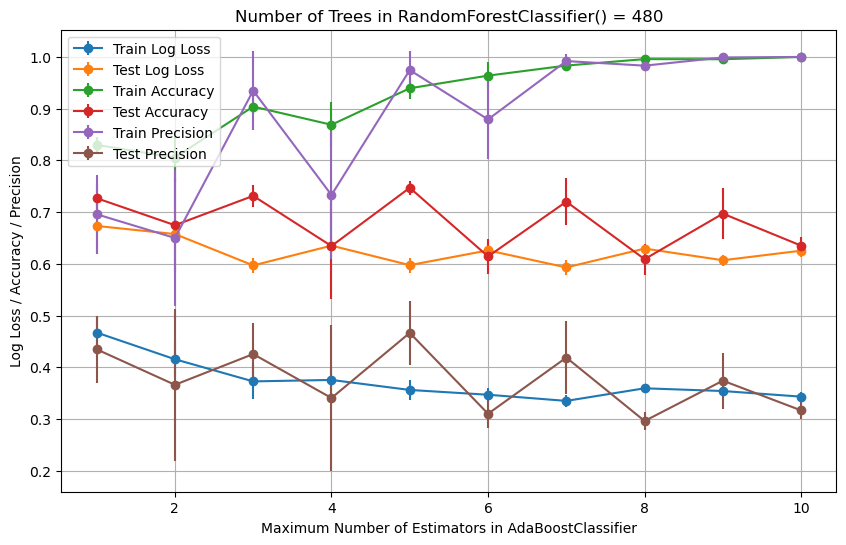

Avg Train Accuracy:
 [0.82992519 0.80548628 0.90399002 0.86882793 0.9394015  0.9638404
 0.98329177 0.9957606  0.99551122 1.        ]
Avg Test Accuracy:
 [0.72686567 0.67462687 0.73134328 0.63432836 0.74701493 0.6141791
 0.72014925 0.60895522 0.69701493 0.63507463]
Avg Train Precision:
 [0.69582887 0.64992261 0.93484038 0.73302765 0.97456905 0.87917502
 0.99200731 0.98309876 0.9989899  1.        ]
Avg Test Precision:
 [0.43468722 0.36602173 0.4254708  0.3405102  0.46646697 0.31002099
 0.41869101 0.29605847 0.37403319 0.31649781]
Avg Train Log Loss:
 [0.46707764 0.41545547 0.37263417 0.37544601 0.35607409 0.34682933
 0.33492941 0.3592998  0.35399645 0.34314947]
Avg Test Log Loss:
 [0.67319667 0.65753123 0.59688071 0.63513533 0.5974084  0.62595872
 0.59298198 0.62944412 0.6068537  0.62537837]


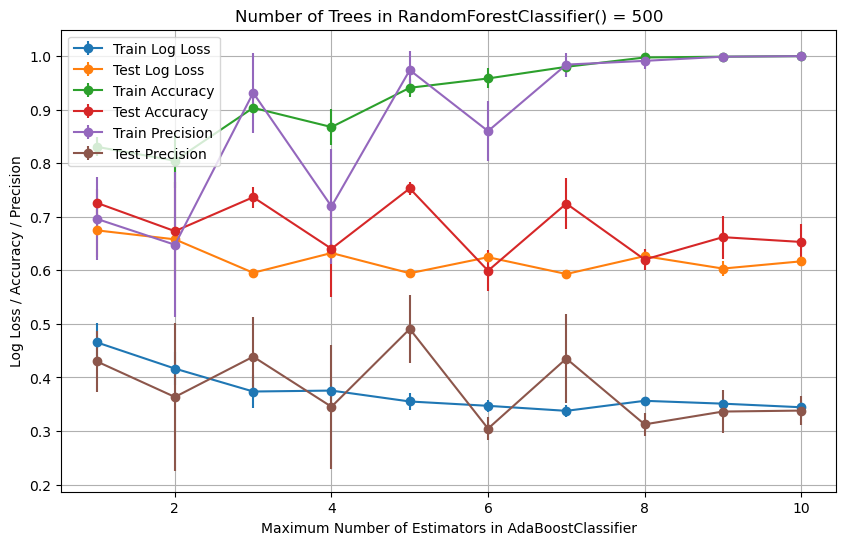

Avg Train Accuracy:
 [0.83067332 0.80473815 0.90349127 0.86758105 0.94089776 0.95835411
 0.98004988 0.99750623 0.99900249 1.        ]
Avg Test Accuracy:
 [0.7261194  0.67313433 0.73656716 0.64029851 0.75298507 0.59925373
 0.72462687 0.62014925 0.6619403  0.65298507]
Avg Train Precision:
 [0.69620946 0.64774194 0.93151076 0.71935487 0.97392829 0.86001806
 0.98421567 0.99118502 0.9989899  1.        ]
Avg Test Precision:
 [0.43003342 0.36345998 0.43874203 0.34520513 0.49054204 0.30440614
 0.4351928  0.31231205 0.33625124 0.33804572]
Avg Train Log Loss:
 [0.46558138 0.41647921 0.37367311 0.37540843 0.3550595  0.34694801
 0.33757208 0.35631155 0.35098444 0.34429125]
Avg Test Log Loss:
 [0.67468921 0.65785394 0.59542519 0.632361   0.59454195 0.62453078
 0.59313099 0.62652429 0.60329457 0.6167934 ]


In [196]:
for n_trees in range(220, 510, 20):
    n_estimators_range = list(range(1, 11))

    classifier_params = {
        'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in RandomForestClassifier() = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

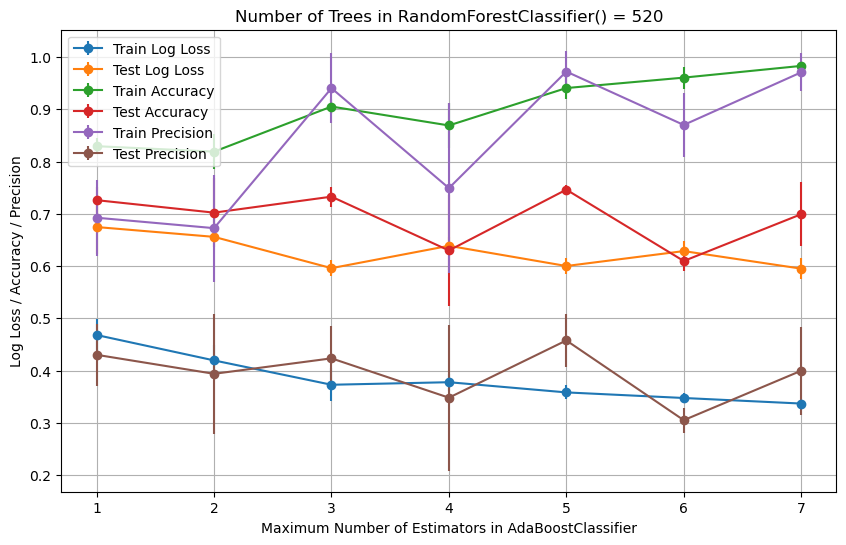

Avg Train Accuracy:
 [0.82942643 0.81895262 0.90523691 0.86907731 0.94064838 0.9605985
 0.98304239]
Avg Test Accuracy:
 [0.7261194  0.70223881 0.73283582 0.62985075 0.74626866 0.60970149
 0.69925373]
Avg Train Precision:
 [0.69253335 0.67257614 0.94041696 0.74917119 0.97216513 0.87001103
 0.97073545]
Avg Test Precision:
 [0.43021496 0.39386408 0.42344949 0.3481577  0.45771475 0.30513282
 0.39974399]
Avg Train Log Loss:
 [0.46807514 0.41949724 0.37291137 0.37778746 0.35828535 0.34759182
 0.33695302]
Avg Test Log Loss:
 [0.67468921 0.65591137 0.59601586 0.63876271 0.60013265 0.62866936
 0.59509123]


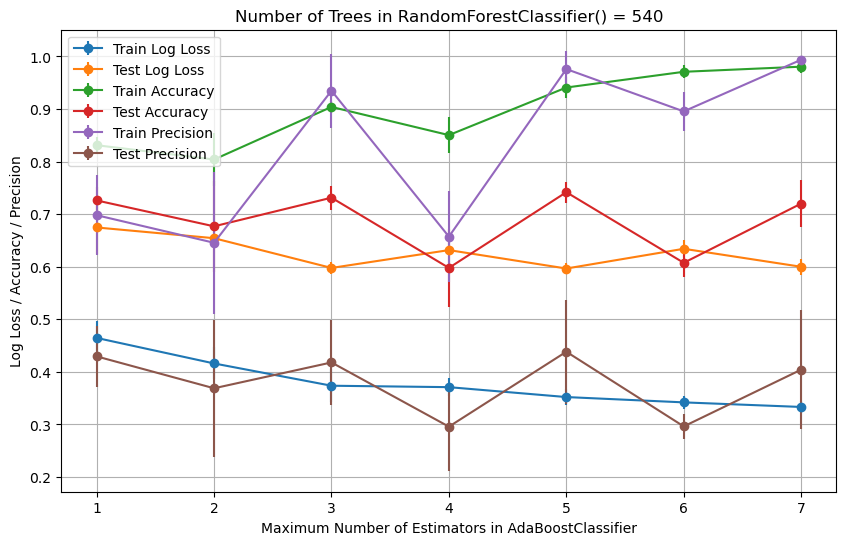

Avg Train Accuracy:
 [0.83117207 0.80399002 0.90399002 0.85037406 0.94089776 0.97082294
 0.98054863]
Avg Test Accuracy:
 [0.7261194  0.67686567 0.73134328 0.59776119 0.74179104 0.60746269
 0.72014925]
Avg Train Precision:
 [0.69803367 0.64558442 0.93480882 0.65726158 0.97597532 0.89547715
 0.99378352]
Avg Test Precision:
 [0.42946938 0.36880105 0.41795519 0.29577835 0.43830688 0.29626868
 0.4042328 ]
Avg Train Log Loss:
 [0.46458387 0.4160288  0.37365304 0.37093575 0.3521009  0.34198058
 0.33326211]
Avg Test Log Loss:
 [0.67468921 0.65428149 0.59771462 0.63163452 0.59660146 0.63413826
 0.5999218 ]


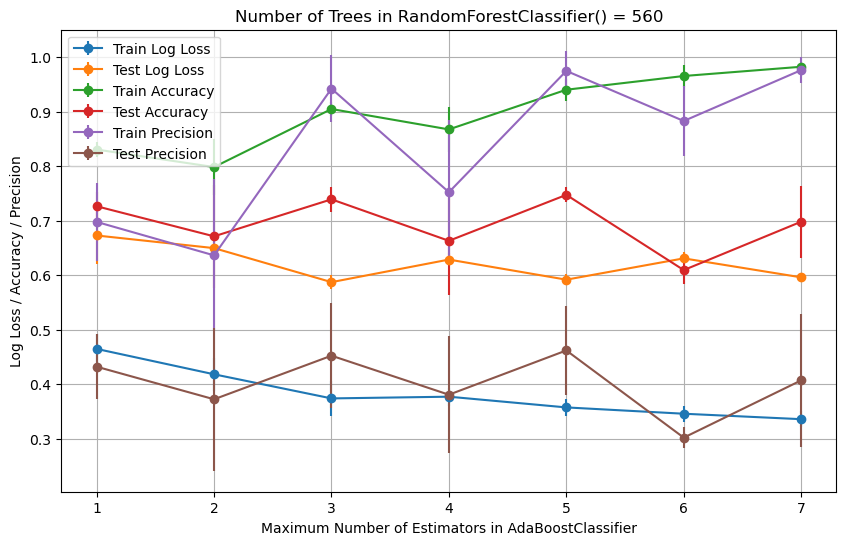

Avg Train Accuracy:
 [0.83092269 0.79875312 0.90523691 0.86783042 0.94064838 0.96583541
 0.98279302]
Avg Test Accuracy:
 [0.72686567 0.67164179 0.73955224 0.66343284 0.74776119 0.60970149
 0.69850746]
Avg Train Precision:
 [0.69812644 0.63671778 0.94265269 0.75263114 0.97517743 0.88328179
 0.97662925]
Avg Test Precision:
 [0.43241008 0.37264296 0.45264214 0.38103627 0.46226601 0.302264
 0.40736111]
Avg Train Log Loss:
 [0.46508262 0.41849962 0.37423822 0.37739854 0.35772631 0.34614515
 0.33613555]
Avg Test Log Loss:
 [0.67319667 0.65002317 0.58759632 0.62901225 0.59212874 0.63123118
 0.59640869]


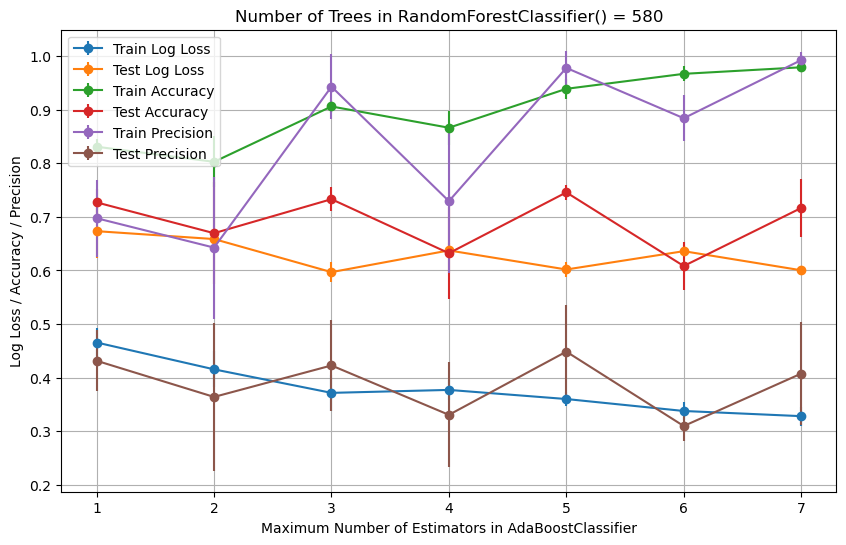

Avg Train Accuracy:
 [0.83067332 0.80249377 0.90573566 0.86608479 0.93865337 0.96658354
 0.97880299]
Avg Test Accuracy:
 [0.72686567 0.66940299 0.73283582 0.63208955 0.74552239 0.60820896
 0.71641791]
Avg Train Precision:
 [0.69734017 0.6425209  0.94265211 0.72919684 0.97761838 0.88379239
 0.99219512]
Avg Test Precision:
 [0.43151366 0.36406321 0.42275926 0.3306894  0.44855991 0.30981785
 0.40757359]
Avg Train Log Loss:
 [0.46558138 0.41551497 0.3716563  0.37717072 0.36016721 0.33787946
 0.32823426]
Avg Test Log Loss:
 [0.67319667 0.65849838 0.59681015 0.63727441 0.60172219 0.63587738
 0.60026669]


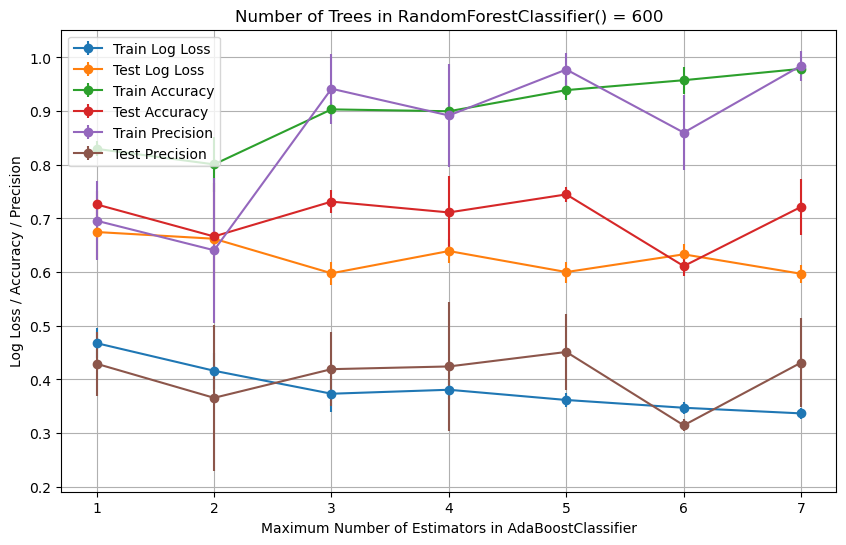

Avg Train Accuracy:
 [0.82967581 0.80074813 0.9032419  0.89975062 0.93915212 0.95760599
 0.97880299]
Avg Test Accuracy:
 [0.7261194  0.66641791 0.73134328 0.71119403 0.74477612 0.61119403
 0.72164179]
Avg Train Precision:
 [0.69572842 0.64073045 0.94171883 0.89186236 0.97751086 0.85994337
 0.98472546]
Avg Test Precision:
 [0.42915676 0.36566945 0.41911227 0.42415362 0.45116004 0.31446826
 0.43141396]
Avg Train Log Loss:
 [0.46757639 0.41615656 0.37332507 0.38072617 0.36166952 0.34719459
 0.33666787]
Avg Test Log Loss:
 [0.67468921 0.66216591 0.59780172 0.63925329 0.60009275 0.63309233
 0.59684904]


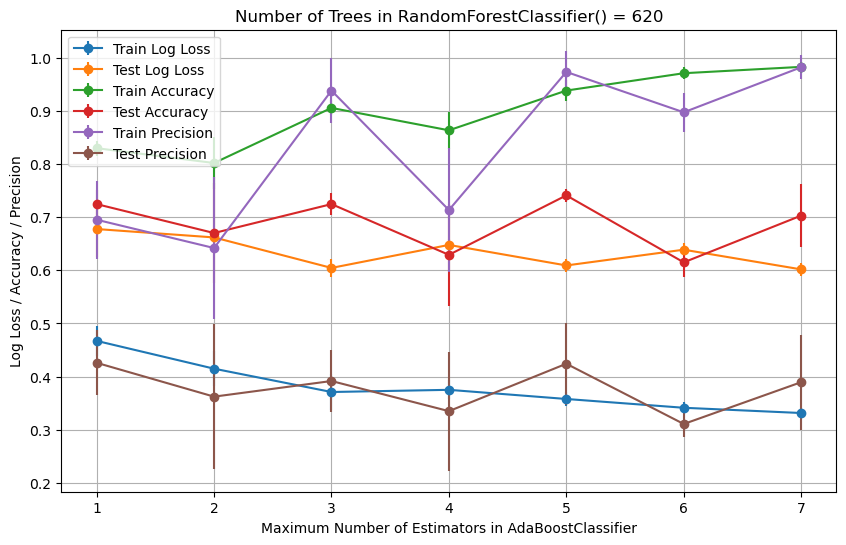

Avg Train Accuracy:
 [0.82992519 0.80199501 0.90573566 0.86359102 0.93840399 0.97107232
 0.98304239]
Avg Test Accuracy:
 [0.72462687 0.67014925 0.72462687 0.62910448 0.74104478 0.61492537
 0.70298507]
Avg Train Precision:
 [0.69521035 0.64188826 0.9383829  0.71346054 0.97351159 0.89748416
 0.98231602]
Avg Test Precision:
 [0.42579575 0.3620592  0.39149932 0.3347671  0.4240199  0.31057901
 0.3893012 ]
Avg Train Log Loss:
 [0.46707764 0.4147174  0.37080357 0.37491035 0.35766802 0.34112321
 0.33124224]
Avg Test Log Loss:
 [0.67767428 0.66187656 0.60446625 0.64775682 0.60910843 0.63878139
 0.60168767]


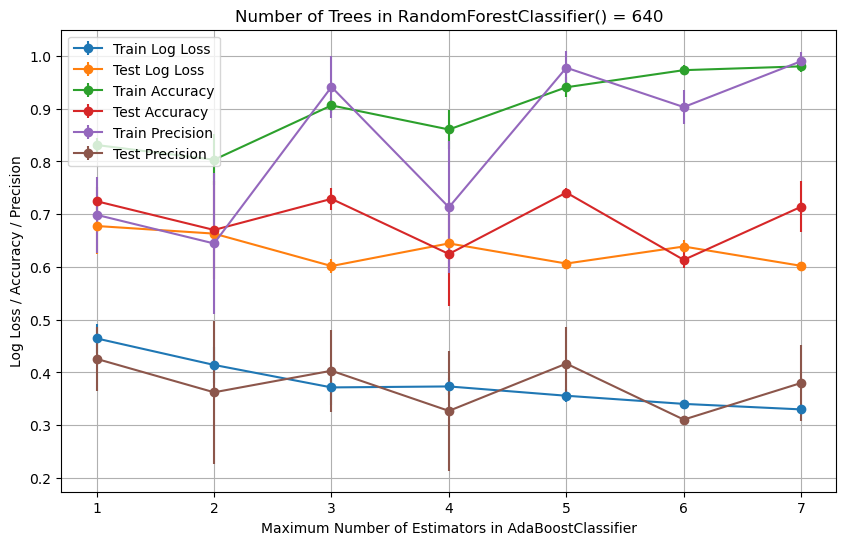

Avg Train Accuracy:
 [0.83117207 0.8032419  0.90623441 0.8605985  0.94064838 0.97306733
 0.98029925]
Avg Test Accuracy:
 [0.72462687 0.67014925 0.72910448 0.62462687 0.74104478 0.61343284
 0.7141791 ]
Avg Train Precision:
 [0.69883292 0.64454583 0.94127887 0.71314835 0.97768409 0.90310196
 0.9900787 ]
Avg Test Precision:
 [0.42579575 0.36243358 0.40332048 0.32720613 0.41682937 0.3106966
 0.3801542 ]
Avg Train Log Loss:
 [0.46458387 0.41432275 0.37170177 0.37353983 0.35590176 0.34047356
 0.33001241]
Avg Test Log Loss:
 [0.67767428 0.66323873 0.60177164 0.64465091 0.60650434 0.63877716
 0.60215356]


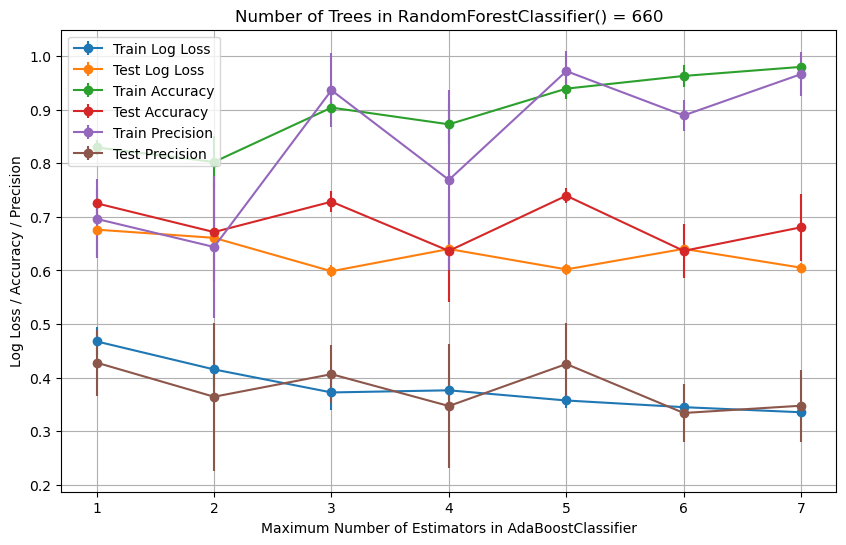

Avg Train Accuracy:
 [0.82967581 0.80249377 0.90399002 0.87281796 0.9394015  0.96309227
 0.98004988]
Avg Test Accuracy:
 [0.72537313 0.67164179 0.72835821 0.63656716 0.73955224 0.63656716
 0.68059701]
Avg Train Precision:
 [0.69625794 0.64380625 0.93641339 0.76908401 0.9720898  0.88939522
 0.96651956]
Avg Test Precision:
 [0.42788634 0.36423731 0.40636735 0.34693435 0.4253702  0.33393285
 0.34752001]
Avg Train Log Loss:
 [0.46757639 0.41525088 0.37229657 0.37626818 0.35726835 0.34479637
 0.33527906]
Avg Test Log Loss:
 [0.67618174 0.66088075 0.59854765 0.64003133 0.60202    0.64029558
 0.60516135]


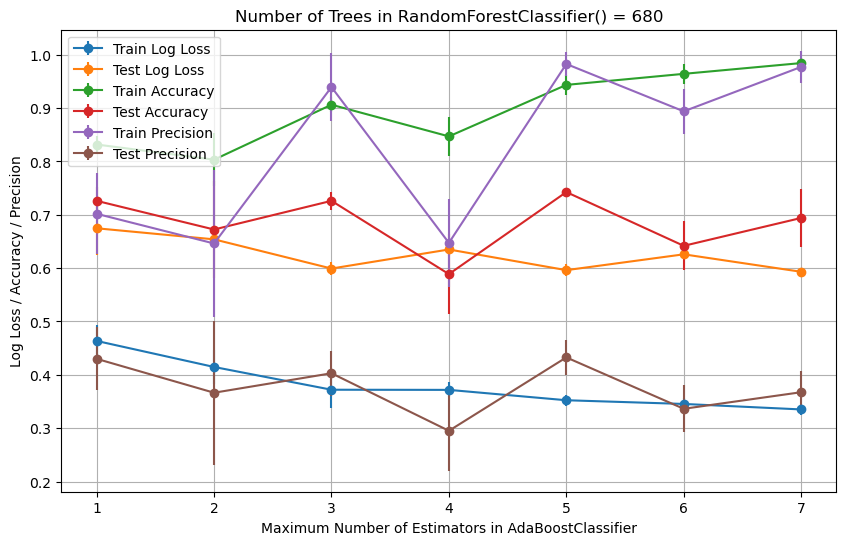

Avg Train Accuracy:
 [0.83167082 0.8032419  0.90623441 0.84688279 0.94339152 0.96408978
 0.98428928]
Avg Test Accuracy:
 [0.7261194  0.67238806 0.7261194  0.58880597 0.74253731 0.64179104
 0.69402985]
Avg Train Precision:
 [0.70183123 0.64617313 0.93928116 0.64731826 0.98255629 0.89381197
 0.97710078]
Avg Test Precision:
 [0.43004882 0.36650437 0.40300064 0.29517293 0.43271283 0.33640022
 0.36748314]
Avg Train Log Loss:
 [0.46358637 0.41477763 0.37213508 0.37184549 0.35243612 0.3454979
 0.33520458]
Avg Test Log Loss:
 [0.67468921 0.65396286 0.59922061 0.6349501  0.59621764 0.62588226
 0.59314618]


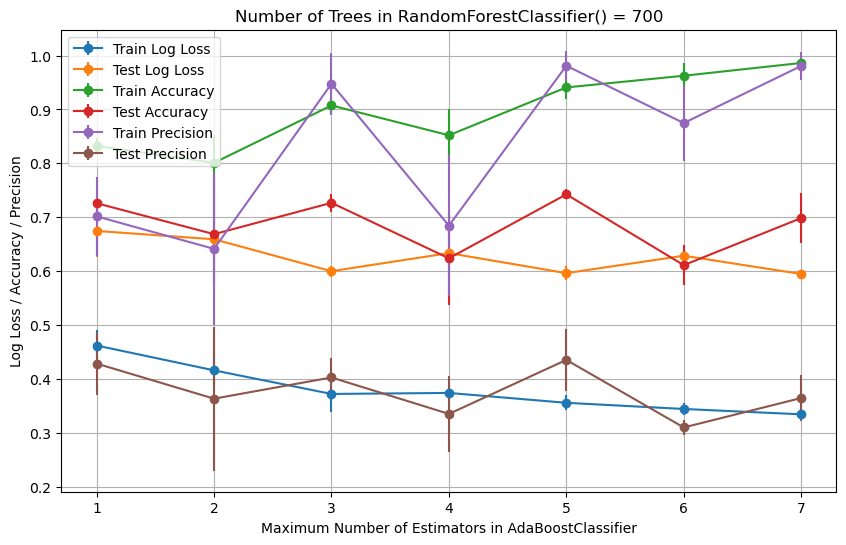

Avg Train Accuracy:
 [0.83241895 0.80099751 0.9074813  0.8521197  0.94089776 0.96259352
 0.98628429]
Avg Test Accuracy:
 [0.7261194  0.66865672 0.72686567 0.6238806  0.74253731 0.61119403
 0.69850746]
Avg Train Precision:
 [0.70174767 0.64137708 0.94773948 0.68444043 0.98110964 0.87482859
 0.9807563 ]
Avg Test Precision:
 [0.42857168 0.36347728 0.40283727 0.33521856 0.43537642 0.31007805
 0.36468223]
Avg Train Log Loss:
 [0.46209011 0.4160308  0.37226215 0.37410976 0.35582397 0.34437559
 0.33443947]
Avg Test Log Loss:
 [0.67468921 0.65917779 0.599989   0.63355694 0.59636546 0.62870803
 0.59474801]


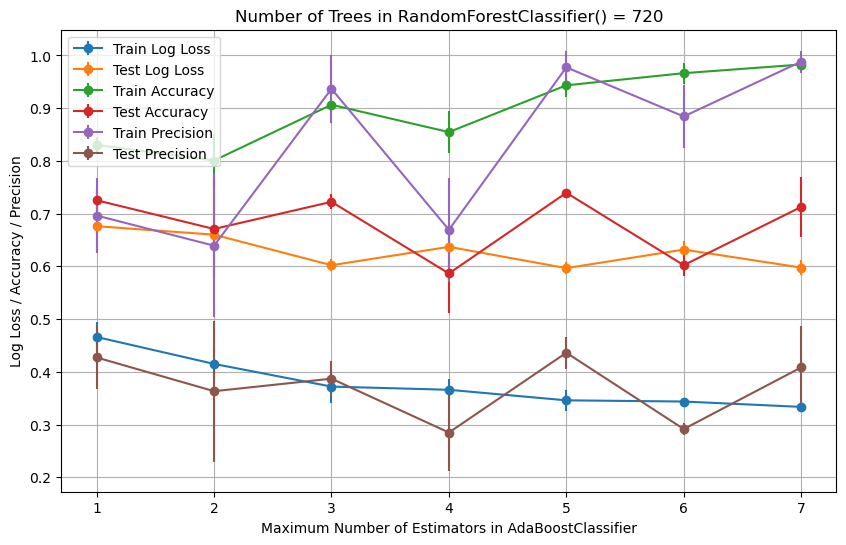

Avg Train Accuracy:
 [0.83042394 0.80074813 0.90648379 0.85461347 0.94339152 0.96633416
 0.98279302]
Avg Test Accuracy:
 [0.72537313 0.67089552 0.72238806 0.58656716 0.73955224 0.60223881
 0.71268657]
Avg Train Precision:
 [0.6963832  0.63920034 0.93663577 0.66932959 0.97740272 0.88427194
 0.98824661]
Avg Test Precision:
 [0.42724394 0.36327239 0.38702148 0.28489832 0.43619068 0.29148407
 0.40833687]
Avg Train Log Loss:
 [0.46608013 0.41499296 0.3720034  0.36595815 0.3459386  0.34367096
 0.3335061 ]
Avg Test Log Loss:
 [0.67618174 0.66008845 0.60218054 0.6370132  0.59666731 0.6318406
 0.59771518]


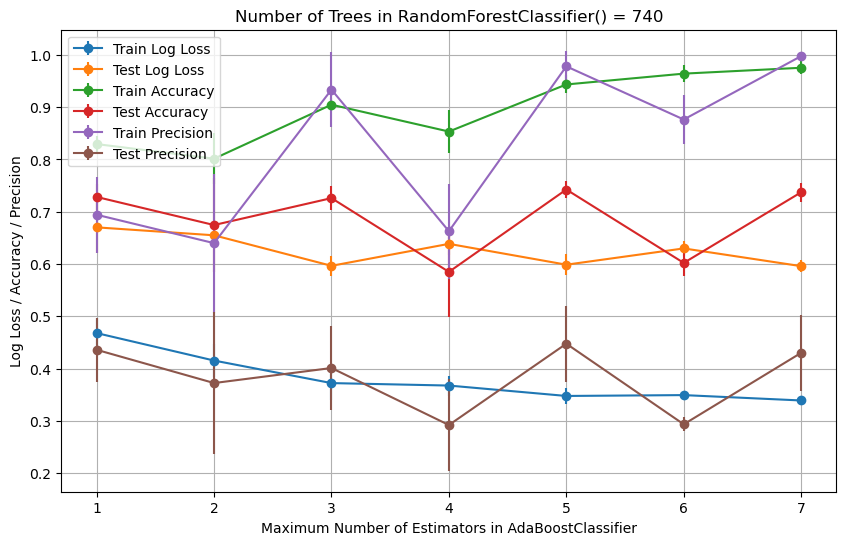

Avg Train Accuracy:
 [0.82942643 0.80149626 0.90473815 0.85336658 0.94339152 0.96408978
 0.97531172]
Avg Test Accuracy:
 [0.72835821 0.67462687 0.7261194  0.58507463 0.74253731 0.60223881
 0.73731343]
Avg Train Precision:
 [0.69431537 0.6400063  0.9335243  0.66284464 0.97800911 0.87638817
 0.99761141]
Avg Test Precision:
 [0.43611063 0.37255045 0.40130942 0.29229504 0.44775667 0.29367356
 0.43035322]
Avg Train Log Loss:
 [0.46807514 0.41556565 0.37247192 0.36776663 0.34787141 0.34950968
 0.33924064]
Avg Test Log Loss:
 [0.67021159 0.65502708 0.59666932 0.63867155 0.59881841 0.62994634
 0.59602754]


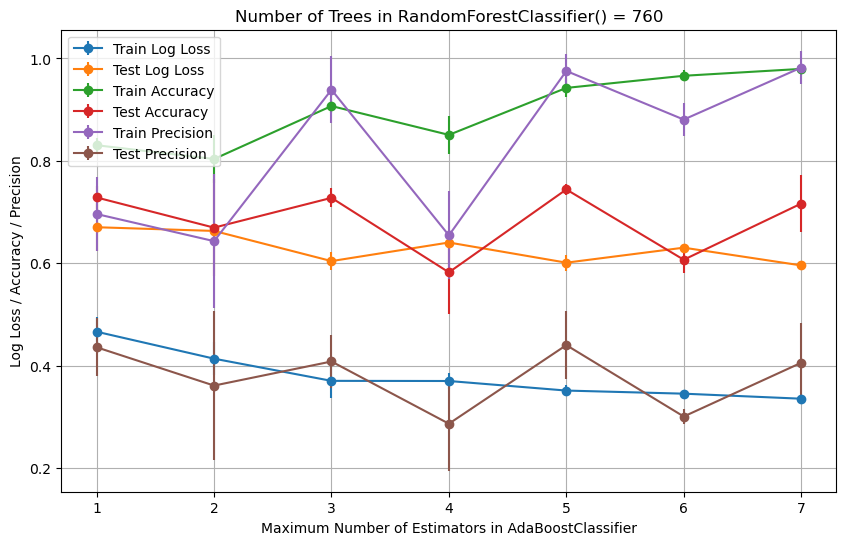

Avg Train Accuracy:
 [0.83042394 0.80349127 0.90698254 0.85062344 0.94239401 0.96608479
 0.97955112]
Avg Test Accuracy:
 [0.72835821 0.66940299 0.72761194 0.58208955 0.74402985 0.60671642
 0.71641791]
Avg Train Precision:
 [0.69598362 0.64302243 0.93880267 0.65436527 0.97545932 0.88054447
 0.98207238]
Avg Test Precision:
 [0.43565421 0.36084667 0.40792437 0.28633794 0.43988928 0.30042146
 0.40541148]
Avg Train Log Loss:
 [0.46608013 0.41342663 0.37007679 0.36979468 0.35111557 0.34503589
 0.33521291]
Avg Test Log Loss:
 [0.67021159 0.66299536 0.60404969 0.64037403 0.60097893 0.63028366
 0.59563188]


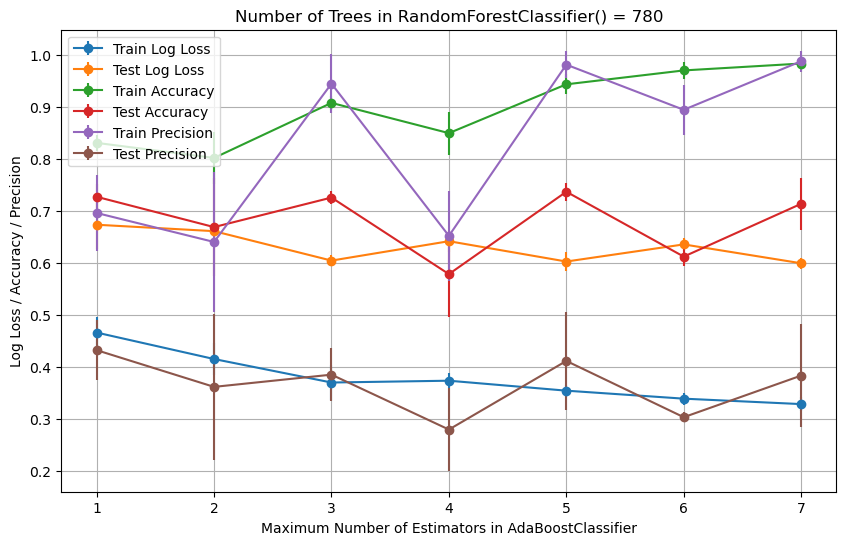

Avg Train Accuracy:
 [0.83042394 0.80149626 0.90723192 0.84912718 0.94289277 0.96957606
 0.98279302]
Avg Test Accuracy:
 [0.72686567 0.66865672 0.72537313 0.57835821 0.73656716 0.6119403
 0.71343284]
Avg Train Precision:
 [0.6957674  0.64006051 0.94417079 0.65181727 0.98065944 0.89393344
 0.98722521]
Avg Test Precision:
 [0.43226418 0.36175299 0.38522331 0.27977266 0.41156619 0.30349752
 0.38344861]
Avg Train Log Loss:
 [0.46608013 0.4152412  0.37011339 0.37359897 0.35446752 0.33911338
 0.32867099]
Avg Test Log Loss:
 [0.67319667 0.66086463 0.60431196 0.64155679 0.60250504 0.63540423
 0.59916496]


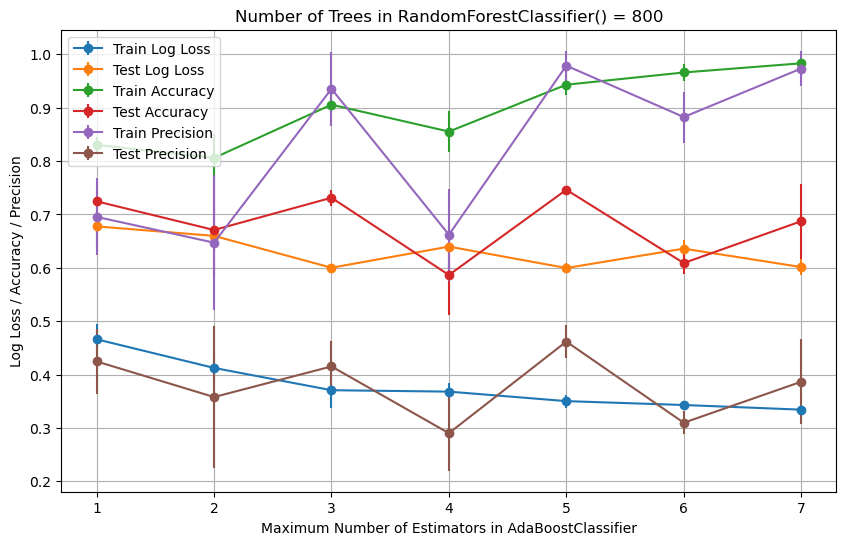

Avg Train Accuracy:
 [0.83042394 0.80598504 0.90573566 0.8553616  0.94314214 0.96608479
 0.98329177]
Avg Test Accuracy:
 [0.72462687 0.67089552 0.73134328 0.58656716 0.74626866 0.60895522
 0.68731343]
Avg Train Precision:
 [0.69550642 0.64713509 0.93539069 0.66203966 0.9788817  0.88257492
 0.97345972]
Avg Test Precision:
 [0.42459868 0.35785034 0.4152201  0.29012031 0.46177093 0.30967782
 0.38647655]
Avg Train Log Loss:
 [0.46608013 0.41240446 0.37066236 0.36800584 0.35019614 0.3429253
 0.33419393]
Avg Test Log Loss:
 [0.67767428 0.65990038 0.60018018 0.63979767 0.59967231 0.6359679
 0.60147285]


In [197]:
for n_trees in range(520, 820, 20):
    n_estimators_range = list(range(1, 8))

    classifier_params = {
        'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in RandomForestClassifier() = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

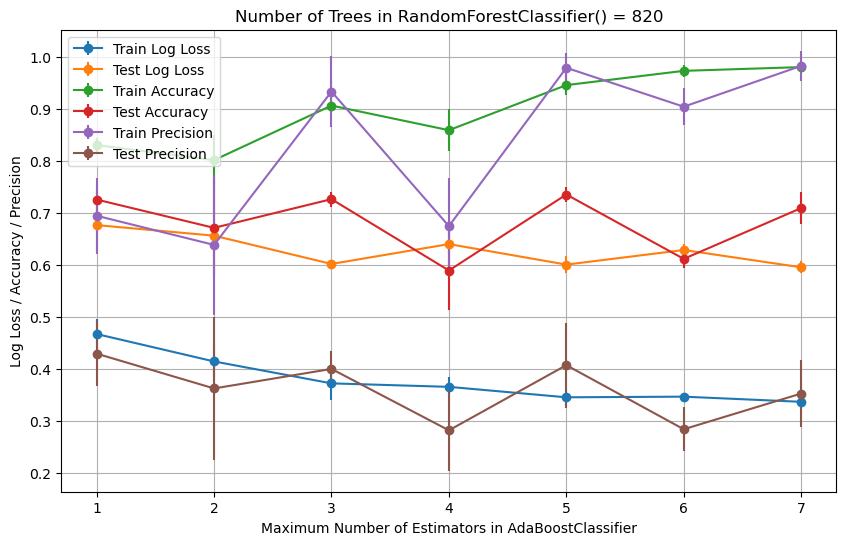

Avg Train Accuracy:
 [0.83017456 0.80124688 0.90623441 0.85885287 0.94563591 0.97306733
 0.98029925]
Avg Test Accuracy:
 [0.72537313 0.67089552 0.7261194  0.58880597 0.73507463 0.61119403
 0.70895522]
Avg Train Precision:
 [0.69417845 0.63806747 0.93312356 0.67420506 0.97895299 0.90406294
 0.98258132]
Avg Test Precision:
 [0.4288059  0.36182184 0.39943216 0.28121465 0.40663545 0.2833085
 0.35201307]
Avg Train Log Loss:
 [0.46657888 0.41379955 0.37161513 0.36489426 0.34478567 0.3460174
 0.33610262]
Avg Test Log Loss:
 [0.67618174 0.65586051 0.60141246 0.63966409 0.60018262 0.62828302
 0.59495806]


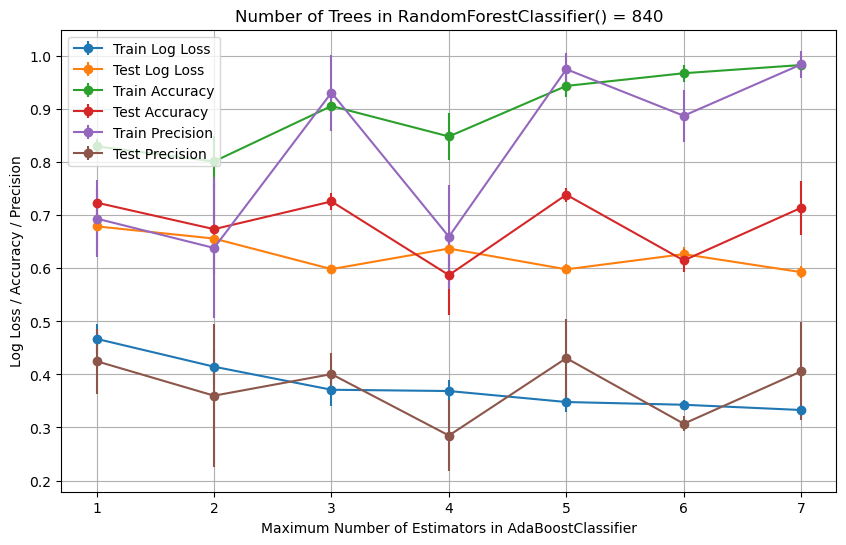

Avg Train Accuracy:
 [0.82992519 0.80149626 0.90598504 0.84862843 0.94389027 0.96783042
 0.98329177]
Avg Test Accuracy:
 [0.7238806  0.6738806  0.7261194  0.58731343 0.73880597 0.61492537
 0.7141791 ]
Avg Train Precision:
 [0.69382498 0.63840608 0.93122273 0.65968345 0.97536585 0.88762513
 0.98446997]
Avg Test Precision:
 [0.42491771 0.35995801 0.40060243 0.28484909 0.43074675 0.30708447
 0.40577501]
Avg Train Log Loss:
 [0.46707764 0.41460678 0.3711372  0.36873798 0.34800186 0.34285311
 0.33293223]
Avg Test Log Loss:
 [0.67916682 0.6561731  0.59855561 0.63732308 0.59813927 0.62675625
 0.59284065]


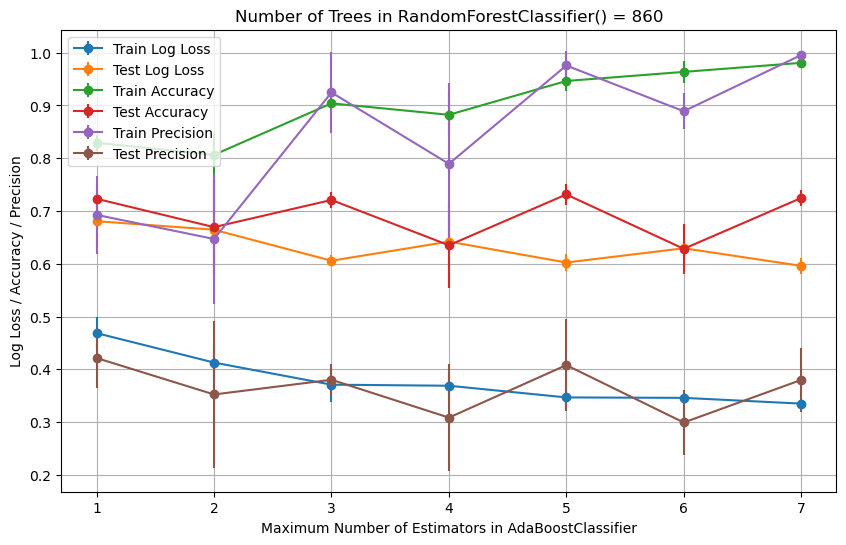

Avg Train Accuracy:
 [0.82917706 0.80648379 0.90399002 0.88229426 0.94638404 0.96359102
 0.980798  ]
Avg Test Accuracy:
 [0.72313433 0.66940299 0.72089552 0.63507463 0.73134328 0.62835821
 0.72462687]
Avg Train Precision:
 [0.69262687 0.64698724 0.92465491 0.78937247 0.97571807 0.88900947
 0.99551648]
Avg Test Precision:
 [0.42135204 0.35235119 0.38017765 0.30852237 0.40793651 0.29924045
 0.37987859]
Avg Train Log Loss:
 [0.4685739  0.41277617 0.37089736 0.36888168 0.34673306 0.34592172
 0.3349978 ]
Avg Test Log Loss:
 [0.68065935 0.66448259 0.6057881  0.64195482 0.60235195 0.62939238
 0.59606901]


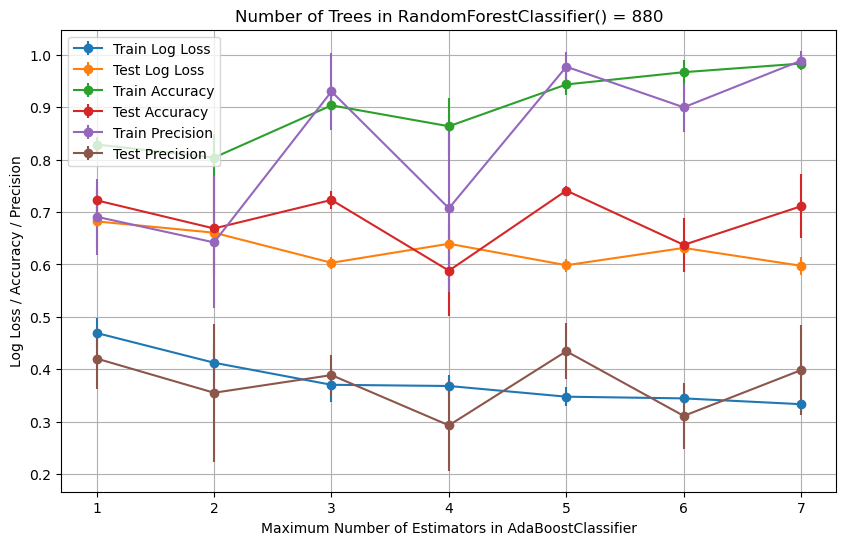

Avg Train Accuracy:
 [0.82892768 0.80399002 0.90374065 0.8638404  0.9436409  0.96708229
 0.98354115]
Avg Test Accuracy:
 [0.72238806 0.66865672 0.72313433 0.5880597  0.74104478 0.63731343
 0.71119403]
Avg Train Precision:
 [0.69102586 0.64207833 0.93023369 0.70722255 0.97756223 0.90000175
 0.98918209]
Avg Test Precision:
 [0.42025314 0.35493759 0.38867015 0.29269692 0.43422347 0.31074862
 0.39821453]
Avg Train Log Loss:
 [0.46907265 0.41225853 0.37013671 0.36786079 0.34742512 0.34420157
 0.33309207]
Avg Test Log Loss:
 [0.68215189 0.66058979 0.60314702 0.63947019 0.59848207 0.63150362
 0.59735358]


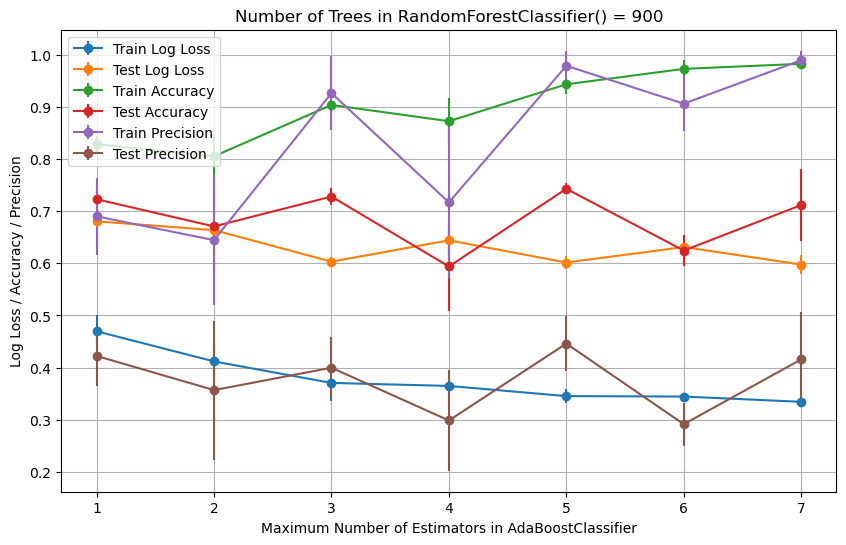

Avg Train Accuracy:
 [0.8286783  0.80573566 0.9042394  0.87306733 0.94389027 0.97356608
 0.98329177]
Avg Test Accuracy:
 [0.72313433 0.67089552 0.72835821 0.59402985 0.74328358 0.62462687
 0.7119403 ]
Avg Train Precision:
 [0.69030402 0.64463411 0.9269575  0.71715828 0.97942979 0.90665537
 0.99010607]
Avg Test Precision:
 [0.42222759 0.35657908 0.39959635 0.29827997 0.44591752 0.29113332
 0.41555726]
Avg Train Log Loss:
 [0.4695714  0.41167998 0.37039375 0.36460381 0.3450959  0.34423301
 0.33411286]
Avg Test Log Loss:
 [0.68065935 0.66384132 0.60325775 0.6442999  0.60158983 0.63135722
 0.59771322]


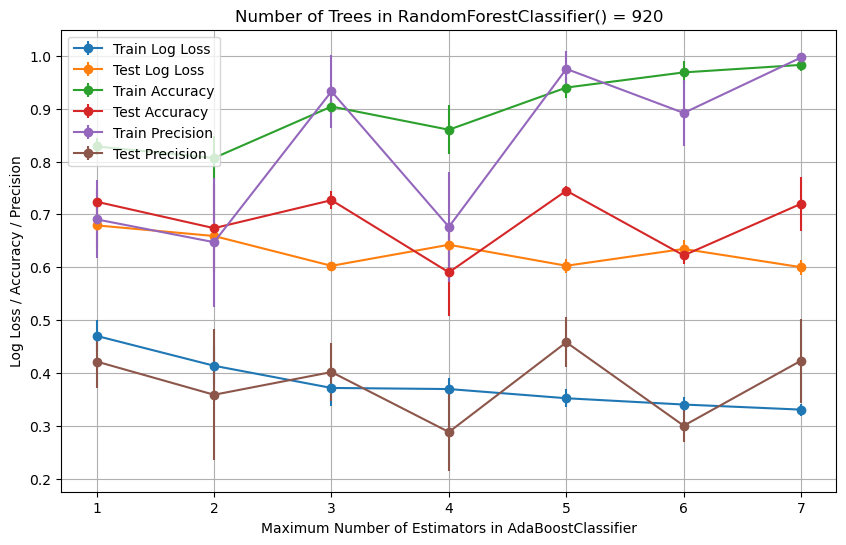

Avg Train Accuracy:
 [0.82842893 0.80673317 0.90399002 0.86009975 0.93990025 0.96857855
 0.98279302]
Avg Test Accuracy:
 [0.7238806  0.6738806  0.72686567 0.59029851 0.74477612 0.62238806
 0.72014925]
Avg Train Precision:
 [0.69050367 0.64735562 0.93262656 0.67634364 0.97520073 0.89183452
 0.99679947]
Avg Test Precision:
 [0.42154581 0.35868758 0.40163491 0.2881438  0.4579369  0.30012281
 0.42334332]
Avg Train Log Loss:
 [0.47007016 0.41358255 0.37159133 0.36950898 0.35210471 0.34019434
 0.33055804]
Avg Test Log Loss:
 [0.67916682 0.65906343 0.60264021 0.64249711 0.60274535 0.6345731
 0.59999939]


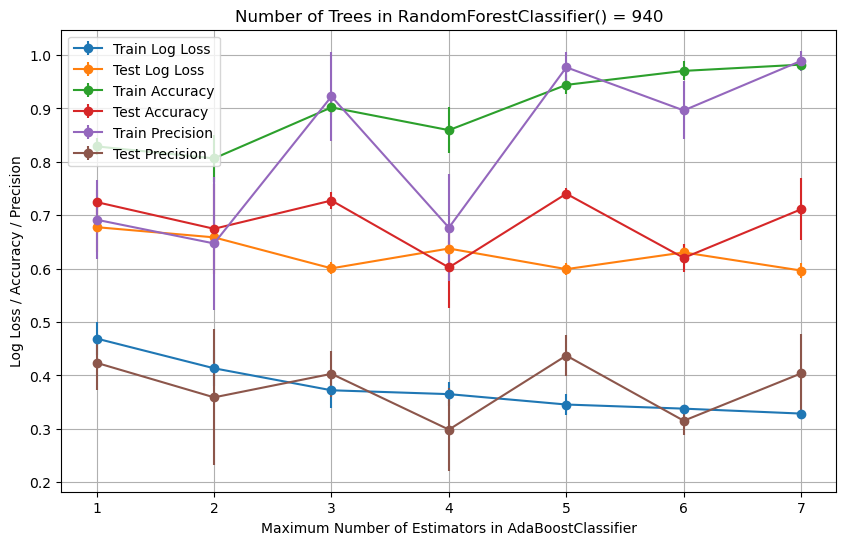

Avg Train Accuracy:
 [0.82892768 0.80648379 0.90199501 0.85935162 0.94413965 0.97032419
 0.98204489]
Avg Test Accuracy:
 [0.72462687 0.67462687 0.72761194 0.60223881 0.74029851 0.62014925
 0.71119403]
Avg Train Precision:
 [0.69159515 0.64720858 0.92247394 0.6767865  0.9770217  0.89627047
 0.98920822]
Avg Test Precision:
 [0.42361898 0.35896409 0.40300984 0.29857721 0.43723242 0.31516646
 0.40389756]
Avg Train Log Loss:
 [0.46907265 0.41341934 0.3722175  0.36500331 0.3455377  0.33783938
 0.32859134]
Avg Test Log Loss:
 [0.67767428 0.65858956 0.60057323 0.63768985 0.59906442 0.63040725
 0.59642401]


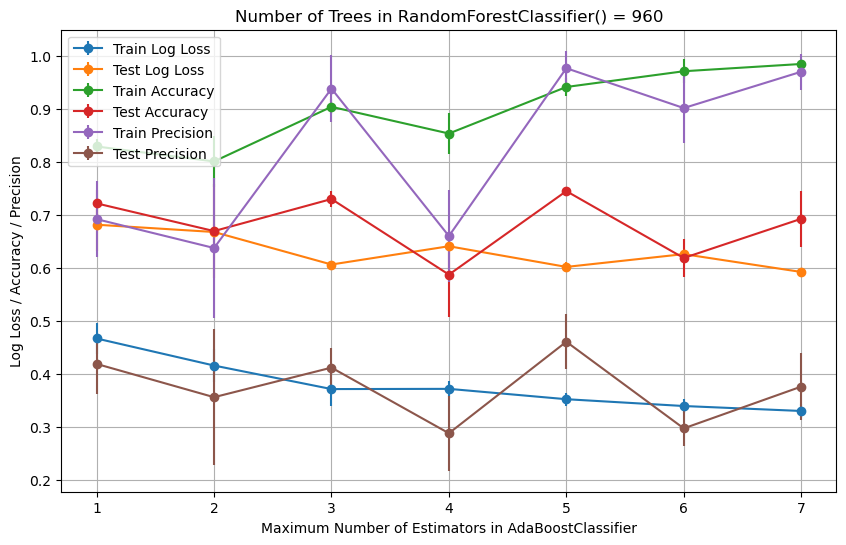

Avg Train Accuracy:
 [0.82967581 0.80149626 0.90448878 0.85411471 0.94189526 0.97157107
 0.98528678]
Avg Test Accuracy:
 [0.72238806 0.67014925 0.73059701 0.5880597  0.74552239 0.61940299
 0.69328358]
Avg Train Precision:
 [0.69263969 0.63820852 0.93880136 0.66076633 0.97727491 0.9021366
 0.97061496]
Avg Test Precision:
 [0.41958779 0.35686171 0.41264616 0.28887515 0.46143369 0.29807131
 0.37679831]
Avg Train Log Loss:
 [0.46757639 0.41657517 0.37220249 0.37259678 0.35308658 0.34024203
 0.33088584]
Avg Test Log Loss:
 [0.68215189 0.66841525 0.60709312 0.64157202 0.60257277 0.62668557
 0.59306132]


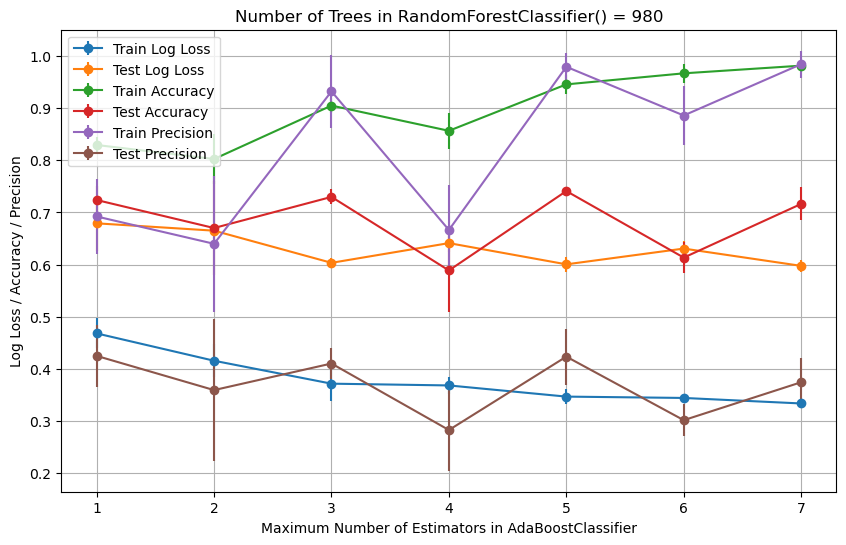

Avg Train Accuracy:
 [0.82942643 0.80249377 0.90498753 0.85660848 0.94563591 0.96683292
 0.98154613]
Avg Test Accuracy:
 [0.7238806  0.67014925 0.72985075 0.58880597 0.74104478 0.61343284
 0.71641791]
Avg Train Precision:
 [0.69231606 0.63989102 0.93221351 0.66642407 0.9793775  0.88595761
 0.98441772]
Avg Test Precision:
 [0.42493811 0.35933524 0.41030751 0.28275613 0.42350682 0.30165014
 0.37442204]
Avg Train Log Loss:
 [0.46807514 0.41563401 0.37165862 0.36826882 0.34684588 0.34427402
 0.33368923]
Avg Test Log Loss:
 [0.67916682 0.66508794 0.60341482 0.64123555 0.60050986 0.63074435
 0.59756748]


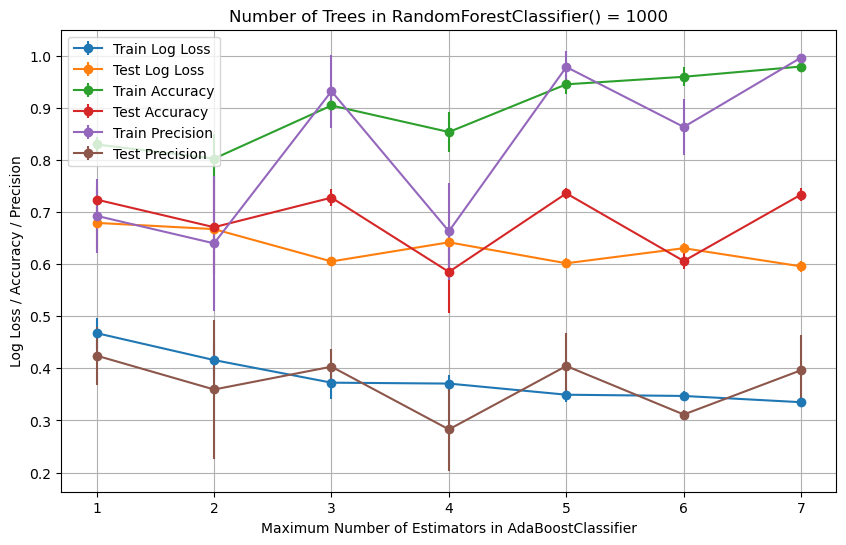

Avg Train Accuracy:
 [0.82967581 0.80249377 0.90448878 0.85361596 0.94513716 0.959601
 0.97930175]
Avg Test Accuracy:
 [0.7238806  0.67089552 0.72761194 0.58507463 0.7358209  0.60597015
 0.73358209]
Avg Train Precision:
 [0.69268972 0.63987437 0.9318934  0.66310607 0.97839506 0.86327733
 0.99655172]
Avg Test Precision:
 [0.4243497  0.35936536 0.40316732 0.28276569 0.40447152 0.31135649
 0.39643098]
Avg Train Log Loss:
 [0.46757639 0.41585257 0.37246269 0.37071643 0.34934305 0.34696998
 0.33496075]
Avg Test Log Loss:
 [0.67916682 0.6672207  0.60517769 0.64187557 0.60166469 0.63059708
 0.59567477]


In [199]:
for n_trees in range(820, 1010, 20):
    n_estimators_range = list(range(1, 8))

    classifier_params = {
        'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in RandomForestClassifier() = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

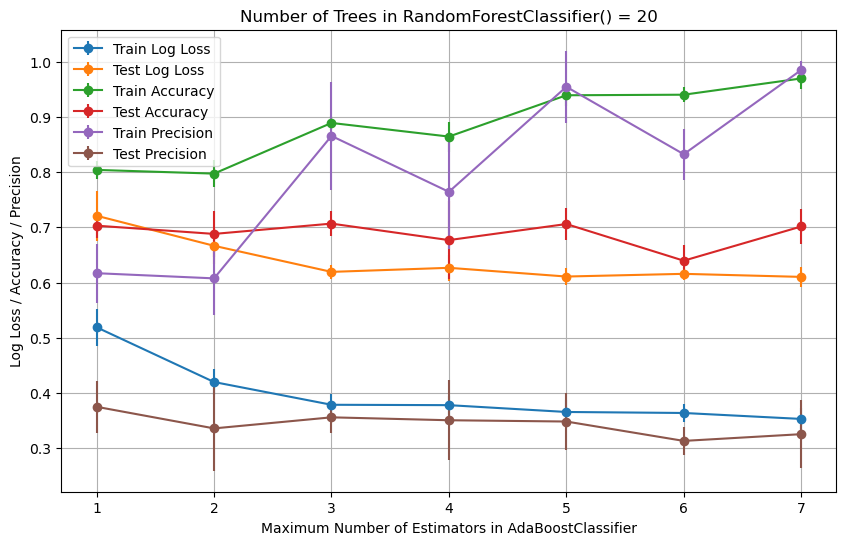

Avg Train Accuracy:
 [0.80399002 0.79725686 0.88902743 0.86433915 0.93915212 0.94014963
 0.96957606]
Avg Test Accuracy:
 [0.70298507 0.6880597  0.70671642 0.67686567 0.70597015 0.63955224
 0.70149254]
Avg Train Precision:
 [0.61692298 0.60756229 0.86547016 0.7642543  0.95448673 0.8323523
 0.98484668]
Avg Test Precision:
 [0.37497586 0.33588096 0.35591092 0.35063142 0.34832253 0.31322649
 0.32541063]
Avg Train Log Loss:
 [0.51894796 0.41984008 0.37864546 0.37797008 0.36560713 0.36378905
 0.35301536]
Avg Test Log Loss:
 [0.72095786 0.6665327  0.61930993 0.6266673  0.61088748 0.61576864
 0.61023873]


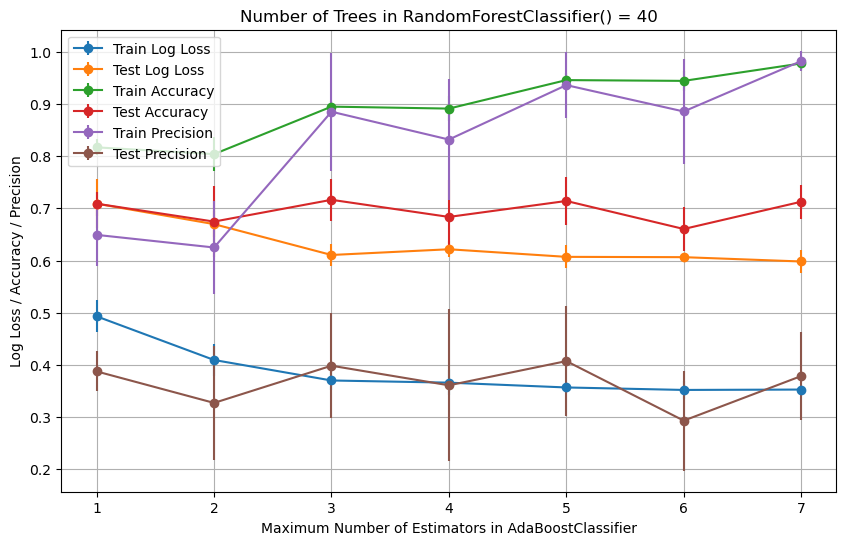

Avg Train Accuracy:
 [0.81695761 0.80399002 0.89501247 0.89127182 0.94588529 0.94438903
 0.97780549]
Avg Test Accuracy:
 [0.70895522 0.67462687 0.71641791 0.68358209 0.7141791  0.66044776
 0.71268657]
Avg Train Precision:
 [0.64917604 0.62499103 0.88527611 0.8319096  0.93625758 0.88571155
 0.98230583]
Avg Test Precision:
 [0.3874439  0.32702212 0.39836108 0.36079122 0.40719298 0.29305452
 0.37849751]
Avg Train Log Loss:
 [0.4930128  0.40933183 0.37003876 0.3658732  0.35666164 0.35190728
 0.35263331]
Avg Test Log Loss:
 [0.70901756 0.66975043 0.61062689 0.62160126 0.60703648 0.60644003
 0.59817013]


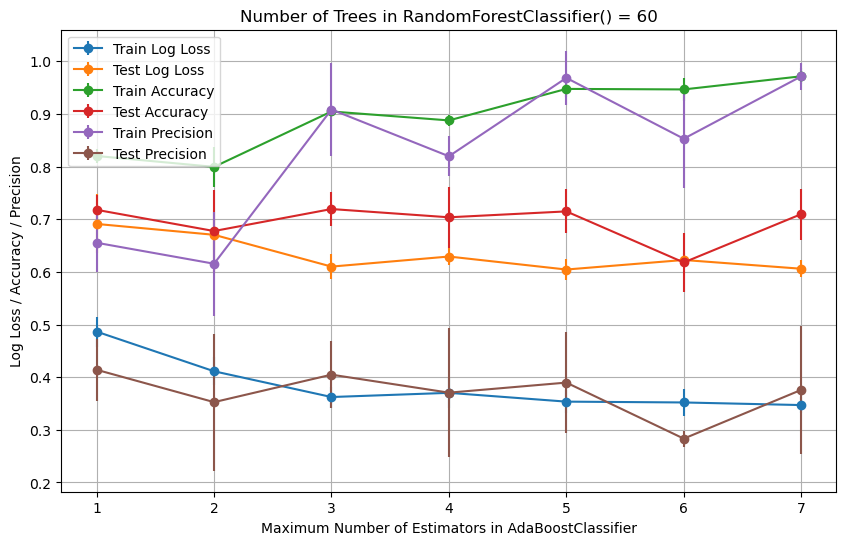

Avg Train Accuracy:
 [0.8201995  0.79950125 0.90473815 0.88778055 0.94763092 0.94663342
 0.97157107]
Avg Test Accuracy:
 [0.71791045 0.67761194 0.71940299 0.70373134 0.71492537 0.61791045
 0.70970149]
Avg Train Precision:
 [0.65533965 0.61549629 0.90845777 0.81966932 0.96854854 0.85300358
 0.9714404 ]
Avg Test Precision:
 [0.4140236  0.35254922 0.40476425 0.37056772 0.3897034  0.28325553
 0.37581657]
Avg Train Log Loss:
 [0.48652901 0.41120843 0.36227455 0.37023619 0.35352576 0.35196384
 0.34700849]
Avg Test Log Loss:
 [0.69110712 0.67046719 0.61005168 0.62919366 0.60448941 0.62263045
 0.60600933]


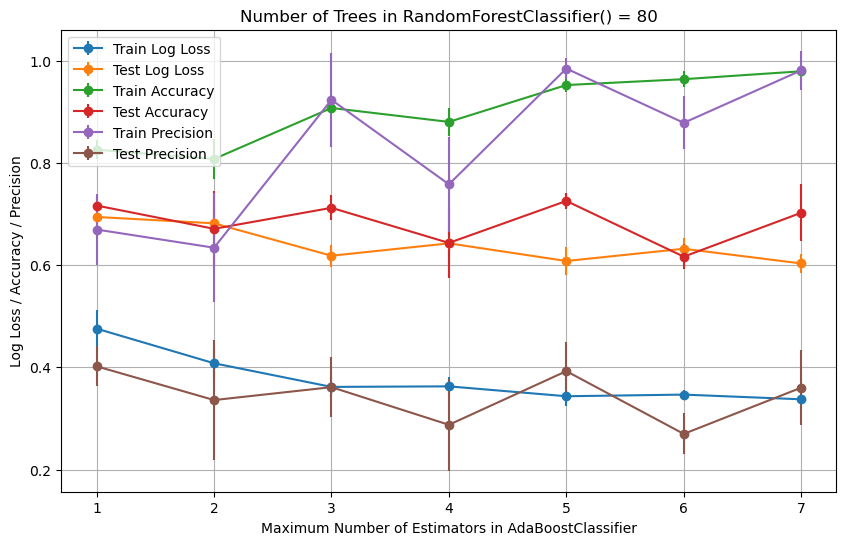

Avg Train Accuracy:
 [0.82568579 0.8074813  0.90723192 0.88004988 0.9521197  0.96359102
 0.97905237]
Avg Test Accuracy:
 [0.71641791 0.67089552 0.7119403  0.64328358 0.72537313 0.61641791
 0.70223881]
Avg Train Precision:
 [0.66944972 0.63391874 0.9232002  0.75791017 0.98437413 0.87819127
 0.98073394]
Avg Test Precision:
 [0.40189229 0.33587217 0.36113095 0.28747958 0.39245164 0.26968553
 0.36006939]
Avg Train Log Loss:
 [0.47555644 0.40786084 0.3616306  0.36268638 0.34335005 0.34655015
 0.33735412]
Avg Test Log Loss:
 [0.69409219 0.68158998 0.61822869 0.6424325  0.60789762 0.63187405
 0.60312667]


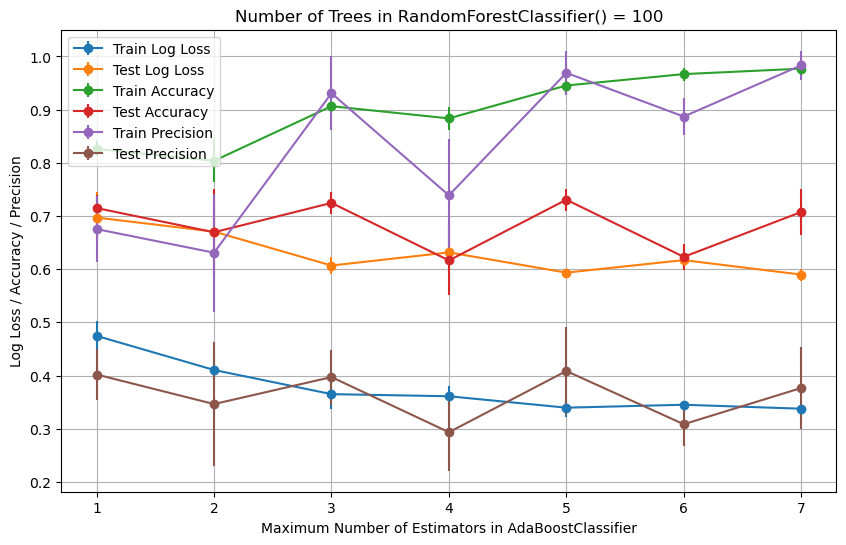

Avg Train Accuracy:
 [0.82618454 0.80374065 0.90648379 0.88354115 0.94538653 0.96683292
 0.97705736]
Avg Test Accuracy:
 [0.71492537 0.66940299 0.72462687 0.61641791 0.73059701 0.62313433
 0.70746269]
Avg Train Precision:
 [0.67537346 0.63098206 0.93086527 0.73880156 0.9691832  0.88699003
 0.98331741]
Avg Test Precision:
 [0.40188111 0.34630965 0.39707155 0.29337852 0.40849346 0.30841082
 0.37649874]
Avg Train Log Loss:
 [0.47455893 0.41045452 0.36499225 0.36101091 0.33953424 0.34505904
 0.33760881]
Avg Test Log Loss:
 [0.69707726 0.67059161 0.60686164 0.63157081 0.59350274 0.61704177
 0.58980828]


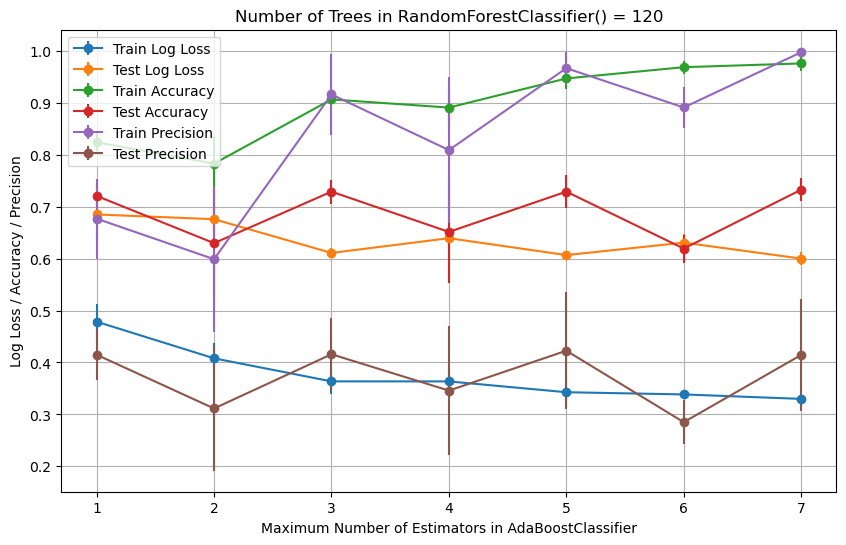

Avg Train Accuracy:
 [0.82418953 0.78304239 0.90673317 0.89102244 0.94713217 0.96882793
 0.97605985]
Avg Test Accuracy:
 [0.72089552 0.62985075 0.72910448 0.65149254 0.72910448 0.61940299
 0.73283582]
Avg Train Precision:
 [0.67701775 0.59895631 0.91628248 0.80911291 0.96693824 0.89119707
 0.99759584]
Avg Test Precision:
 [0.41491398 0.3113699  0.41583091 0.34586464 0.42265647 0.28495392
 0.41449977]
Avg Train Log Loss:
 [0.47854896 0.40801935 0.36359967 0.36354091 0.34269822 0.33845111
 0.32982746]
Avg Test Log Loss:
 [0.68513697 0.67597774 0.61101878 0.63941389 0.60685084 0.63084933
 0.60012915]


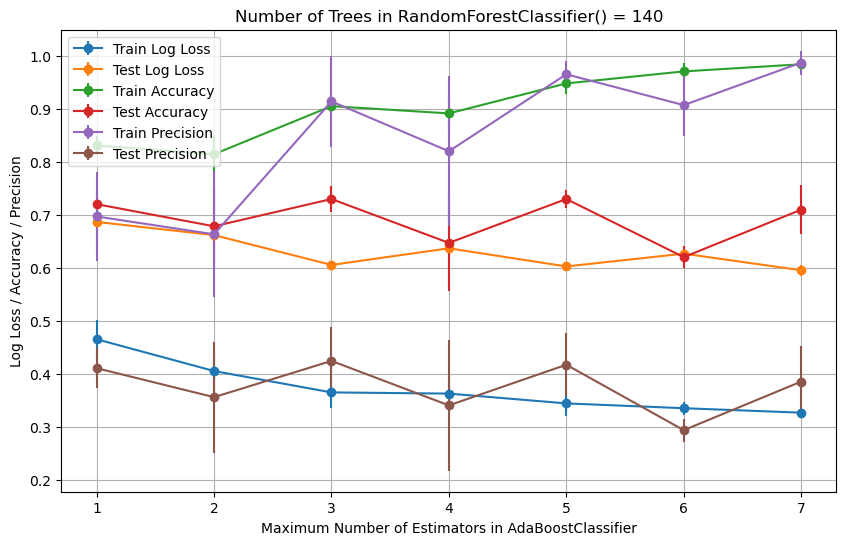

Avg Train Accuracy:
 [0.83092269 0.81446384 0.90523691 0.8915212  0.94812968 0.97082294
 0.98428928]
Avg Test Accuracy:
 [0.72014925 0.67835821 0.72985075 0.64701493 0.72985075 0.62014925
 0.70970149]
Avg Train Precision:
 [0.69689967 0.6632426  0.91419894 0.82004637 0.96540405 0.90712629
 0.98736068]
Avg Test Precision:
 [0.41048638 0.35573012 0.42419653 0.34022928 0.41696054 0.29341416
 0.3851538 ]
Avg Train Log Loss:
 [0.46508262 0.405078   0.36470811 0.36245764 0.34396554 0.33490415
 0.32642954]
Avg Test Log Loss:
 [0.6866295  0.66174124 0.60536736 0.63682466 0.60255516 0.62668616
 0.59535661]


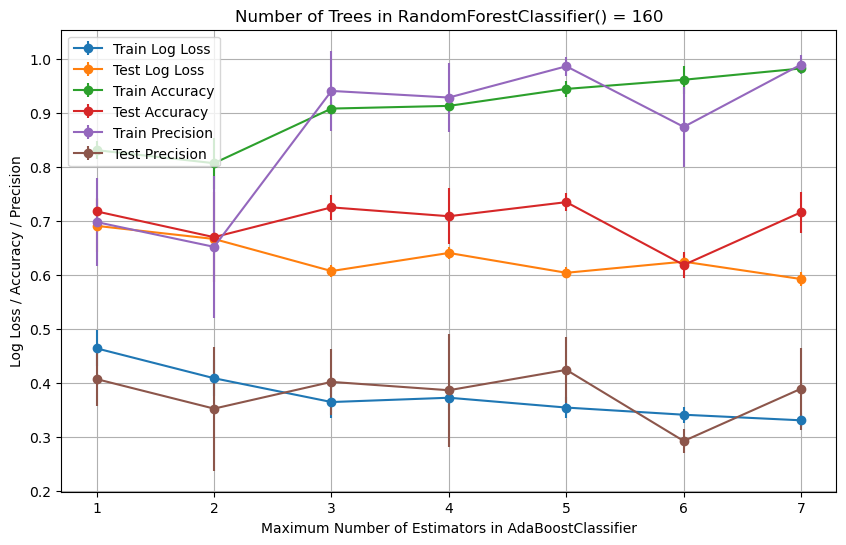

Avg Train Accuracy:
 [0.83142145 0.80723192 0.9084788  0.91346633 0.94488778 0.96184539
 0.98279302]
Avg Test Accuracy:
 [0.71791045 0.67014925 0.72537313 0.70895522 0.73507463 0.61865672
 0.71641791]
Avg Train Precision:
 [0.69810699 0.65221576 0.9411883  0.92893913 0.98685353 0.87454758
 0.99014482]
Avg Test Precision:
 [0.40710225 0.3524047  0.40195071 0.38648371 0.4242384  0.2923685
 0.38942655]
Avg Train Log Loss:
 [0.46408512 0.40874411 0.3646033  0.37259469 0.35437479 0.34110957
 0.33073071]
Avg Test Log Loss:
 [0.69110712 0.66681165 0.60734884 0.64090414 0.60414346 0.62478538
 0.59252712]


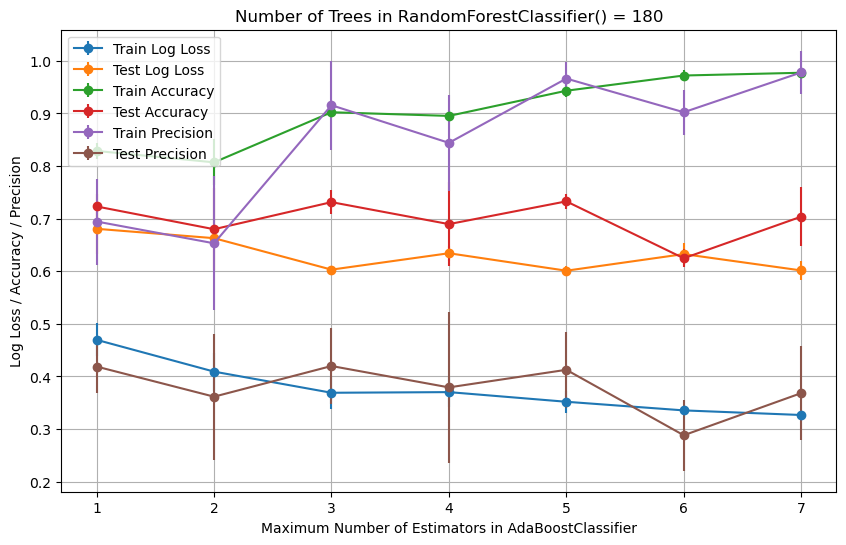

Avg Train Accuracy:
 [0.8286783  0.80698254 0.90224439 0.89526185 0.94314214 0.97206983
 0.97730673]
Avg Test Accuracy:
 [0.72313433 0.67985075 0.73134328 0.68955224 0.73283582 0.62462687
 0.70373134]
Avg Train Precision:
 [0.69447877 0.65309347 0.91560726 0.84405645 0.9662501  0.90223136
 0.97790748]
Avg Test Precision:
 [0.4187469  0.36149747 0.41981136 0.37918092 0.41261165 0.28815664
 0.36824489]
Avg Train Log Loss:
 [0.4695714  0.40915894 0.36895253 0.37018644 0.35184212 0.3354409
 0.32668096]
Avg Test Log Loss:
 [0.68065935 0.66283751 0.60301912 0.63422193 0.6009952  0.63257212
 0.60149206]


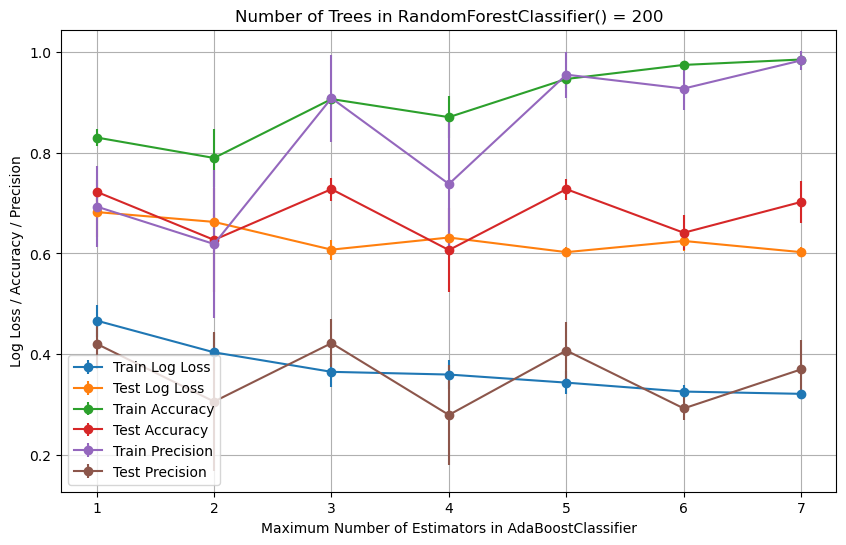

Avg Train Accuracy:
 [0.83017456 0.78952618 0.90648379 0.87057357 0.94638404 0.97431421
 0.98503741]
Avg Test Accuracy:
 [0.72238806 0.62686567 0.72761194 0.60671642 0.72761194 0.64104478
 0.70223881]
Avg Train Precision:
 [0.69307234 0.61866473 0.90838935 0.73781181 0.95495822 0.92733612
 0.98328398]
Avg Test Precision:
 [0.42052783 0.30583758 0.42185912 0.27929792 0.40720011 0.29226449
 0.36980406]
Avg Train Log Loss:
 [0.46657888 0.40360724 0.3648768  0.35951039 0.34346527 0.32569689
 0.3211886 ]
Avg Test Log Loss:
 [0.68215189 0.66259667 0.60750379 0.63156973 0.60255991 0.62476292
 0.60256791]


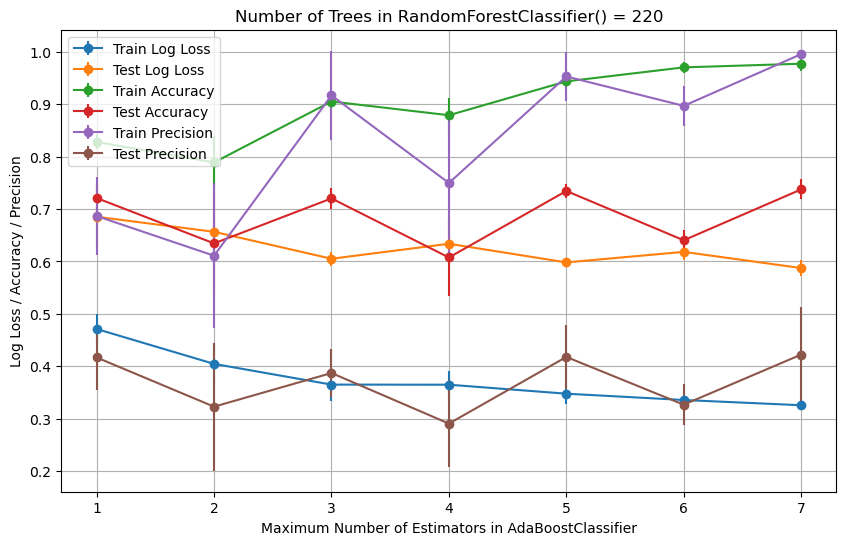

Avg Train Accuracy:
 [0.82793017 0.78877805 0.90498753 0.87880299 0.94339152 0.97007481
 0.97705736]
Avg Test Accuracy:
 [0.72089552 0.63432836 0.72014925 0.60746269 0.73432836 0.64029851
 0.73731343]
Avg Train Precision:
 [0.68650593 0.61085962 0.91660025 0.74951651 0.95272614 0.89666696
 0.99532974]
Avg Test Precision:
 [0.41677696 0.32292039 0.38713627 0.29067369 0.41777264 0.32675051
 0.42229721]
Avg Train Log Loss:
 [0.47106766 0.40452736 0.36501788 0.36485753 0.3476942  0.33564761
 0.32566688]
Avg Test Log Loss:
 [0.68513697 0.65645023 0.60507818 0.63365085 0.59808097 0.61818466
 0.5873042 ]


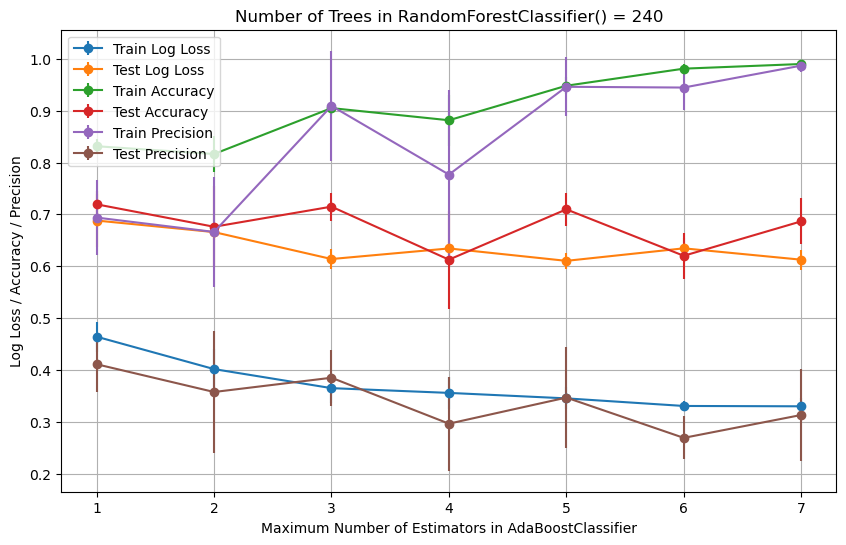

Avg Train Accuracy:
 [0.83142145 0.81645885 0.90498753 0.88154613 0.94812968 0.98104738
 0.99002494]
Avg Test Accuracy:
 [0.71940299 0.6761194  0.71492537 0.61268657 0.70970149 0.62014925
 0.68656716]
Avg Train Precision:
 [0.69387012 0.66611414 0.90919972 0.77674658 0.94607842 0.94461208
 0.98690019]
Avg Test Precision:
 [0.41096494 0.35744572 0.38493393 0.29634527 0.34666293 0.26897703
 0.31310155]
Avg Train Log Loss:
 [0.46408512 0.40161162 0.36487749 0.35571195 0.34515963 0.33050994
 0.32985174]
Avg Test Log Loss:
 [0.68812204 0.66585693 0.61390158 0.63430172 0.61037709 0.63452278
 0.61261412]


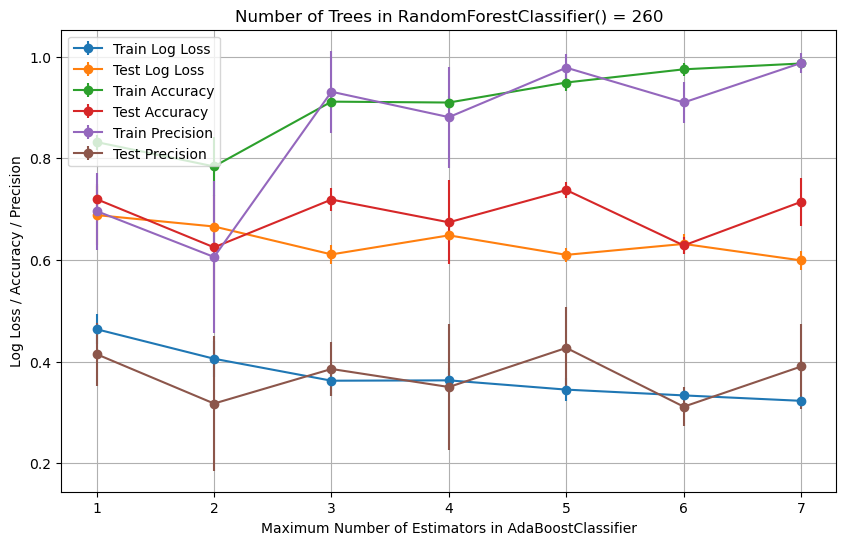

Avg Train Accuracy:
 [0.83167082 0.78379052 0.91122195 0.90947631 0.94887781 0.97481297
 0.98628429]
Avg Test Accuracy:
 [0.71940299 0.62462687 0.71865672 0.6738806  0.73731343 0.62835821
 0.7141791 ]
Avg Train Precision:
 [0.69596545 0.60565651 0.93071326 0.88074001 0.97801441 0.90957625
 0.98727254]
Avg Test Precision:
 [0.41445878 0.3174023  0.38539462 0.34990986 0.42686664 0.31121308
 0.39028881]
Avg Train Log Loss:
 [0.46358637 0.40552999 0.36231615 0.36302801 0.34479521 0.33341361
 0.32272847]
Avg Test Log Loss:
 [0.68812204 0.66563828 0.61074282 0.64823103 0.60988361 0.63136676
 0.59890654]


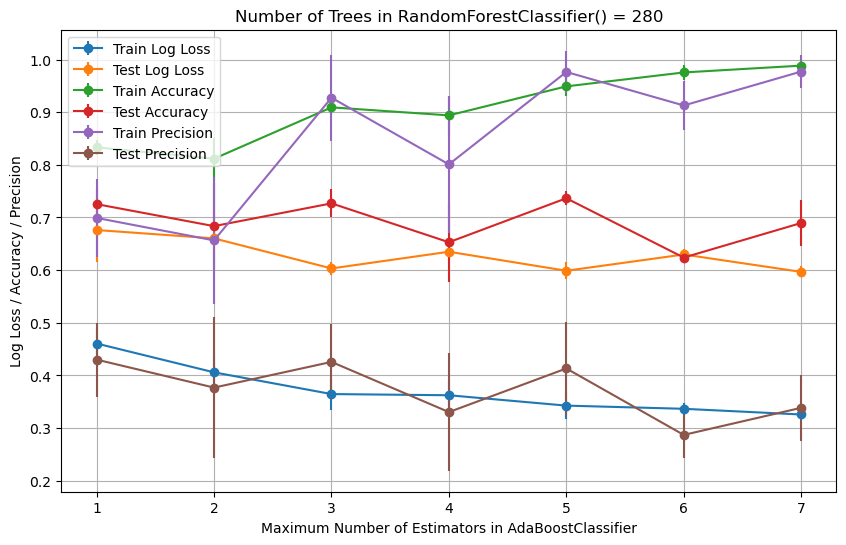

Avg Train Accuracy:
 [0.83316708 0.8117207  0.90922693 0.89401496 0.94912718 0.9755611
 0.98852868]
Avg Test Accuracy:
 [0.72537313 0.68358209 0.72686567 0.65298507 0.73656716 0.6238806
 0.68955224]
Avg Train Precision:
 [0.69919251 0.65646669 0.92756236 0.80088075 0.97649344 0.91279635
 0.9772494 ]
Avg Test Precision:
 [0.42998779 0.3768254  0.42563407 0.33032282 0.41320137 0.28697114
 0.33845824]
Avg Train Log Loss:
 [0.46059385 0.40583248 0.36456134 0.36231038 0.34260615 0.33657596
 0.32574855]
Avg Test Log Loss:
 [0.67618174 0.66031928 0.60322026 0.63493547 0.59884114 0.62972494
 0.59667728]


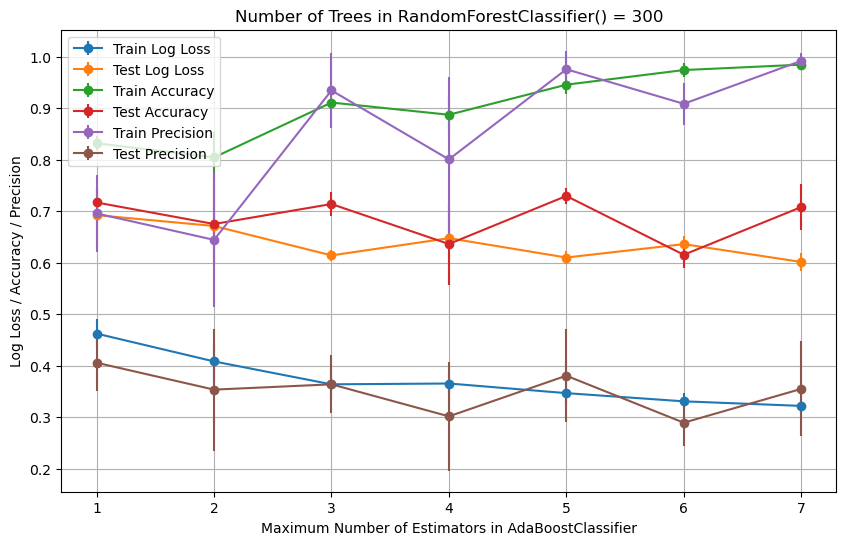

Avg Train Accuracy:
 [0.83216958 0.80473815 0.91122195 0.88753117 0.94588529 0.97431421
 0.98478803]
Avg Test Accuracy:
 [0.71716418 0.67537313 0.7141791  0.63656716 0.72985075 0.61567164
 0.70820896]
Avg Train Precision:
 [0.69592735 0.64456156 0.93474    0.80085523 0.97584304 0.90877919
 0.99219512]
Avg Test Precision:
 [0.40600641 0.35379118 0.36410343 0.30191727 0.38086738 0.28956508
 0.35519748]
Avg Train Log Loss:
 [0.46258886 0.40857822 0.36410447 0.36570205 0.34699873 0.33108319
 0.3222403 ]
Avg Test Log Loss:
 [0.69259965 0.67154156 0.61444835 0.64788595 0.61029805 0.63631164
 0.60171287]


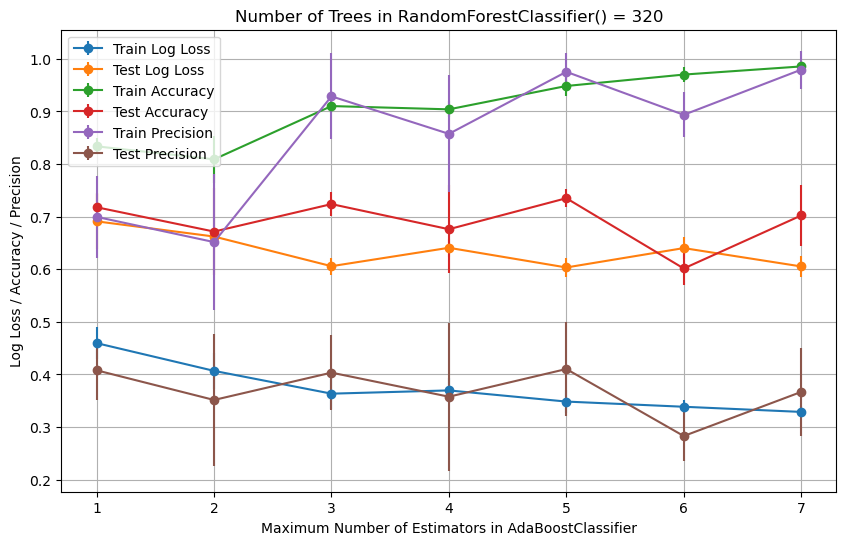

Avg Train Accuracy:
 [0.83366584 0.80897756 0.91022444 0.90399002 0.94837905 0.97007481
 0.98553616]
Avg Test Accuracy:
 [0.71791045 0.67164179 0.7238806  0.6761194  0.73507463 0.60149254
 0.70223881]
Avg Train Precision:
 [0.69957635 0.65166218 0.92870935 0.85740871 0.97532452 0.8935606
 0.97939291]
Avg Test Precision:
 [0.4079456  0.35156317 0.40351971 0.35776982 0.41039092 0.28302051
 0.36685147]
Avg Train Log Loss:
 [0.45959634 0.40687145 0.36355287 0.36972957 0.34851603 0.33866353
 0.32886799]
Avg Test Log Loss:
 [0.69110712 0.66222635 0.60585371 0.64083326 0.60342711 0.64025984
 0.60538675]


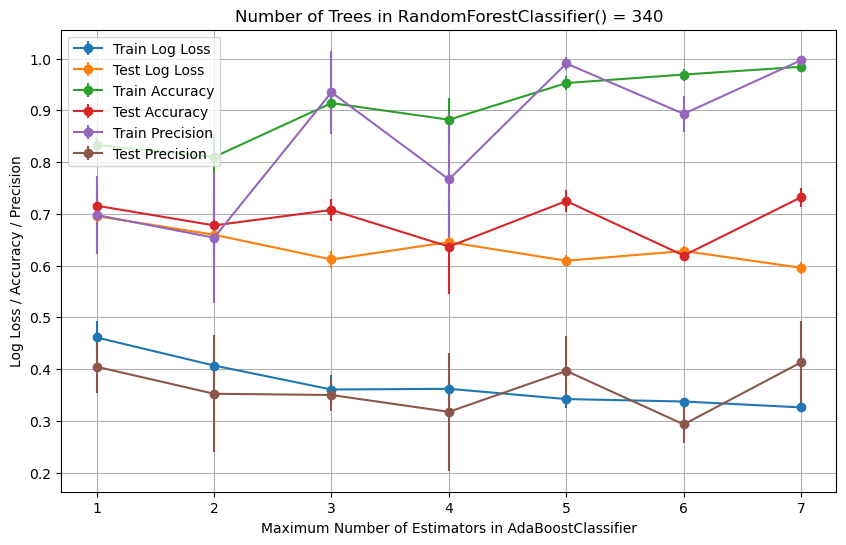

Avg Train Accuracy:
 [0.83291771 0.80972569 0.91396509 0.88179551 0.95261845 0.96907731
 0.9840399 ]
Avg Test Accuracy:
 [0.71567164 0.67761194 0.70746269 0.63656716 0.72462687 0.61940299
 0.73208955]
Avg Train Precision:
 [0.69771569 0.65385525 0.93478041 0.76638115 0.99049184 0.8930724
 0.99670489]
Avg Test Precision:
 [0.40443445 0.35231971 0.34990649 0.31738622 0.39651234 0.29315491
 0.4131077 ]
Avg Train Log Loss:
 [0.4610926  0.40689838 0.36052021 0.36191118 0.34204934 0.33733702
 0.32597749]
Avg Test Log Loss:
 [0.69558473 0.65955629 0.61174391 0.64537713 0.60927141 0.62817501
 0.59571593]


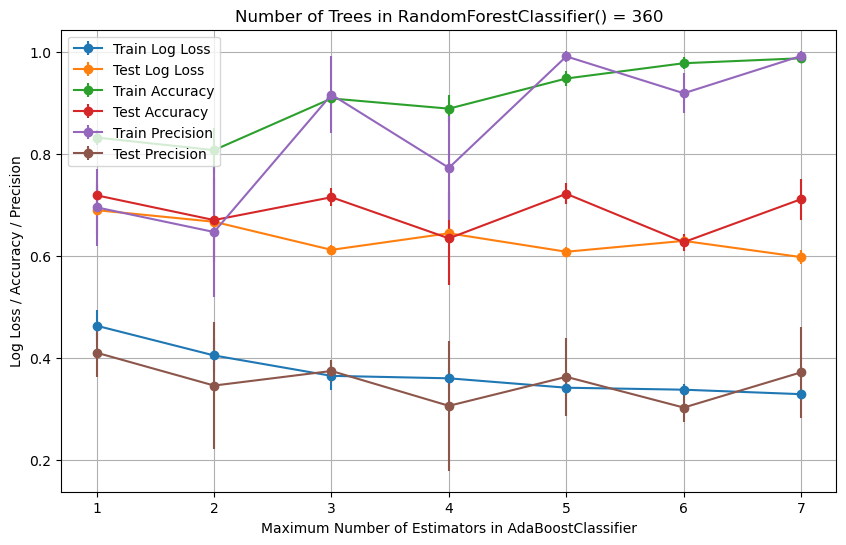

Avg Train Accuracy:
 [0.8319202  0.80723192 0.9084788  0.88852868 0.94763092 0.97755611
 0.9872818 ]
Avg Test Accuracy:
 [0.71865672 0.67014925 0.71492537 0.63432836 0.72164179 0.62686567
 0.71119403]
Avg Train Precision:
 [0.69510652 0.64675101 0.91604433 0.77254223 0.99095426 0.91868578
 0.99185323]
Avg Test Precision:
 [0.41023294 0.34583605 0.37439215 0.30609951 0.3629281  0.30267173
 0.37179968]
Avg Train Log Loss:
 [0.46308761 0.40482951 0.36483562 0.36002864 0.34160005 0.33771867
 0.32894638]
Avg Test Log Loss:
 [0.68961458 0.66689635 0.6117698  0.64425951 0.60808864 0.62938347
 0.59756059]


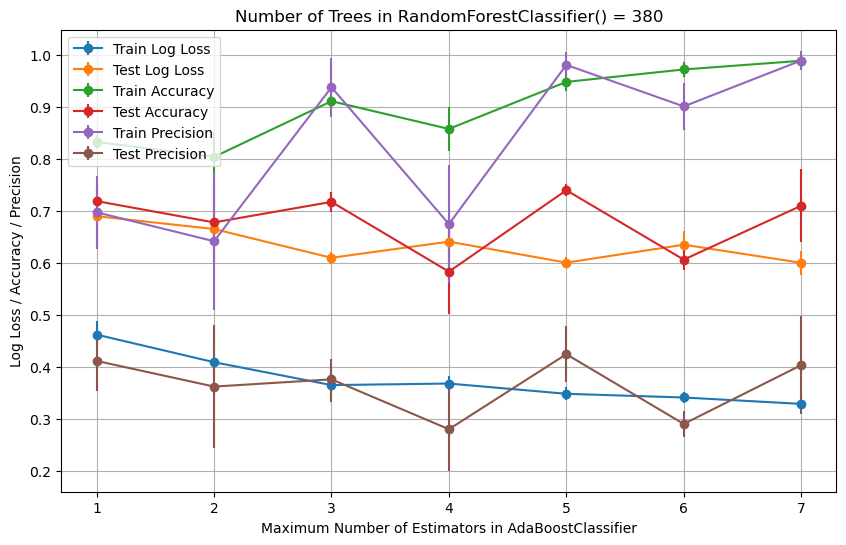

Avg Train Accuracy:
 [0.83266833 0.80374065 0.91097257 0.85760599 0.94812968 0.97206983
 0.98877805]
Avg Test Accuracy:
 [0.71865672 0.67761194 0.71716418 0.58283582 0.73955224 0.60597015
 0.70970149]
Avg Train Precision:
 [0.69711147 0.6413621  0.93784251 0.67437322 0.9808516  0.90093316
 0.98925121]
Avg Test Precision:
 [0.41097703 0.36159852 0.37550374 0.27949764 0.42388699 0.28968099
 0.40289326]
Avg Train Log Loss:
 [0.46159135 0.40853066 0.36443003 0.36746595 0.34769868 0.34058095
 0.32826043]
Avg Test Log Loss:
 [0.68961458 0.66490371 0.60949584 0.64062882 0.60022021 0.63472632
 0.59986532]


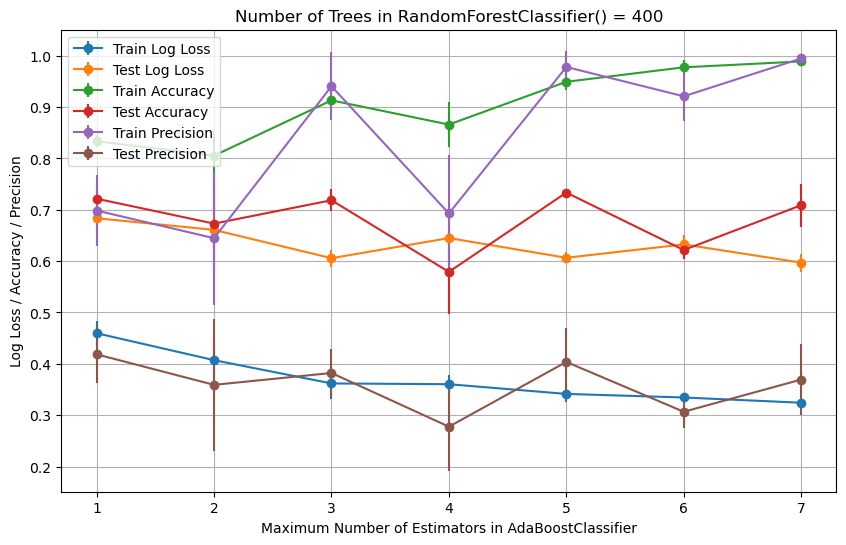

Avg Train Accuracy:
 [0.83366584 0.80548628 0.91321696 0.86608479 0.94937656 0.97755611
 0.98902743]
Avg Test Accuracy:
 [0.72164179 0.67313433 0.71865672 0.57910448 0.73358209 0.62164179
 0.70895522]
Avg Train Precision:
 [0.69859463 0.64471506 0.9406828  0.69290127 0.97824148 0.92108545
 0.99475399]
Avg Test Precision:
 [0.41849378 0.35902856 0.38215997 0.27757526 0.40369247 0.30664962
 0.36934926]
Avg Train Log Loss:
 [0.45959634 0.40714396 0.36182122 0.36030424 0.34137944 0.33443405
 0.32422425]
Avg Test Log Loss:
 [0.68364443 0.66091207 0.6057781  0.64497836 0.60657996 0.63262131
 0.5971199 ]


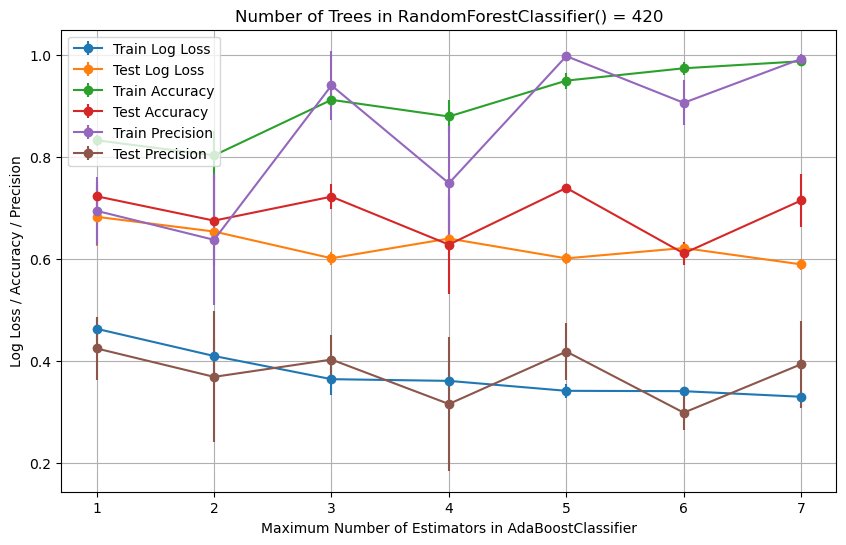

Avg Train Accuracy:
 [0.83216958 0.80249377 0.91147132 0.87880299 0.94912718 0.97331671
 0.98703242]
Avg Test Accuracy:
 [0.72238806 0.67462687 0.72164179 0.62761194 0.73880597 0.61044776
 0.7141791 ]
Avg Train Precision:
 [0.6938869  0.6369925  0.93973621 0.74790948 0.99716312 0.90561671
 0.99173459]
Avg Test Precision:
 [0.42407484 0.3683451  0.40223587 0.31515666 0.41798435 0.29812296
 0.39313766]
Avg Train Log Loss:
 [0.46258886 0.40927359 0.36380931 0.36047214 0.34098063 0.34029293
 0.32933951]
Avg Test Log Loss:
 [0.68215189 0.65327646 0.60089351 0.63949071 0.60068361 0.62095223
 0.58888169]


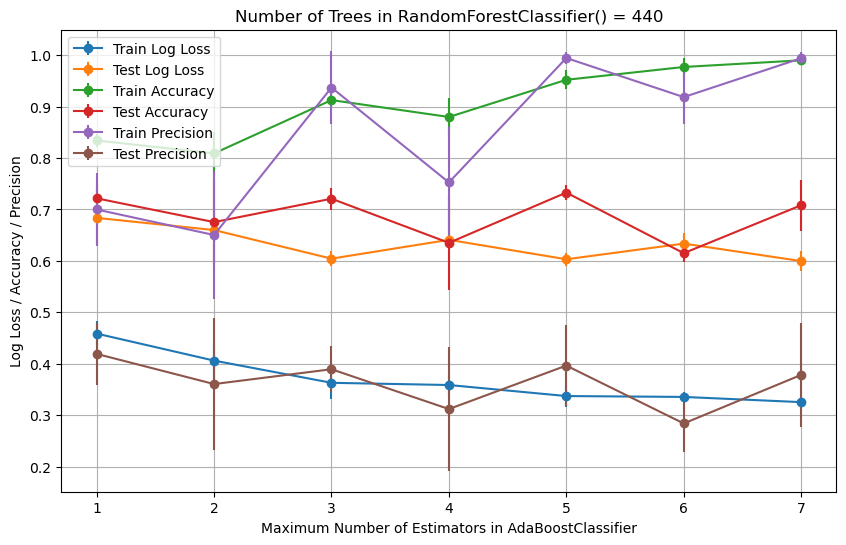

Avg Train Accuracy:
 [0.83416459 0.80897756 0.9127182  0.8798005  0.9521197  0.97705736
 0.99002494]
Avg Test Accuracy:
 [0.72164179 0.67537313 0.72089552 0.63507463 0.73283582 0.61492537
 0.70820896]
Avg Train Precision:
 [0.69990859 0.65030398 0.93711273 0.75255621 0.99452055 0.91850916
 0.99408867]
Avg Test Precision:
 [0.41910149 0.36044337 0.38925745 0.31181043 0.39636601 0.28379613
 0.37826828]
Avg Train Log Loss:
 [0.45859883 0.40604092 0.36288592 0.35857742 0.33712762 0.33541513
 0.32529112]
Avg Test Log Loss:
 [0.68364443 0.65994921 0.60434362 0.64092481 0.603148   0.63359915
 0.59960548]


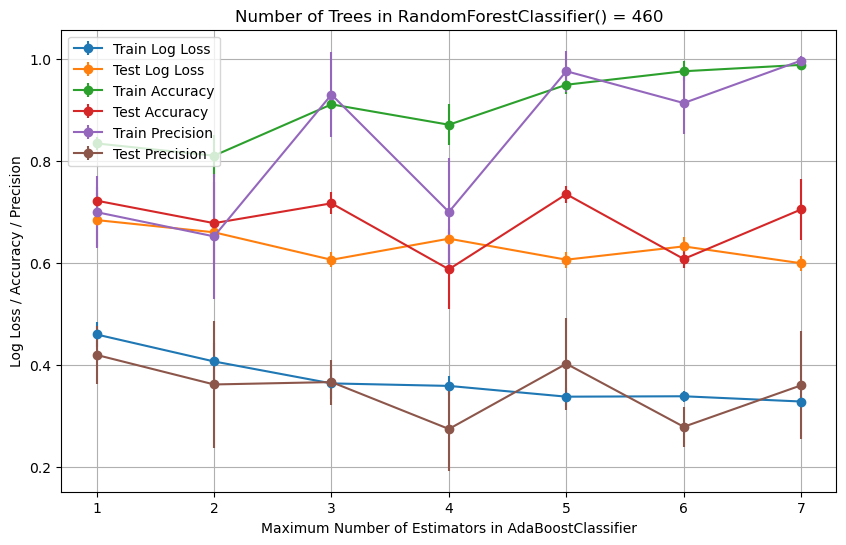

Avg Train Accuracy:
 [0.83366584 0.80972569 0.91022444 0.87032419 0.94862843 0.97506234
 0.98753117]
Avg Test Accuracy:
 [0.72164179 0.67761194 0.71641791 0.58731343 0.73432836 0.60746269
 0.70447761]
Avg Train Precision:
 [0.69915144 0.65170089 0.92939909 0.69951129 0.97514368 0.91277153
 0.9960199 ]
Avg Test Precision:
 [0.41956281 0.36173374 0.36641122 0.27455628 0.40227116 0.27883162
 0.36004482]
Avg Train Log Loss:
 [0.45959634 0.40677225 0.3637991  0.35889764 0.33781848 0.33861058
 0.32833809]
Avg Test Log Loss:
 [0.68364443 0.65968016 0.60586638 0.64720214 0.60605814 0.63211521
 0.59905442]


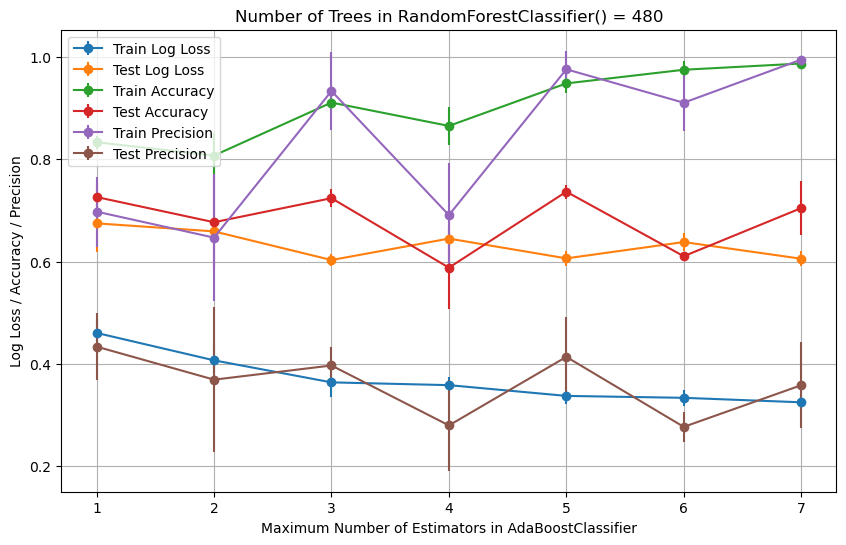

Avg Train Accuracy:
 [0.83316708 0.80723192 0.91072319 0.86508728 0.94812968 0.97481297
 0.98703242]
Avg Test Accuracy:
 [0.7261194  0.67686567 0.7238806  0.5880597  0.73656716 0.61044776
 0.70447761]
Avg Train Precision:
 [0.69755003 0.64679488 0.93326407 0.69077257 0.97573099 0.91041828
 0.99458086]
Avg Test Precision:
 [0.4337847  0.3692447  0.39694354 0.27984908 0.41376957 0.27702286
 0.35833576]
Avg Train Log Loss:
 [0.46059385 0.40698867 0.36396931 0.35853764 0.33752446 0.33376706
 0.32501931]
Avg Test Log Loss:
 [0.67468921 0.65898498 0.60300826 0.64491055 0.60625723 0.63814587
 0.60557574]


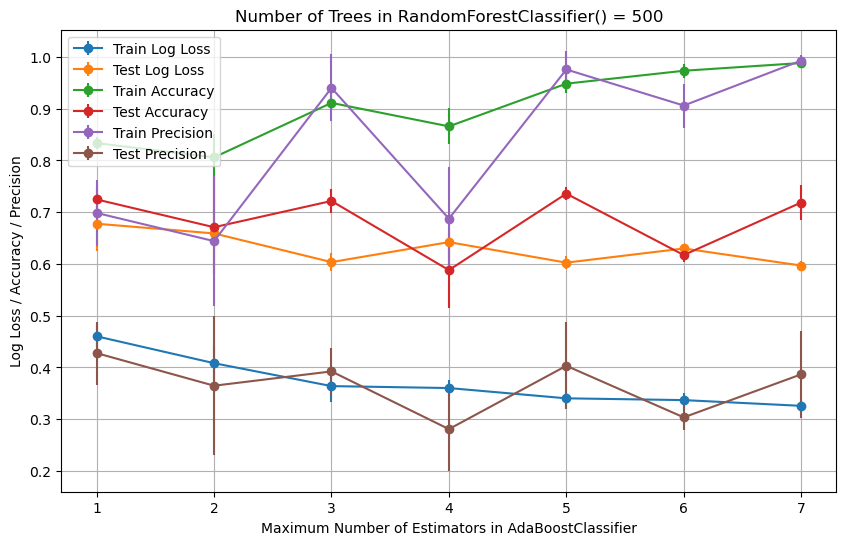

Avg Train Accuracy:
 [0.83341646 0.80598504 0.91122195 0.86583541 0.94837905 0.97331671
 0.9882793 ]
Avg Test Accuracy:
 [0.72462687 0.67089552 0.72164179 0.5880597  0.7358209  0.61716418
 0.71865672]
Avg Train Precision:
 [0.69851332 0.6440442  0.9401717  0.68742939 0.97576931 0.90607931
 0.99296507]
Avg Test Precision:
 [0.42757979 0.36459345 0.39226065 0.28070558 0.40306878 0.30342276
 0.38658028]
Avg Train Log Loss:
 [0.46009509 0.40813177 0.36384593 0.36007845 0.34022287 0.33678712
 0.3256977 ]
Avg Test Log Loss:
 [0.67767428 0.65894742 0.60347556 0.64212586 0.60245681 0.62982737
 0.59683089]


In [200]:
for n_trees in range(20, 510, 20):
    n_estimators_range = list(range(1, 8))

    classifier_params = {
        # 'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in RandomForestClassifier() = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)

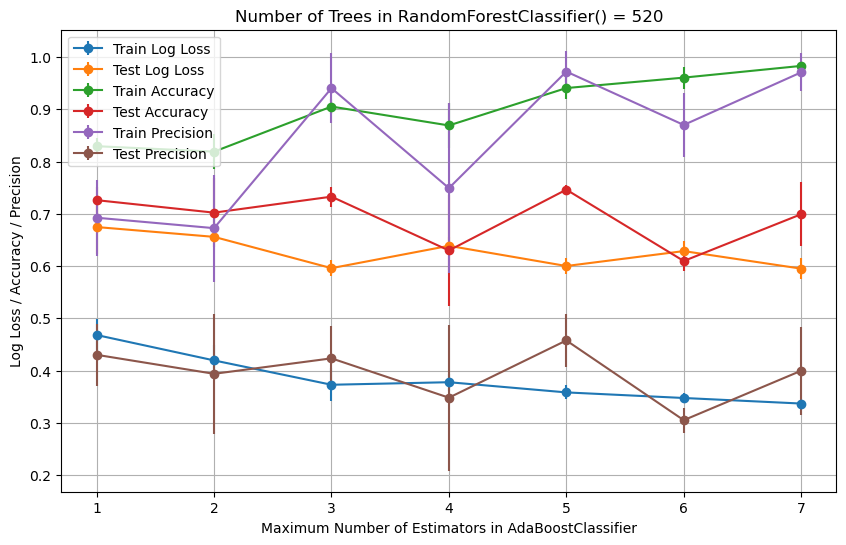

Avg Train Accuracy:
 [0.82942643 0.81895262 0.90523691 0.86907731 0.94064838 0.9605985
 0.98304239]
Avg Test Accuracy:
 [0.7261194  0.70223881 0.73283582 0.62985075 0.74626866 0.60970149
 0.69925373]
Avg Train Precision:
 [0.69253335 0.67257614 0.94041696 0.74917119 0.97216513 0.87001103
 0.97073545]
Avg Test Precision:
 [0.43021496 0.39386408 0.42344949 0.3481577  0.45771475 0.30513282
 0.39974399]
Avg Train Log Loss:
 [0.46807514 0.41949724 0.37291137 0.37778746 0.35828535 0.34759182
 0.33695302]
Avg Test Log Loss:
 [0.67468921 0.65591137 0.59601586 0.63876271 0.60013265 0.62866936
 0.59509123]


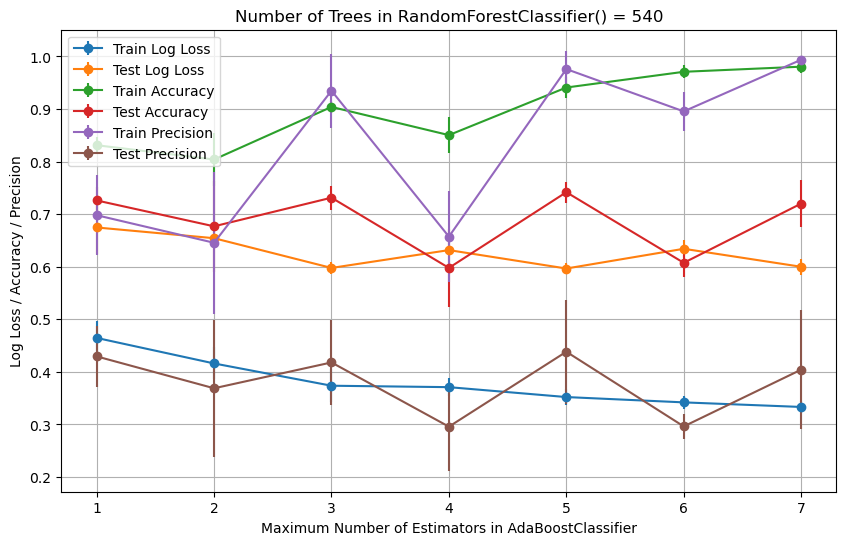

Avg Train Accuracy:
 [0.83117207 0.80399002 0.90399002 0.85037406 0.94089776 0.97082294
 0.98054863]
Avg Test Accuracy:
 [0.7261194  0.67686567 0.73134328 0.59776119 0.74179104 0.60746269
 0.72014925]
Avg Train Precision:
 [0.69803367 0.64558442 0.93480882 0.65726158 0.97597532 0.89547715
 0.99378352]
Avg Test Precision:
 [0.42946938 0.36880105 0.41795519 0.29577835 0.43830688 0.29626868
 0.4042328 ]
Avg Train Log Loss:
 [0.46458387 0.4160288  0.37365304 0.37093575 0.3521009  0.34198058
 0.33326211]
Avg Test Log Loss:
 [0.67468921 0.65428149 0.59771462 0.63163452 0.59660146 0.63413826
 0.5999218 ]


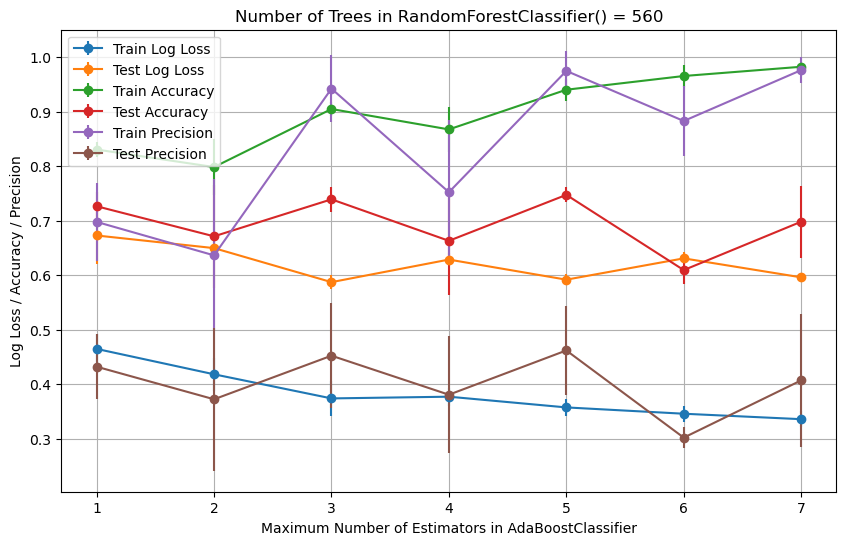

Avg Train Accuracy:
 [0.83092269 0.79875312 0.90523691 0.86783042 0.94064838 0.96583541
 0.98279302]
Avg Test Accuracy:
 [0.72686567 0.67164179 0.73955224 0.66343284 0.74776119 0.60970149
 0.69850746]
Avg Train Precision:
 [0.69812644 0.63671778 0.94265269 0.75263114 0.97517743 0.88328179
 0.97662925]
Avg Test Precision:
 [0.43241008 0.37264296 0.45264214 0.38103627 0.46226601 0.302264
 0.40736111]
Avg Train Log Loss:
 [0.46508262 0.41849962 0.37423822 0.37739854 0.35772631 0.34614515
 0.33613555]
Avg Test Log Loss:
 [0.67319667 0.65002317 0.58759632 0.62901225 0.59212874 0.63123118
 0.59640869]


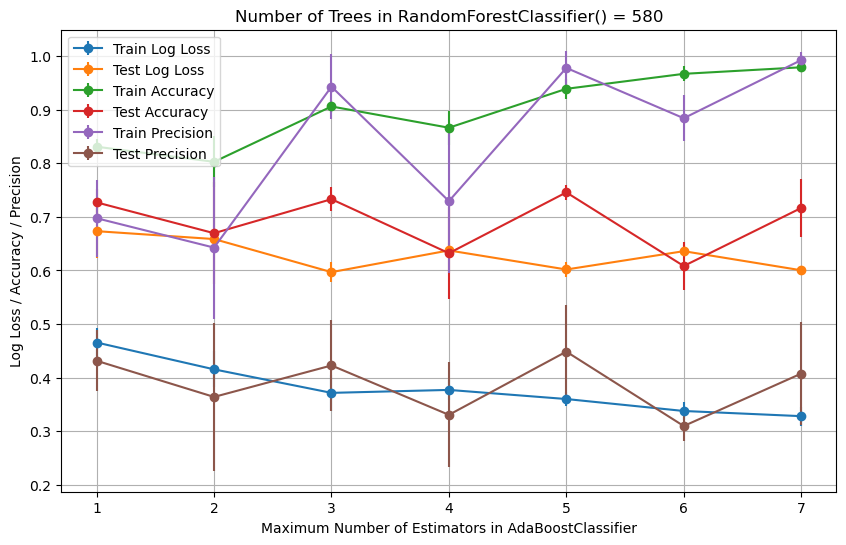

Avg Train Accuracy:
 [0.83067332 0.80249377 0.90573566 0.86608479 0.93865337 0.96658354
 0.97880299]
Avg Test Accuracy:
 [0.72686567 0.66940299 0.73283582 0.63208955 0.74552239 0.60820896
 0.71641791]
Avg Train Precision:
 [0.69734017 0.6425209  0.94265211 0.72919684 0.97761838 0.88379239
 0.99219512]
Avg Test Precision:
 [0.43151366 0.36406321 0.42275926 0.3306894  0.44855991 0.30981785
 0.40757359]
Avg Train Log Loss:
 [0.46558138 0.41551497 0.3716563  0.37717072 0.36016721 0.33787946
 0.32823426]
Avg Test Log Loss:
 [0.67319667 0.65849838 0.59681015 0.63727441 0.60172219 0.63587738
 0.60026669]


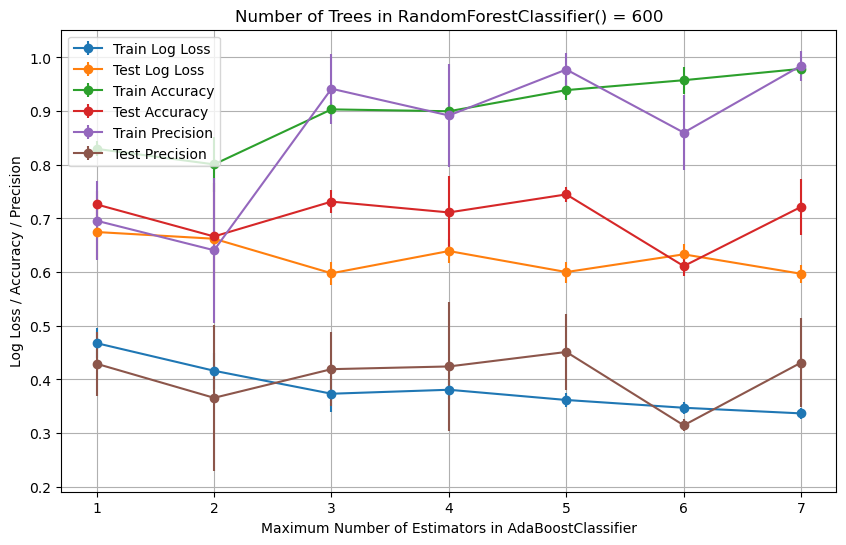

Avg Train Accuracy:
 [0.82967581 0.80074813 0.9032419  0.89975062 0.93915212 0.95760599
 0.97880299]
Avg Test Accuracy:
 [0.7261194  0.66641791 0.73134328 0.71119403 0.74477612 0.61119403
 0.72164179]
Avg Train Precision:
 [0.69572842 0.64073045 0.94171883 0.89186236 0.97751086 0.85994337
 0.98472546]
Avg Test Precision:
 [0.42915676 0.36566945 0.41911227 0.42415362 0.45116004 0.31446826
 0.43141396]
Avg Train Log Loss:
 [0.46757639 0.41615656 0.37332507 0.38072617 0.36166952 0.34719459
 0.33666787]
Avg Test Log Loss:
 [0.67468921 0.66216591 0.59780172 0.63925329 0.60009275 0.63309233
 0.59684904]


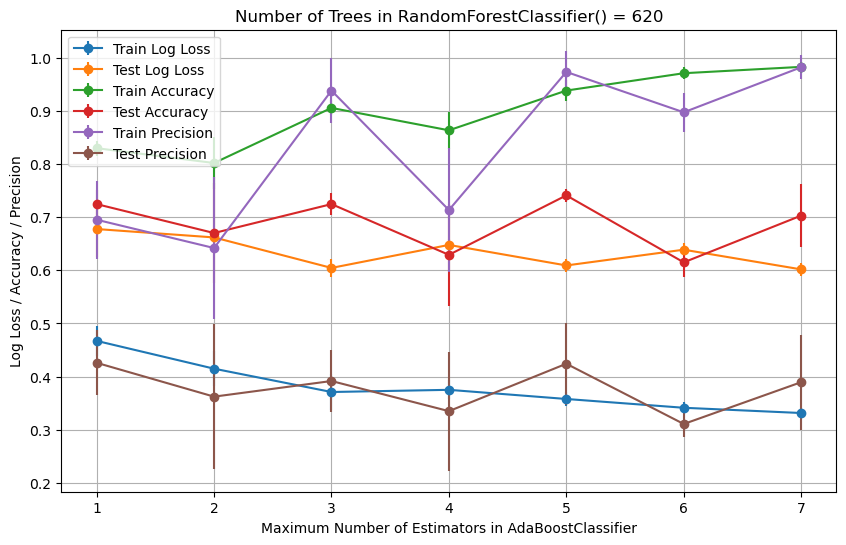

Avg Train Accuracy:
 [0.82992519 0.80199501 0.90573566 0.86359102 0.93840399 0.97107232
 0.98304239]
Avg Test Accuracy:
 [0.72462687 0.67014925 0.72462687 0.62910448 0.74104478 0.61492537
 0.70298507]
Avg Train Precision:
 [0.69521035 0.64188826 0.9383829  0.71346054 0.97351159 0.89748416
 0.98231602]
Avg Test Precision:
 [0.42579575 0.3620592  0.39149932 0.3347671  0.4240199  0.31057901
 0.3893012 ]
Avg Train Log Loss:
 [0.46707764 0.4147174  0.37080357 0.37491035 0.35766802 0.34112321
 0.33124224]
Avg Test Log Loss:
 [0.67767428 0.66187656 0.60446625 0.64775682 0.60910843 0.63878139
 0.60168767]


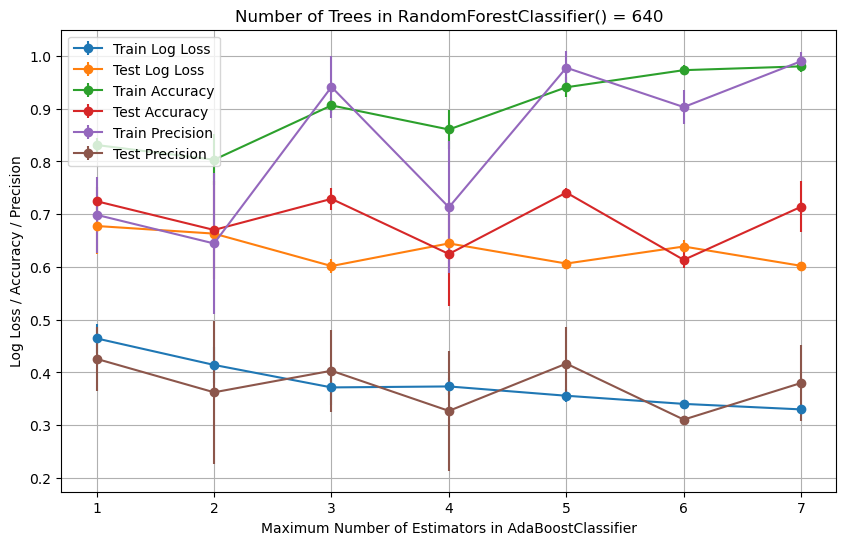

Avg Train Accuracy:
 [0.83117207 0.8032419  0.90623441 0.8605985  0.94064838 0.97306733
 0.98029925]
Avg Test Accuracy:
 [0.72462687 0.67014925 0.72910448 0.62462687 0.74104478 0.61343284
 0.7141791 ]
Avg Train Precision:
 [0.69883292 0.64454583 0.94127887 0.71314835 0.97768409 0.90310196
 0.9900787 ]
Avg Test Precision:
 [0.42579575 0.36243358 0.40332048 0.32720613 0.41682937 0.3106966
 0.3801542 ]
Avg Train Log Loss:
 [0.46458387 0.41432275 0.37170177 0.37353983 0.35590176 0.34047356
 0.33001241]
Avg Test Log Loss:
 [0.67767428 0.66323873 0.60177164 0.64465091 0.60650434 0.63877716
 0.60215356]


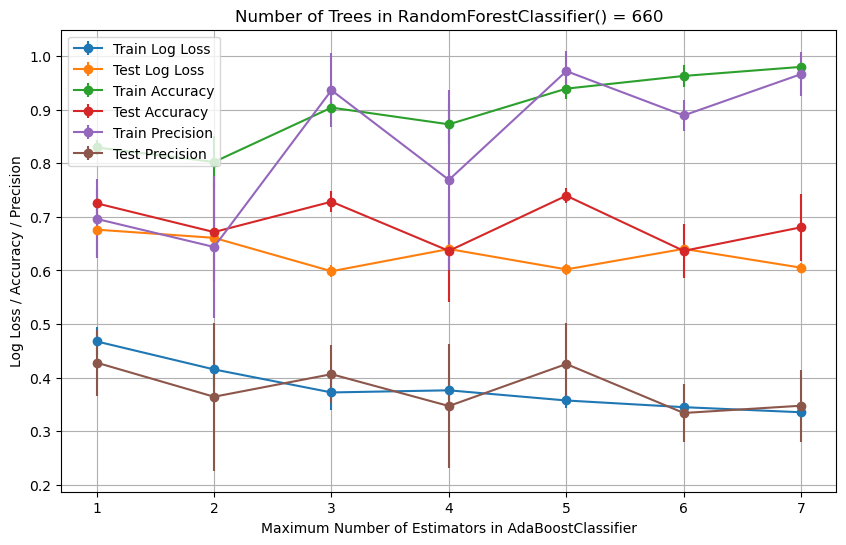

Avg Train Accuracy:
 [0.82967581 0.80249377 0.90399002 0.87281796 0.9394015  0.96309227
 0.98004988]
Avg Test Accuracy:
 [0.72537313 0.67164179 0.72835821 0.63656716 0.73955224 0.63656716
 0.68059701]
Avg Train Precision:
 [0.69625794 0.64380625 0.93641339 0.76908401 0.9720898  0.88939522
 0.96651956]
Avg Test Precision:
 [0.42788634 0.36423731 0.40636735 0.34693435 0.4253702  0.33393285
 0.34752001]
Avg Train Log Loss:
 [0.46757639 0.41525088 0.37229657 0.37626818 0.35726835 0.34479637
 0.33527906]
Avg Test Log Loss:
 [0.67618174 0.66088075 0.59854765 0.64003133 0.60202    0.64029558
 0.60516135]


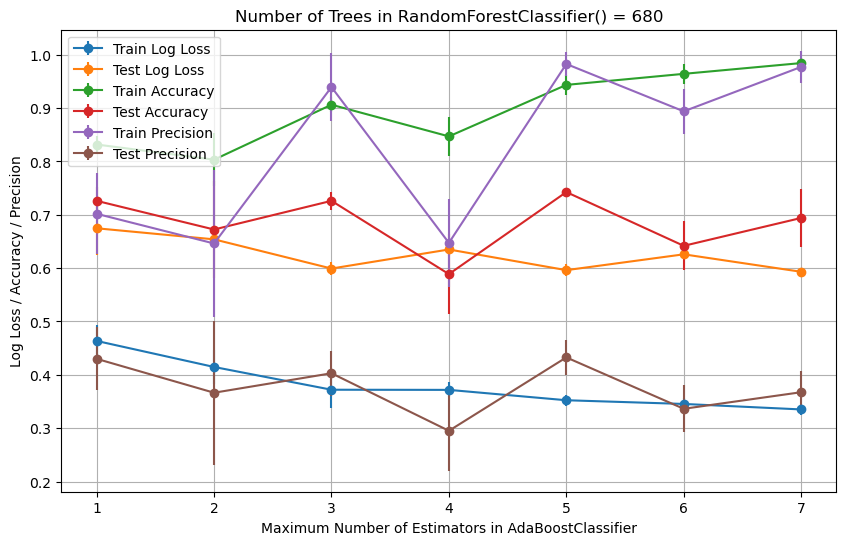

Avg Train Accuracy:
 [0.83167082 0.8032419  0.90623441 0.84688279 0.94339152 0.96408978
 0.98428928]
Avg Test Accuracy:
 [0.7261194  0.67238806 0.7261194  0.58880597 0.74253731 0.64179104
 0.69402985]
Avg Train Precision:
 [0.70183123 0.64617313 0.93928116 0.64731826 0.98255629 0.89381197
 0.97710078]
Avg Test Precision:
 [0.43004882 0.36650437 0.40300064 0.29517293 0.43271283 0.33640022
 0.36748314]
Avg Train Log Loss:
 [0.46358637 0.41477763 0.37213508 0.37184549 0.35243612 0.3454979
 0.33520458]
Avg Test Log Loss:
 [0.67468921 0.65396286 0.59922061 0.6349501  0.59621764 0.62588226
 0.59314618]


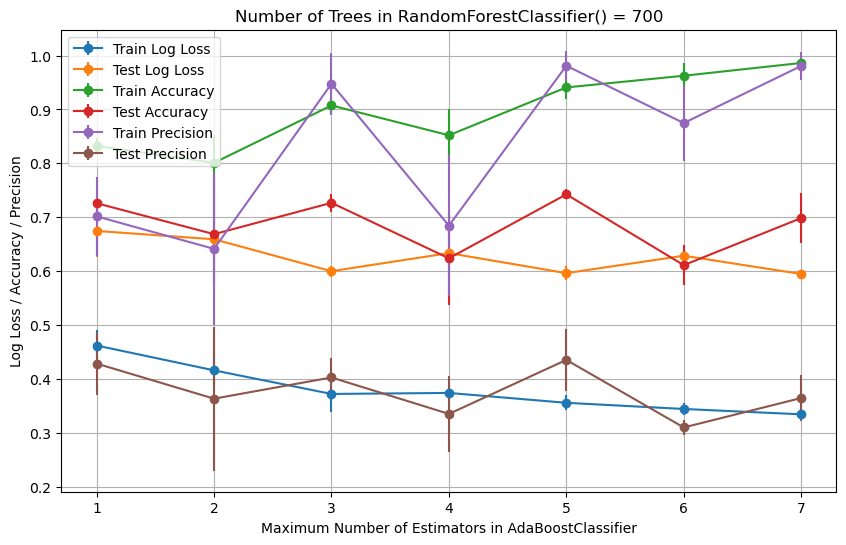

Avg Train Accuracy:
 [0.83241895 0.80099751 0.9074813  0.8521197  0.94089776 0.96259352
 0.98628429]
Avg Test Accuracy:
 [0.7261194  0.66865672 0.72686567 0.6238806  0.74253731 0.61119403
 0.69850746]
Avg Train Precision:
 [0.70174767 0.64137708 0.94773948 0.68444043 0.98110964 0.87482859
 0.9807563 ]
Avg Test Precision:
 [0.42857168 0.36347728 0.40283727 0.33521856 0.43537642 0.31007805
 0.36468223]
Avg Train Log Loss:
 [0.46209011 0.4160308  0.37226215 0.37410976 0.35582397 0.34437559
 0.33443947]
Avg Test Log Loss:
 [0.67468921 0.65917779 0.599989   0.63355694 0.59636546 0.62870803
 0.59474801]


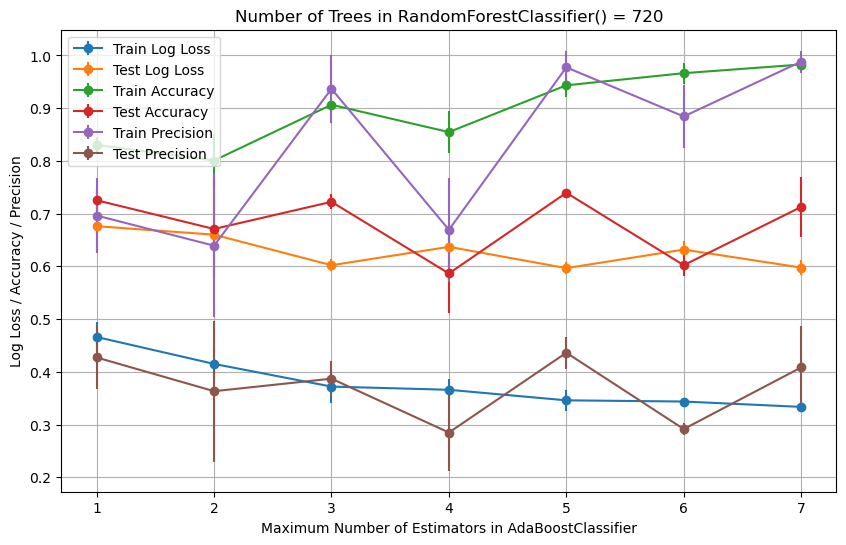

Avg Train Accuracy:
 [0.83042394 0.80074813 0.90648379 0.85461347 0.94339152 0.96633416
 0.98279302]
Avg Test Accuracy:
 [0.72537313 0.67089552 0.72238806 0.58656716 0.73955224 0.60223881
 0.71268657]
Avg Train Precision:
 [0.6963832  0.63920034 0.93663577 0.66932959 0.97740272 0.88427194
 0.98824661]
Avg Test Precision:
 [0.42724394 0.36327239 0.38702148 0.28489832 0.43619068 0.29148407
 0.40833687]
Avg Train Log Loss:
 [0.46608013 0.41499296 0.3720034  0.36595815 0.3459386  0.34367096
 0.3335061 ]
Avg Test Log Loss:
 [0.67618174 0.66008845 0.60218054 0.6370132  0.59666731 0.6318406
 0.59771518]


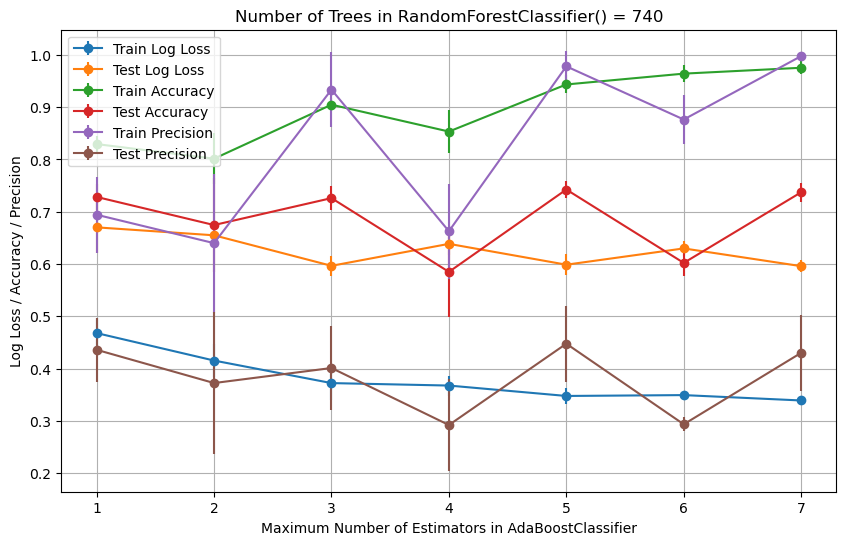

Avg Train Accuracy:
 [0.82942643 0.80149626 0.90473815 0.85336658 0.94339152 0.96408978
 0.97531172]
Avg Test Accuracy:
 [0.72835821 0.67462687 0.7261194  0.58507463 0.74253731 0.60223881
 0.73731343]
Avg Train Precision:
 [0.69431537 0.6400063  0.9335243  0.66284464 0.97800911 0.87638817
 0.99761141]
Avg Test Precision:
 [0.43611063 0.37255045 0.40130942 0.29229504 0.44775667 0.29367356
 0.43035322]
Avg Train Log Loss:
 [0.46807514 0.41556565 0.37247192 0.36776663 0.34787141 0.34950968
 0.33924064]
Avg Test Log Loss:
 [0.67021159 0.65502708 0.59666932 0.63867155 0.59881841 0.62994634
 0.59602754]


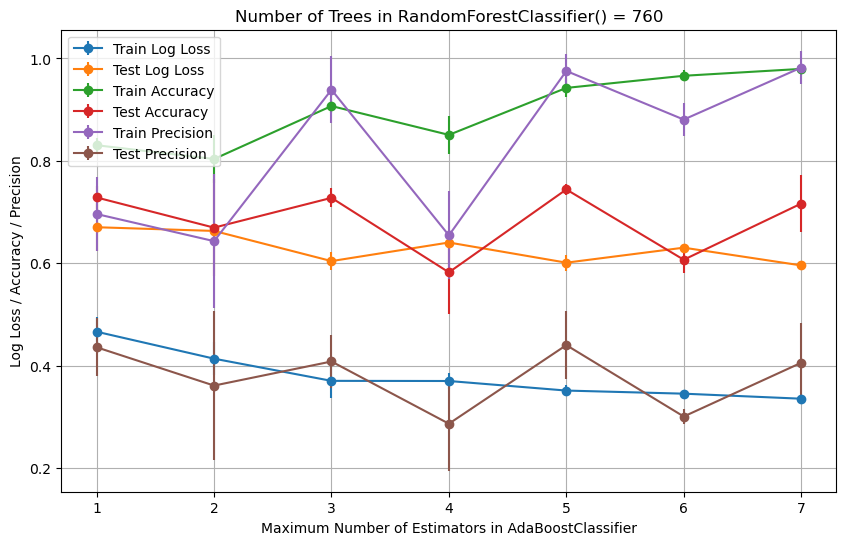

Avg Train Accuracy:
 [0.83042394 0.80349127 0.90698254 0.85062344 0.94239401 0.96608479
 0.97955112]
Avg Test Accuracy:
 [0.72835821 0.66940299 0.72761194 0.58208955 0.74402985 0.60671642
 0.71641791]
Avg Train Precision:
 [0.69598362 0.64302243 0.93880267 0.65436527 0.97545932 0.88054447
 0.98207238]
Avg Test Precision:
 [0.43565421 0.36084667 0.40792437 0.28633794 0.43988928 0.30042146
 0.40541148]
Avg Train Log Loss:
 [0.46608013 0.41342663 0.37007679 0.36979468 0.35111557 0.34503589
 0.33521291]
Avg Test Log Loss:
 [0.67021159 0.66299536 0.60404969 0.64037403 0.60097893 0.63028366
 0.59563188]


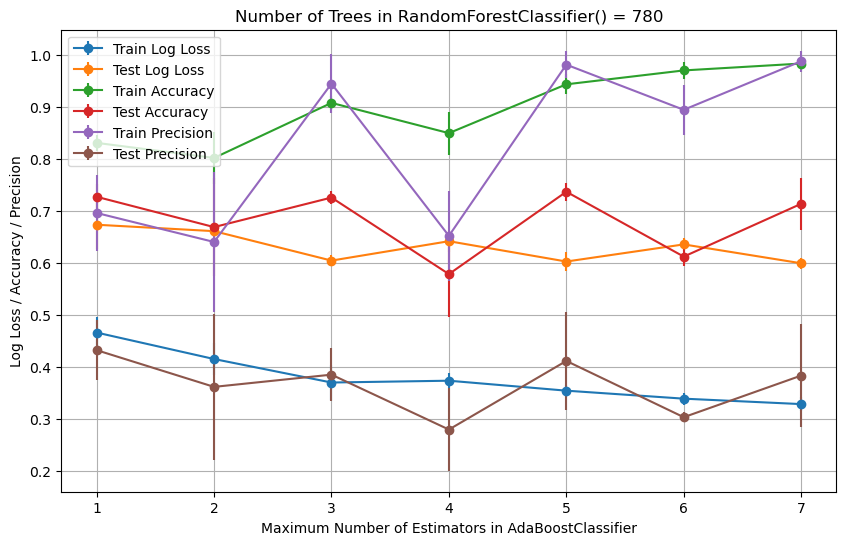

Avg Train Accuracy:
 [0.83042394 0.80149626 0.90723192 0.84912718 0.94289277 0.96957606
 0.98279302]
Avg Test Accuracy:
 [0.72686567 0.66865672 0.72537313 0.57835821 0.73656716 0.6119403
 0.71343284]
Avg Train Precision:
 [0.6957674  0.64006051 0.94417079 0.65181727 0.98065944 0.89393344
 0.98722521]
Avg Test Precision:
 [0.43226418 0.36175299 0.38522331 0.27977266 0.41156619 0.30349752
 0.38344861]
Avg Train Log Loss:
 [0.46608013 0.4152412  0.37011339 0.37359897 0.35446752 0.33911338
 0.32867099]
Avg Test Log Loss:
 [0.67319667 0.66086463 0.60431196 0.64155679 0.60250504 0.63540423
 0.59916496]


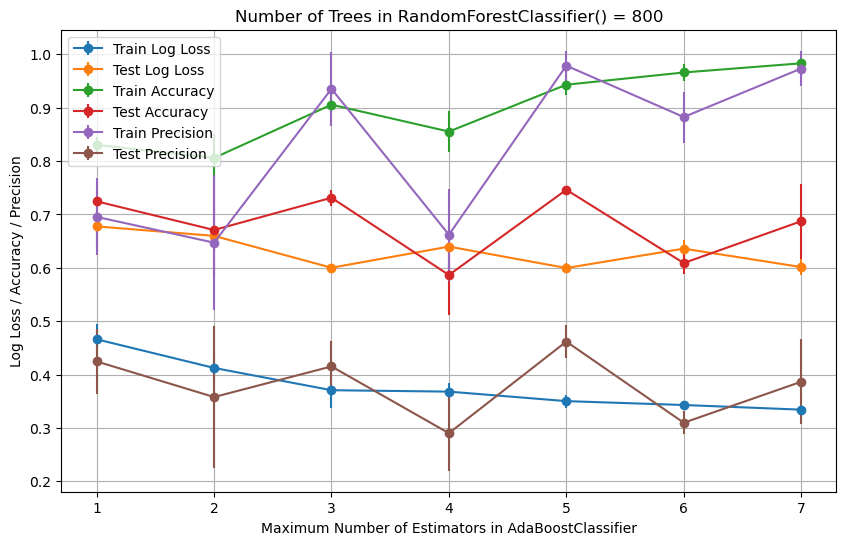

Avg Train Accuracy:
 [0.83042394 0.80598504 0.90573566 0.8553616  0.94314214 0.96608479
 0.98329177]
Avg Test Accuracy:
 [0.72462687 0.67089552 0.73134328 0.58656716 0.74626866 0.60895522
 0.68731343]
Avg Train Precision:
 [0.69550642 0.64713509 0.93539069 0.66203966 0.9788817  0.88257492
 0.97345972]
Avg Test Precision:
 [0.42459868 0.35785034 0.4152201  0.29012031 0.46177093 0.30967782
 0.38647655]
Avg Train Log Loss:
 [0.46608013 0.41240446 0.37066236 0.36800584 0.35019614 0.3429253
 0.33419393]
Avg Test Log Loss:
 [0.67767428 0.65990038 0.60018018 0.63979767 0.59967231 0.6359679
 0.60147285]


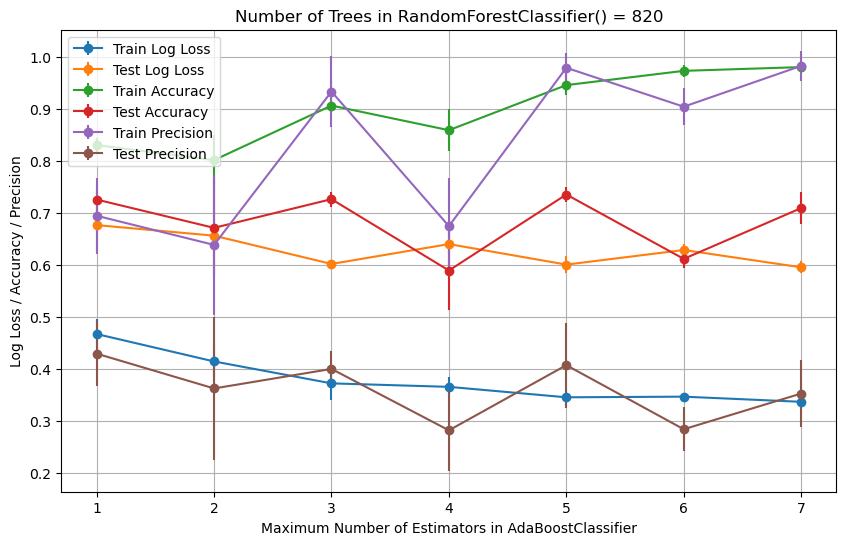

Avg Train Accuracy:
 [0.83017456 0.80124688 0.90623441 0.85885287 0.94563591 0.97306733
 0.98029925]
Avg Test Accuracy:
 [0.72537313 0.67089552 0.7261194  0.58880597 0.73507463 0.61119403
 0.70895522]
Avg Train Precision:
 [0.69417845 0.63806747 0.93312356 0.67420506 0.97895299 0.90406294
 0.98258132]
Avg Test Precision:
 [0.4288059  0.36182184 0.39943216 0.28121465 0.40663545 0.2833085
 0.35201307]
Avg Train Log Loss:
 [0.46657888 0.41379955 0.37161513 0.36489426 0.34478567 0.3460174
 0.33610262]
Avg Test Log Loss:
 [0.67618174 0.65586051 0.60141246 0.63966409 0.60018262 0.62828302
 0.59495806]


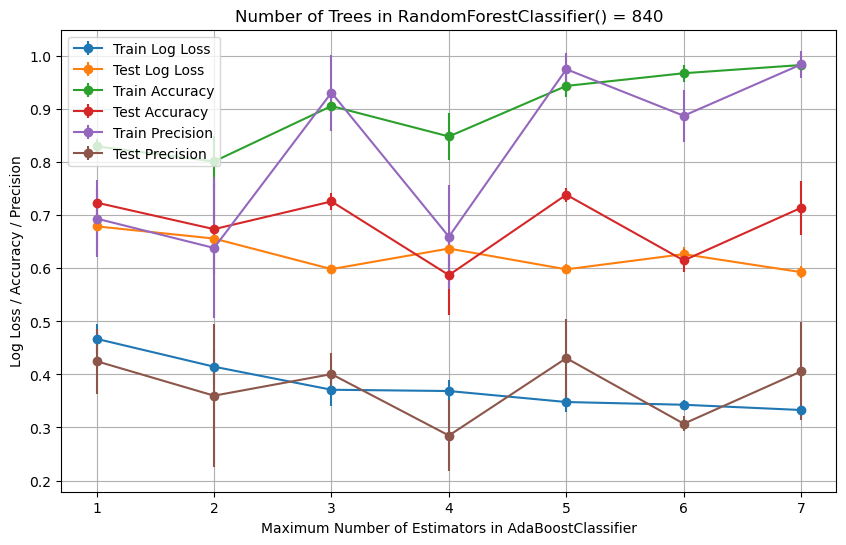

Avg Train Accuracy:
 [0.82992519 0.80149626 0.90598504 0.84862843 0.94389027 0.96783042
 0.98329177]
Avg Test Accuracy:
 [0.7238806  0.6738806  0.7261194  0.58731343 0.73880597 0.61492537
 0.7141791 ]
Avg Train Precision:
 [0.69382498 0.63840608 0.93122273 0.65968345 0.97536585 0.88762513
 0.98446997]
Avg Test Precision:
 [0.42491771 0.35995801 0.40060243 0.28484909 0.43074675 0.30708447
 0.40577501]
Avg Train Log Loss:
 [0.46707764 0.41460678 0.3711372  0.36873798 0.34800186 0.34285311
 0.33293223]
Avg Test Log Loss:
 [0.67916682 0.6561731  0.59855561 0.63732308 0.59813927 0.62675625
 0.59284065]


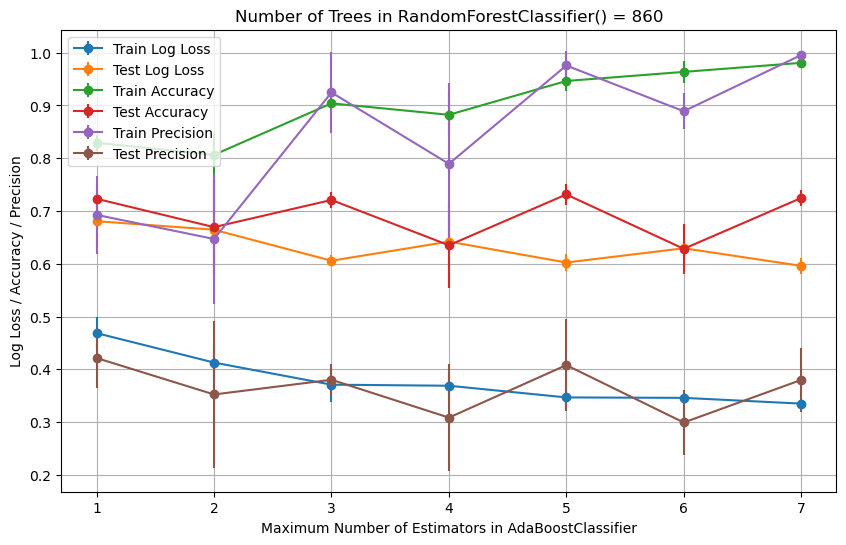

Avg Train Accuracy:
 [0.82917706 0.80648379 0.90399002 0.88229426 0.94638404 0.96359102
 0.980798  ]
Avg Test Accuracy:
 [0.72313433 0.66940299 0.72089552 0.63507463 0.73134328 0.62835821
 0.72462687]
Avg Train Precision:
 [0.69262687 0.64698724 0.92465491 0.78937247 0.97571807 0.88900947
 0.99551648]
Avg Test Precision:
 [0.42135204 0.35235119 0.38017765 0.30852237 0.40793651 0.29924045
 0.37987859]
Avg Train Log Loss:
 [0.4685739  0.41277617 0.37089736 0.36888168 0.34673306 0.34592172
 0.3349978 ]
Avg Test Log Loss:
 [0.68065935 0.66448259 0.6057881  0.64195482 0.60235195 0.62939238
 0.59606901]


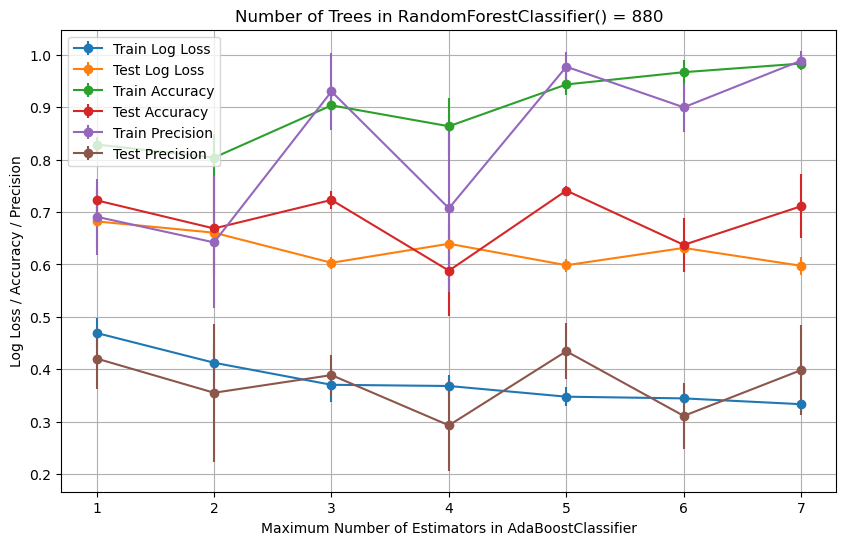

Avg Train Accuracy:
 [0.82892768 0.80399002 0.90374065 0.8638404  0.9436409  0.96708229
 0.98354115]
Avg Test Accuracy:
 [0.72238806 0.66865672 0.72313433 0.5880597  0.74104478 0.63731343
 0.71119403]
Avg Train Precision:
 [0.69102586 0.64207833 0.93023369 0.70722255 0.97756223 0.90000175
 0.98918209]
Avg Test Precision:
 [0.42025314 0.35493759 0.38867015 0.29269692 0.43422347 0.31074862
 0.39821453]
Avg Train Log Loss:
 [0.46907265 0.41225853 0.37013671 0.36786079 0.34742512 0.34420157
 0.33309207]
Avg Test Log Loss:
 [0.68215189 0.66058979 0.60314702 0.63947019 0.59848207 0.63150362
 0.59735358]


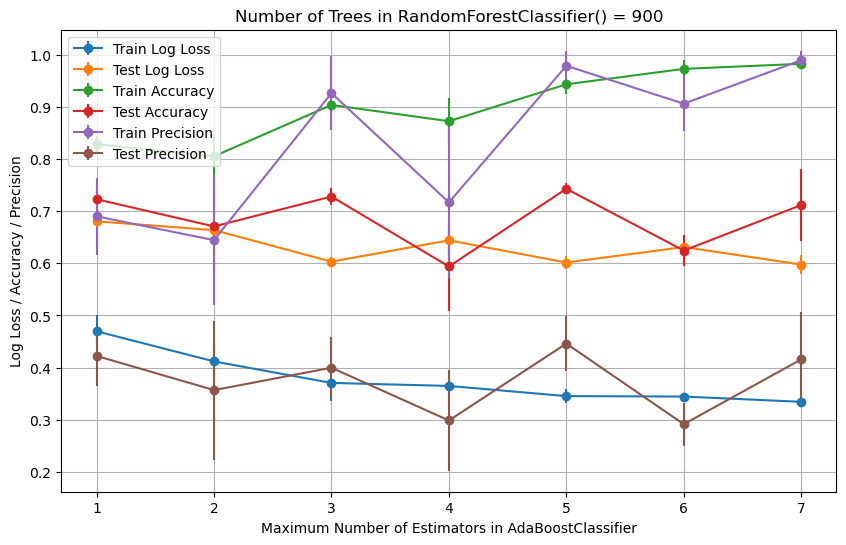

Avg Train Accuracy:
 [0.8286783  0.80573566 0.9042394  0.87306733 0.94389027 0.97356608
 0.98329177]
Avg Test Accuracy:
 [0.72313433 0.67089552 0.72835821 0.59402985 0.74328358 0.62462687
 0.7119403 ]
Avg Train Precision:
 [0.69030402 0.64463411 0.9269575  0.71715828 0.97942979 0.90665537
 0.99010607]
Avg Test Precision:
 [0.42222759 0.35657908 0.39959635 0.29827997 0.44591752 0.29113332
 0.41555726]
Avg Train Log Loss:
 [0.4695714  0.41167998 0.37039375 0.36460381 0.3450959  0.34423301
 0.33411286]
Avg Test Log Loss:
 [0.68065935 0.66384132 0.60325775 0.6442999  0.60158983 0.63135722
 0.59771322]


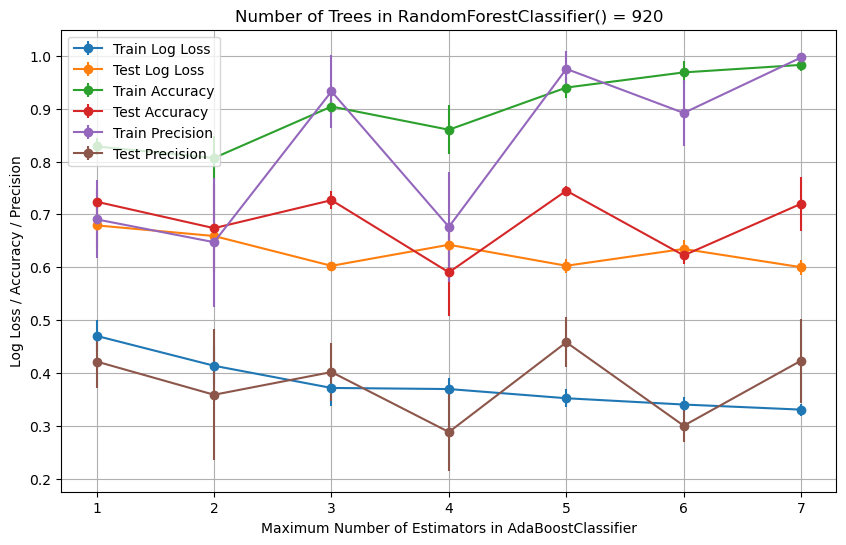

Avg Train Accuracy:
 [0.82842893 0.80673317 0.90399002 0.86009975 0.93990025 0.96857855
 0.98279302]
Avg Test Accuracy:
 [0.7238806  0.6738806  0.72686567 0.59029851 0.74477612 0.62238806
 0.72014925]
Avg Train Precision:
 [0.69050367 0.64735562 0.93262656 0.67634364 0.97520073 0.89183452
 0.99679947]
Avg Test Precision:
 [0.42154581 0.35868758 0.40163491 0.2881438  0.4579369  0.30012281
 0.42334332]
Avg Train Log Loss:
 [0.47007016 0.41358255 0.37159133 0.36950898 0.35210471 0.34019434
 0.33055804]
Avg Test Log Loss:
 [0.67916682 0.65906343 0.60264021 0.64249711 0.60274535 0.6345731
 0.59999939]


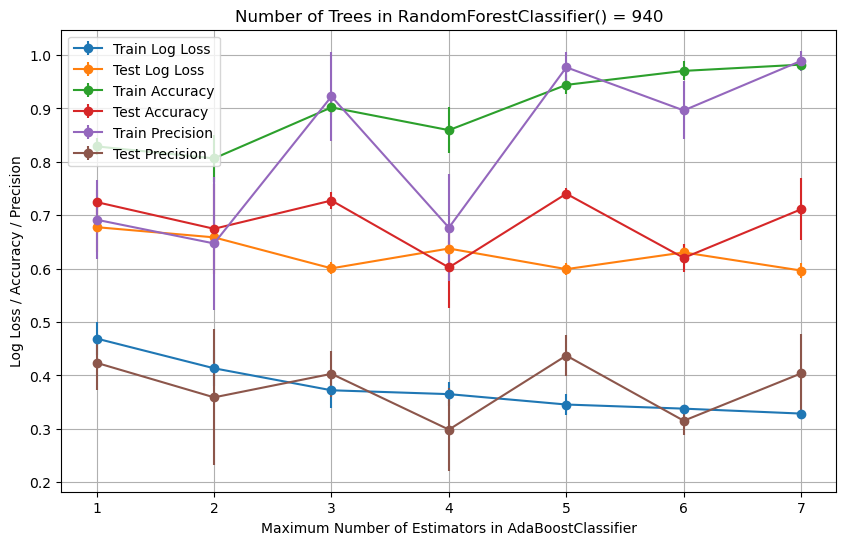

Avg Train Accuracy:
 [0.82892768 0.80648379 0.90199501 0.85935162 0.94413965 0.97032419
 0.98204489]
Avg Test Accuracy:
 [0.72462687 0.67462687 0.72761194 0.60223881 0.74029851 0.62014925
 0.71119403]
Avg Train Precision:
 [0.69159515 0.64720858 0.92247394 0.6767865  0.9770217  0.89627047
 0.98920822]
Avg Test Precision:
 [0.42361898 0.35896409 0.40300984 0.29857721 0.43723242 0.31516646
 0.40389756]
Avg Train Log Loss:
 [0.46907265 0.41341934 0.3722175  0.36500331 0.3455377  0.33783938
 0.32859134]
Avg Test Log Loss:
 [0.67767428 0.65858956 0.60057323 0.63768985 0.59906442 0.63040725
 0.59642401]


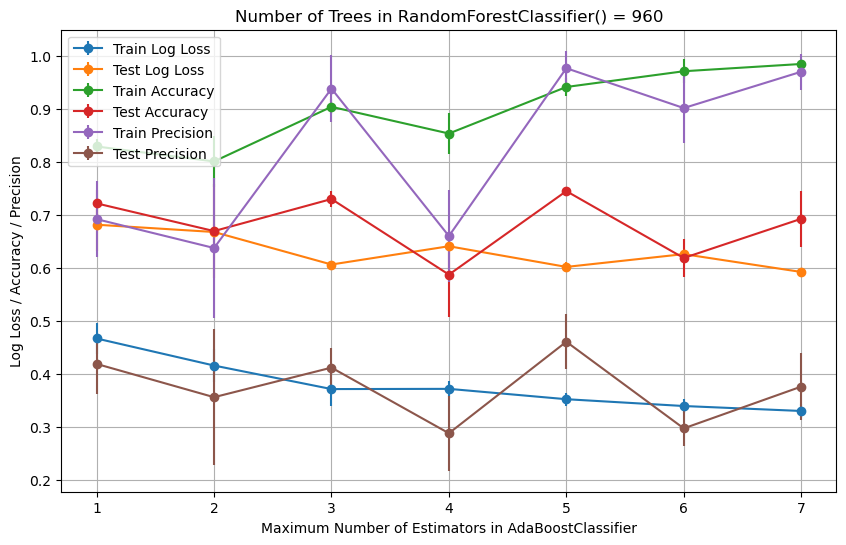

Avg Train Accuracy:
 [0.82967581 0.80149626 0.90448878 0.85411471 0.94189526 0.97157107
 0.98528678]
Avg Test Accuracy:
 [0.72238806 0.67014925 0.73059701 0.5880597  0.74552239 0.61940299
 0.69328358]
Avg Train Precision:
 [0.69263969 0.63820852 0.93880136 0.66076633 0.97727491 0.9021366
 0.97061496]
Avg Test Precision:
 [0.41958779 0.35686171 0.41264616 0.28887515 0.46143369 0.29807131
 0.37679831]
Avg Train Log Loss:
 [0.46757639 0.41657517 0.37220249 0.37259678 0.35308658 0.34024203
 0.33088584]
Avg Test Log Loss:
 [0.68215189 0.66841525 0.60709312 0.64157202 0.60257277 0.62668557
 0.59306132]


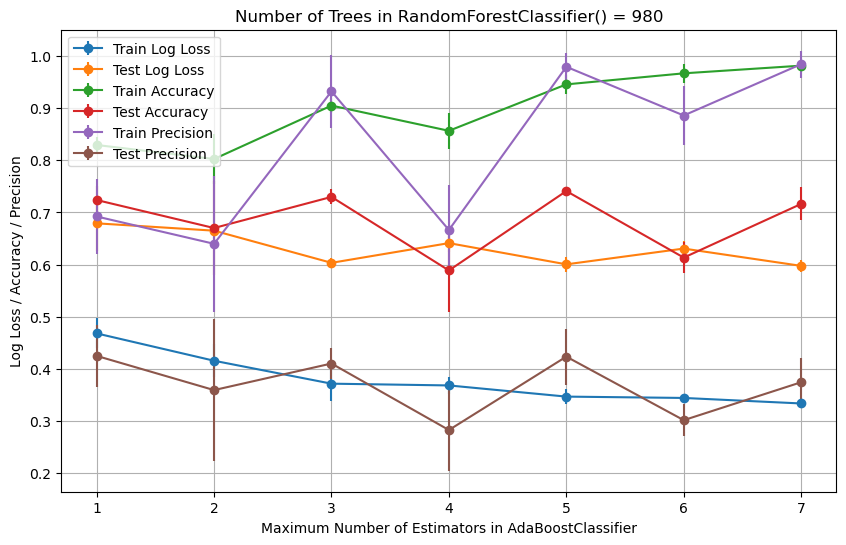

Avg Train Accuracy:
 [0.82942643 0.80249377 0.90498753 0.85660848 0.94563591 0.96683292
 0.98154613]
Avg Test Accuracy:
 [0.7238806  0.67014925 0.72985075 0.58880597 0.74104478 0.61343284
 0.71641791]
Avg Train Precision:
 [0.69231606 0.63989102 0.93221351 0.66642407 0.9793775  0.88595761
 0.98441772]
Avg Test Precision:
 [0.42493811 0.35933524 0.41030751 0.28275613 0.42350682 0.30165014
 0.37442204]
Avg Train Log Loss:
 [0.46807514 0.41563401 0.37165862 0.36826882 0.34684588 0.34427402
 0.33368923]
Avg Test Log Loss:
 [0.67916682 0.66508794 0.60341482 0.64123555 0.60050986 0.63074435
 0.59756748]


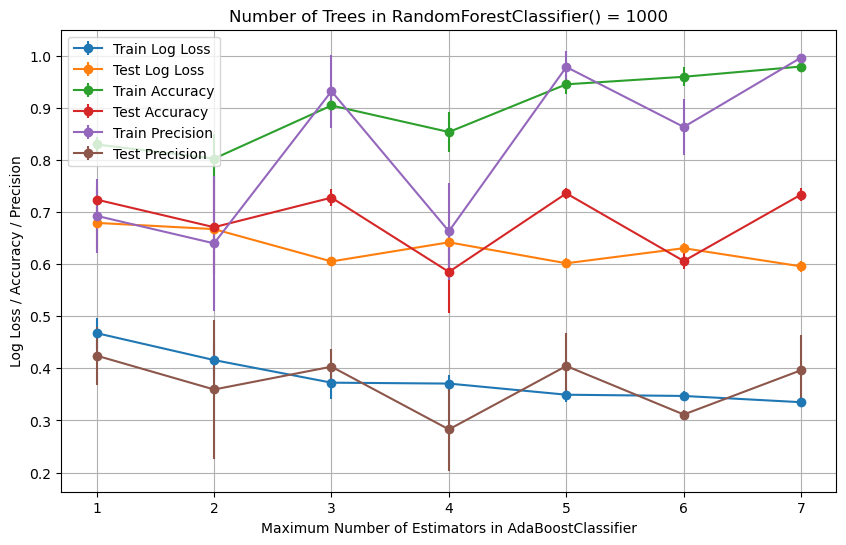

Avg Train Accuracy:
 [0.82967581 0.80249377 0.90448878 0.85361596 0.94513716 0.959601
 0.97930175]
Avg Test Accuracy:
 [0.7238806  0.67089552 0.72761194 0.58507463 0.7358209  0.60597015
 0.73358209]
Avg Train Precision:
 [0.69268972 0.63987437 0.9318934  0.66310607 0.97839506 0.86327733
 0.99655172]
Avg Test Precision:
 [0.4243497  0.35936536 0.40316732 0.28276569 0.40447152 0.31135649
 0.39643098]
Avg Train Log Loss:
 [0.46757639 0.41585257 0.37246269 0.37071643 0.34934305 0.34696998
 0.33496075]
Avg Test Log Loss:
 [0.67916682 0.6672207  0.60517769 0.64187557 0.60166469 0.63059708
 0.59567477]


In [202]:
for n_trees in range(520, 1010, 20):
    n_estimators_range = list(range(1, 8))

    classifier_params = {
        'criterion': 'log_loss',
        'max_depth': 5,
        'min_samples_leaf': 5,
        # 'min_samples_split': 5,
        'n_estimators': n_trees,
    }
    xlabel = 'Maximum Number of Estimators in AdaBoostClassifier'
    ylabel = 'Log Loss / Accuracy / Precision'
    title = f'Number of Trees in RandomForestClassifier() = {n_trees}'

    modifyBestModel(n_estimators_range, classifier_params, xlabel, ylabel, title)